# Network embedding

In this notebook we aim to derive a node embedding for the regulatory network of U2OS cells that we derived in our preceeding analyses. To this end, we will train a Graph-convolutional AutoEncoder. To assess the stability of the embeddings we will experiment with different input features, training objectives and initializations and compare the clustering of the inferred latent spaces i.a. to embeddings obtained from a DeepWalk model. On the basis of those analyses we will finally identify a stable node embedding for the genes in the input regulatory network. Those embeddings will span our estimate of the regulatory state in U2OS cells.

---

## 0. Environmental setup

First, we will load all required libraries.

In [1]:
import pandas as pd
import networkx as nx
import numpy as np
import seaborn as sns
import sys
import os
import random
import torch
from tqdm import tqdm
import matplotlib.pyplot as plt
import community as community_louvain
from torch_geometric.data import Data
from torch import LongTensor, FloatTensor
from node2vec import Node2Vec
from torch_geometric.nn import GAE
from torch_geometric.utils import train_test_split_edges, from_networkx
import torch_geometric.transforms as T
from torch_geometric.nn import InnerProductDecoder
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler, RobustScaler, MinMaxScaler
import scanpy as sc
from sklearn.cluster import AgglomerativeClustering, KMeans
from sklearn.metrics import adjusted_mutual_info_score
from scipy.stats import spearmanr, pearsonr
from sklearn.cluster import KMeans
from yellowbrick.cluster.elbow import kelbow_visualizer
from yellowbrick.cluster import KElbowVisualizer

from scipy.spatial.distance import pdist, squareform
import scipy.spatial as sp, scipy.cluster.hierarchy as hc

sys.path.append("../../../")

from src.utils.torch.network import *
from src.utils.notebooks.ppi.embedding import *
from src.utils.basic.io import get_genesets_from_gmt_file
from src.models.ae import CustomGAE, GCNEncoder

seed = 1234

plt.style.use("default")

%load_ext nb_black

<IPython.core.display.Javascript object>

In [2]:
def label_point(x, y, val, ax):
    for i in range(len(x)):
        ax.text(x[i] + 0.02, y[i], val[i], {"size": 10})

<IPython.core.display.Javascript object>

---

## 1. Read in data

Next, we will read in the regulatory graph data along side with a scRNA-seq data set and a number of hallmark geneset information. The latter two will be used to define further node features and update the correlation information for the interactions in the graph.

In [3]:
spearman_interactome = nx.read_gpickle(
    "../../../data/ppi/inference_results/cv/conf_hub_spearman_sol_cv.pkl"
)
print(nx.info(spearman_interactome))

Name: conf_hub_spearman_sol
Type: Graph
Number of nodes: 244
Number of edges: 521
Average degree:   4.2705


<IPython.core.display.Javascript object>

In [4]:
gex_adata = sc.read("../../../data/gex/scrnaseq/fucci_adata.h5")
gex_adata.var_names_make_unique()
gex_data = pd.DataFrame(
    gex_adata.X, columns=gex_adata.var_names, index=gex_adata.obs_names
)
gex_data.columns = [c.upper() for c in gex_data.columns]
gex_data = gex_data.loc[
    :, set(spearman_interactome.nodes()).intersection(gex_data.columns)
]

<IPython.core.display.Javascript object>

In addition to the 50 Hallmark gene sets, we also load the gene sets corresponding to pathways involved in mechanotransduction: cell cycle control, regulation of chromatin organization and actin cytoskeleton, DNA damage repair, cell death and transcription factors.

In [5]:
cc_genes = set(
    pd.read_csv("../../../data/other/reactome_cell_cycle.txt", index_col=0).index
)
co_genes = set(
    pd.read_csv("../../../data/other/reactome_chrom_org.txt", index_col=0).index
)
dr_genes = set(
    pd.read_csv("../../../data/other/reactome_dna_repair.txt", index_col=0).index
)
cd_genes = set(
    pd.read_csv("../../../data/other/reactome_cell_death.txt", index_col=0).index
)
cr_genes = set(
    pd.read_csv("../../../data/other/kegg_reg_act_cytoskeleton.txt", index_col=0).index
)
tfs = set(pd.read_csv("../../../data/other/human_tf_list.txt", index_col=0).index)

spec_results = pd.read_csv(
    "../../../data/other/specificity_screen_results_cv.csv", index_col=0
)
spec_results = spec_results.loc[spec_results["selected"]]
spec_orf_targets = set(spec_results.index)
hallmark_geneset_dict = get_genesets_from_gmt_file(
    "../../../data/other/h.all.v7.4.symbols.gmt"
)

<IPython.core.display.Javascript object>

---
---

## 2. Preprocessing

We will now set the respective node and edge attributes computed based on the previously loaded information. Note, that the single-cell gene expression data is min-max-scaled.

### 2.1. Attribute setting

In [6]:
gex_data_z = pd.DataFrame(
    MinMaxScaler().fit_transform(gex_data.transpose()),
    index=gex_data.transpose().index,
    columns=gex_data.transpose().columns,
).transpose()

<IPython.core.display.Javascript object>

In [7]:
for node in spearman_interactome.nodes(data=True):
    node[-1]["sc_gex"] = np.array(gex_data_z.loc[:, node[0]])
    node[-1]["sc_gex"] = node[-1]["sc_gex"]
    node[-1]["name"] = node[0]
    node[-1]["cell_cycle"] = node[0] in cc_genes
    node[-1]["chromatin_org"] = node[0] in co_genes
    node[-1]["dna_repair"] = node[0] in dr_genes
    node[-1]["cytoskeleton_org"] = node[0] in cr_genes
    node[-1]["cell_death"] = node[0] in cd_genes
    node[-1]["tf"] = node[0] in tfs
    node[-1]["spec_target"] = node[0] in spec_orf_targets

    gene_memberships = []
    for geneset in hallmark_geneset_dict.values():
        if node[0] in geneset:
            gene_memberships.append(1.0)
        else:
            gene_memberships.append(0.0)

    node[-1]["hallmark"] = np.array(gene_memberships)
    node[-1]["sc_gex_hallmark"] = np.concatenate(
        [node[-1]["sc_gex"], node[-1]["hallmark"]]
    )

for edge in spearman_interactome.edges(data=True):
    edge[-1]["spearmanr"] = spearmanr(
        gex_data.loc[:, edge[0]], gex_data.loc[:, edge[1]]
    )[0]
    edge[-1]["pearsonr"] = pearsonr(gex_data.loc[:, edge[0]], gex_data.loc[:, edge[1]])[
        0
    ]

<IPython.core.display.Javascript object>

---

### 2.2 Data preparation

Next, we transform the graph into a data object complient with the used pytorch_geometric framework to learn the graph embeddings.

In [8]:
# device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
device = torch.device("cpu")

graph_data = from_networkx(spearman_interactome)
graph_data.id = torch.FloatTensor(np.identity(len(spearman_interactome)))
graph_data = T.ToDevice(
    device,
    attrs=[
        "id",
        "sc_gex",
        "pbulk_gex",
        "hallmark",
        "sc_gex_hallmark",
        "pbulk_gex_hallmark",
    ],
)(graph_data)

<IPython.core.display.Javascript object>

---
---

## 3. Node embeddings


After having finally prepared the data, we can now start inferring node embeddings from the data. For each model type, we will vary the initialization 5 times using different random seeds. In a first step, we will assess the similarity between the inferred latent spaces by pairwise comparing the hierarchical co-clustering of the inferred spaces pairwise using the adjusted mutual information.
In the second step, we will assess the individual inferred latent spaces for a fixed random initialization and compare the similarity of the inferred embeddings between the different model setups in a similar fashion.

---

### 3.1. Assessing the stability of the inferred latent spaces

#### 3.1.1. Node2Vec

We will first start with a simple baseline model that is purely based on the network topology and embedds the nodes via encoding neighborhood simularity using random walks on the graph. The model requires a number of hyperparameters, which we initially keep constant for the stability assessment.

In [9]:
seeds = [1234, 2345, 3456, 4567]
latent_dims = [32, 64, 128]

<IPython.core.display.Javascript object>

100%|██████████| 100/100 [01:05<00:00,  1.53it/s]

Final loss: 0.9382940608947004


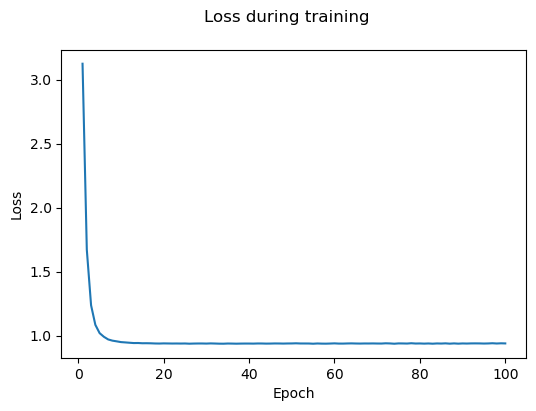

100%|██████████| 100/100 [01:05<00:00,  1.52it/s]

Final loss: 0.9377394914627075


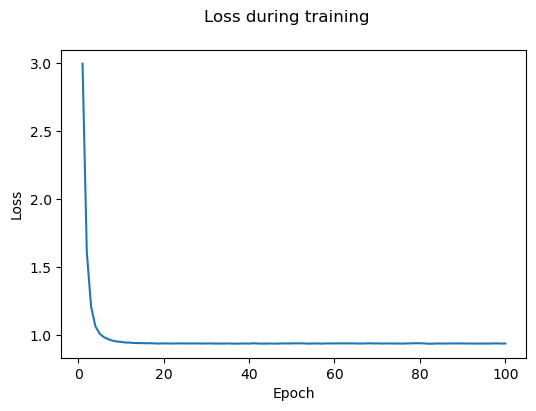

100%|██████████| 100/100 [01:05<00:00,  1.52it/s]

Final loss: 0.9370698156904002


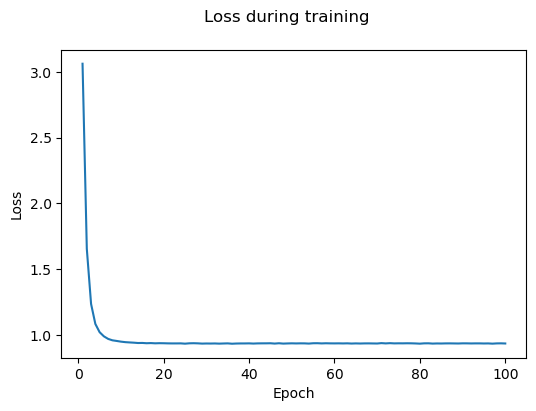

100%|██████████| 100/100 [01:05<00:00,  1.52it/s]

Final loss: 0.9377651615220992


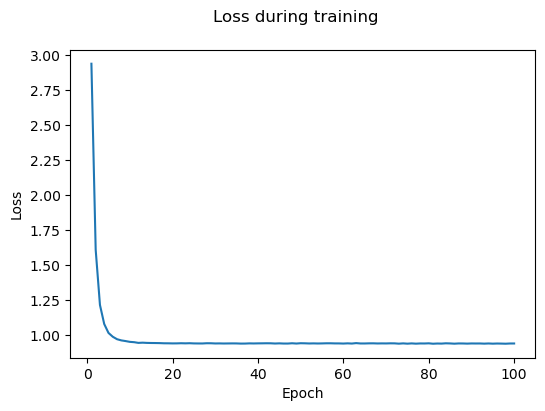

100%|██████████| 4/4 [00:02<00:00,  1.69it/s]


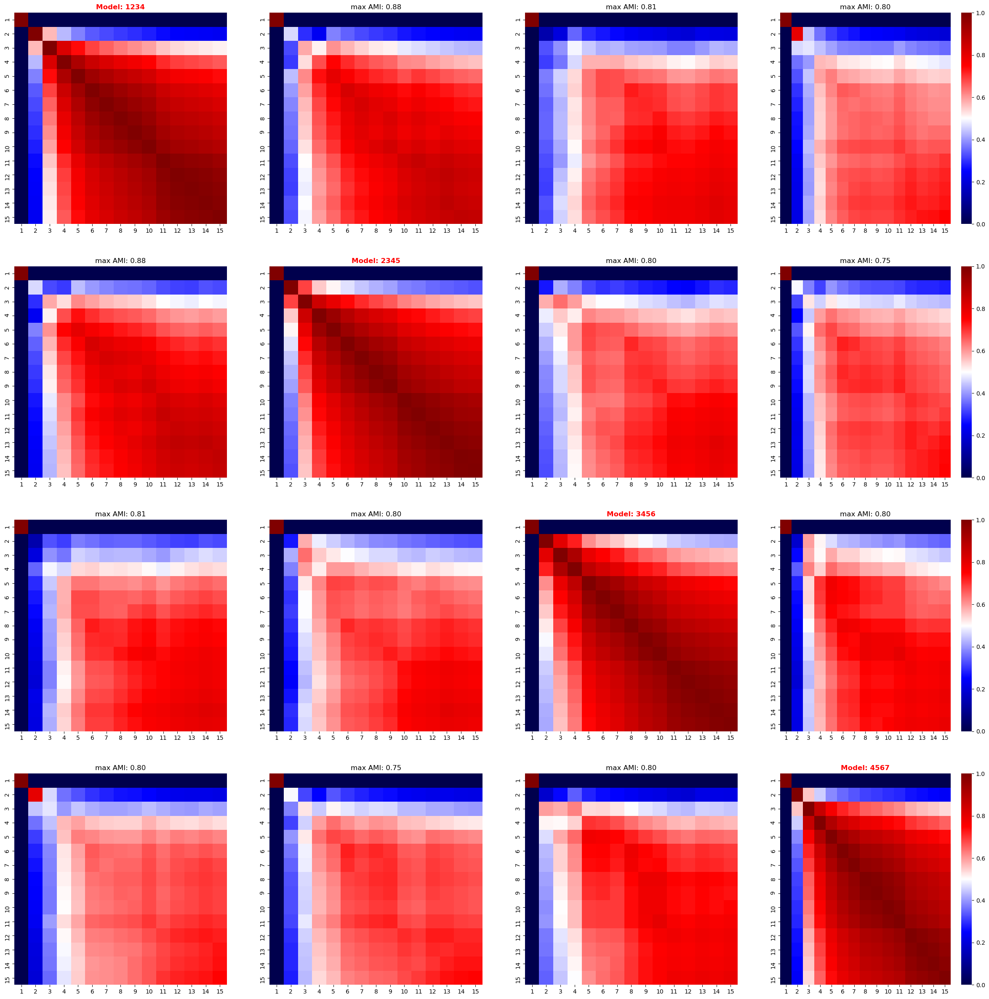

100%|██████████| 4/4 [00:02<00:00,  1.72it/s]


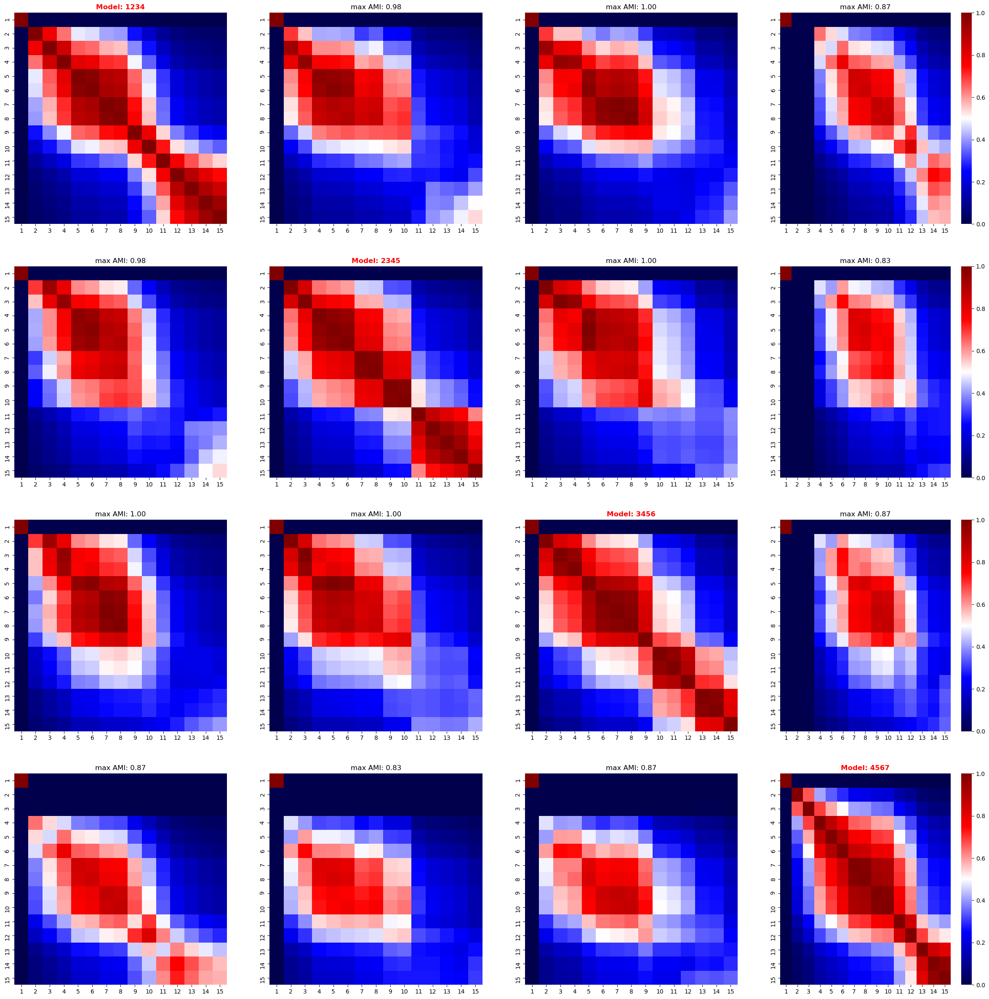

100%|██████████| 100/100 [01:06<00:00,  1.50it/s]

Final loss: 0.934828239386199


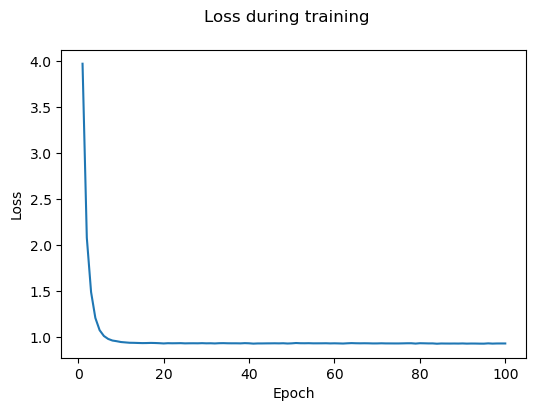

100%|██████████| 100/100 [01:06<00:00,  1.51it/s]

Final loss: 0.93711392605891


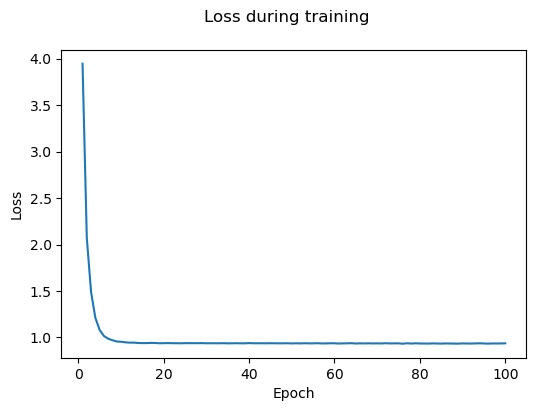

100%|██████████| 100/100 [01:06<00:00,  1.50it/s]

Final loss: 0.9408351261107648


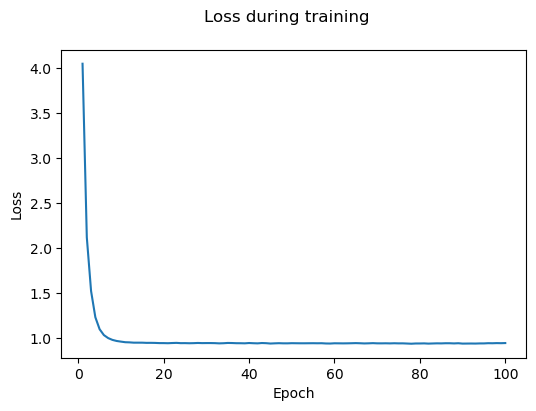

100%|██████████| 100/100 [01:06<00:00,  1.51it/s]


Final loss: 0.9370888227322063


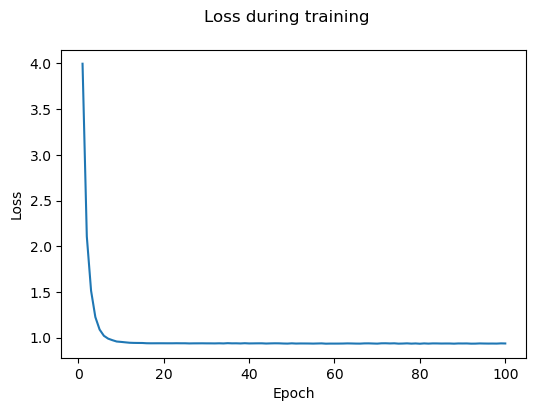

100%|██████████| 4/4 [00:02<00:00,  1.41it/s]


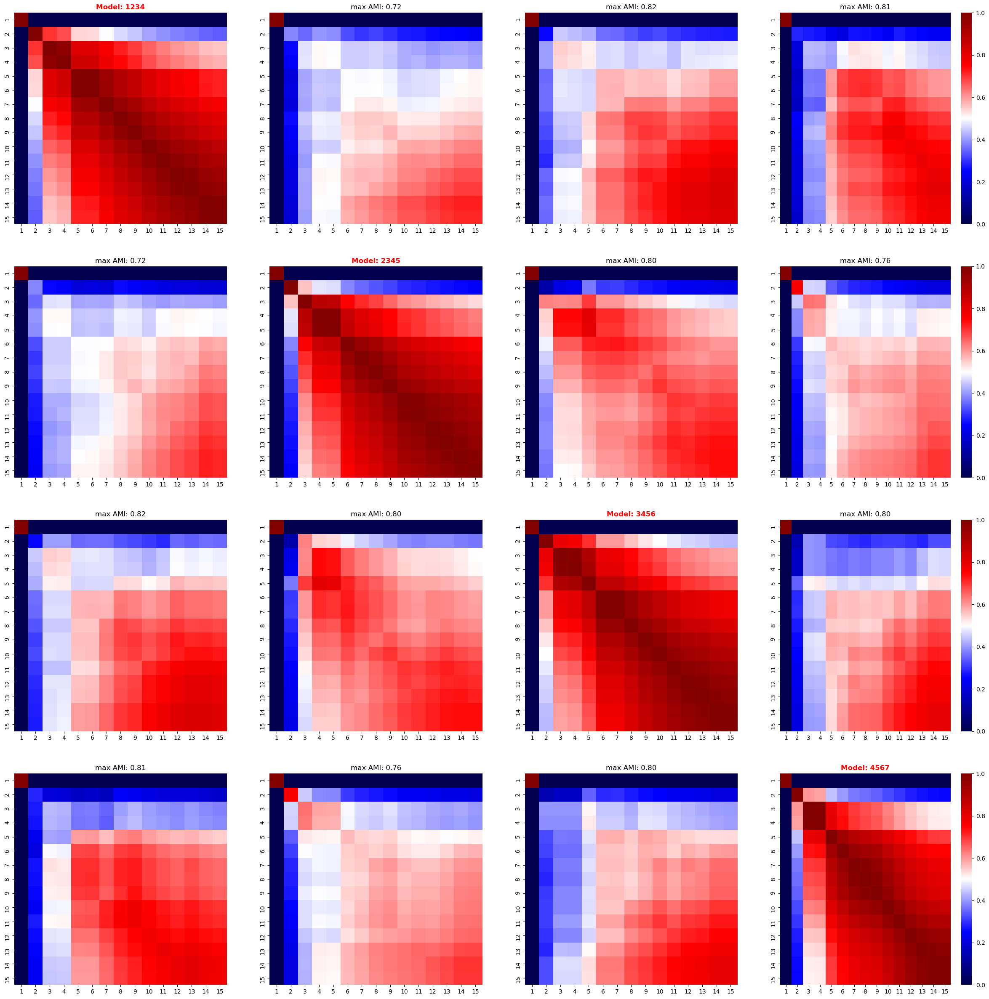

100%|██████████| 4/4 [00:02<00:00,  1.48it/s]


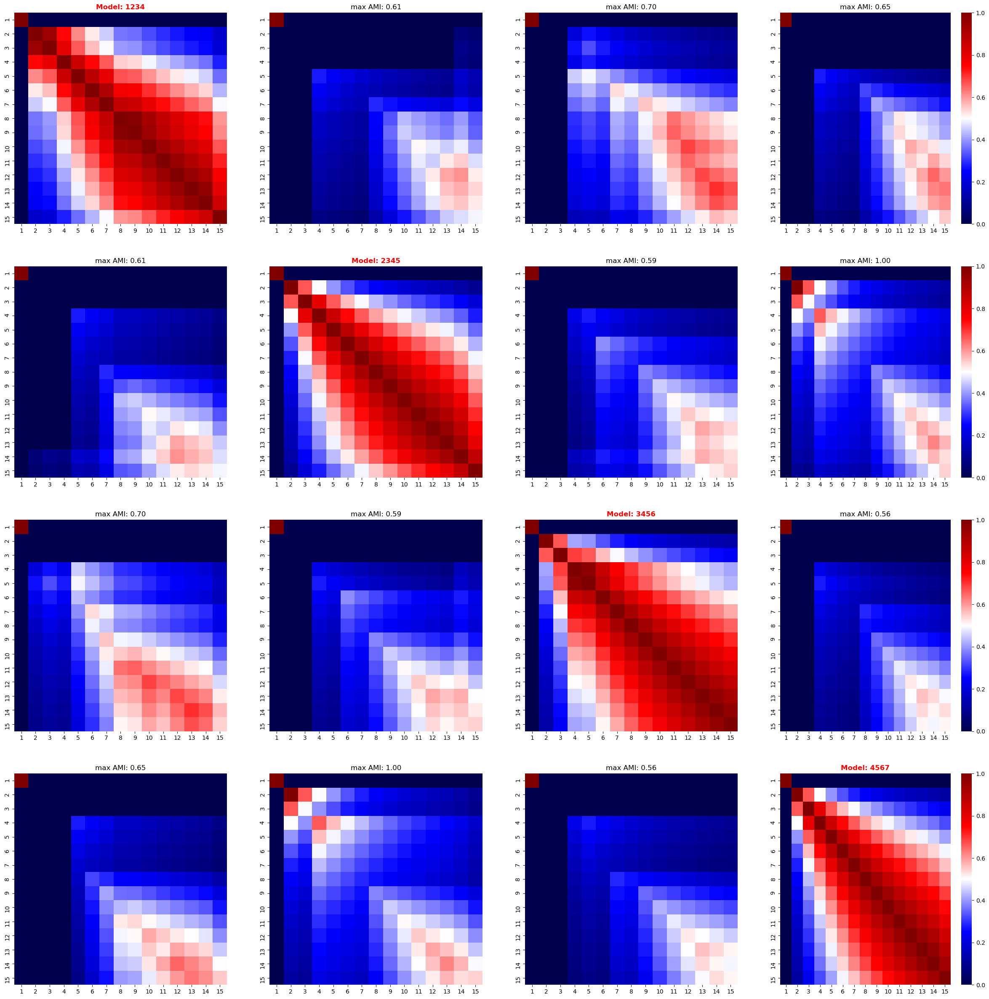

100%|██████████| 100/100 [01:04<00:00,  1.54it/s]

Final loss: 1.0351149029419071


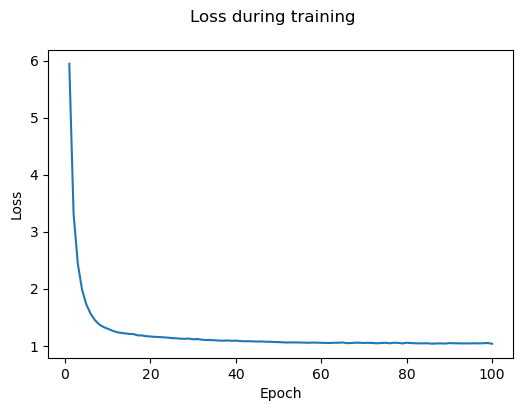

100%|██████████| 100/100 [01:04<00:00,  1.56it/s]

Final loss: 1.0215702525904922


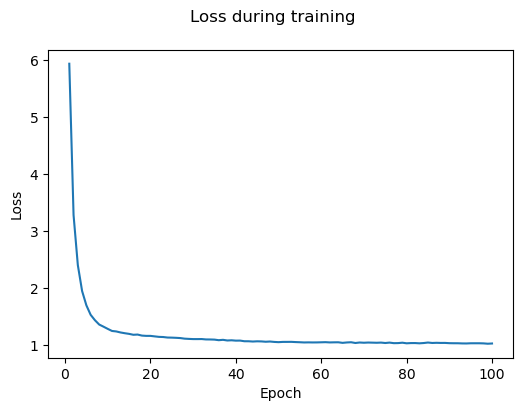

100%|██████████| 100/100 [01:04<00:00,  1.54it/s]

Final loss: 1.067058530010161


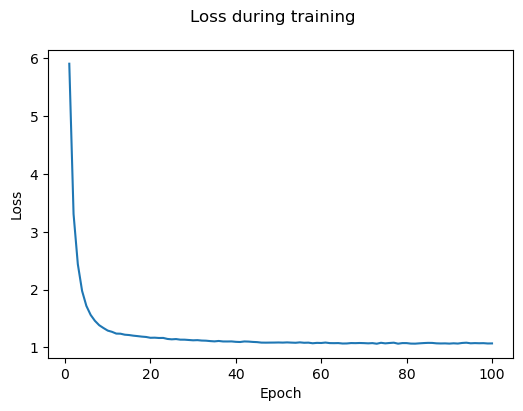

100%|██████████| 100/100 [01:04<00:00,  1.54it/s]

Final loss: 1.0306089686565711


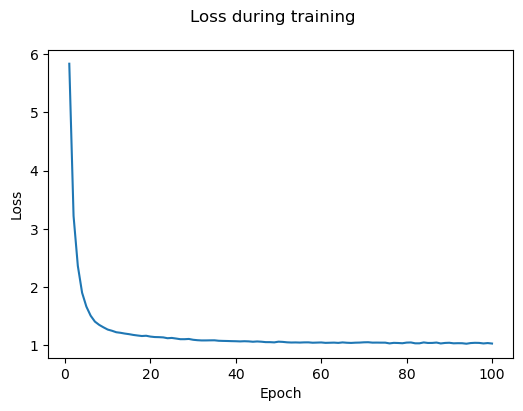

100%|██████████| 4/4 [00:03<00:00,  1.17it/s]


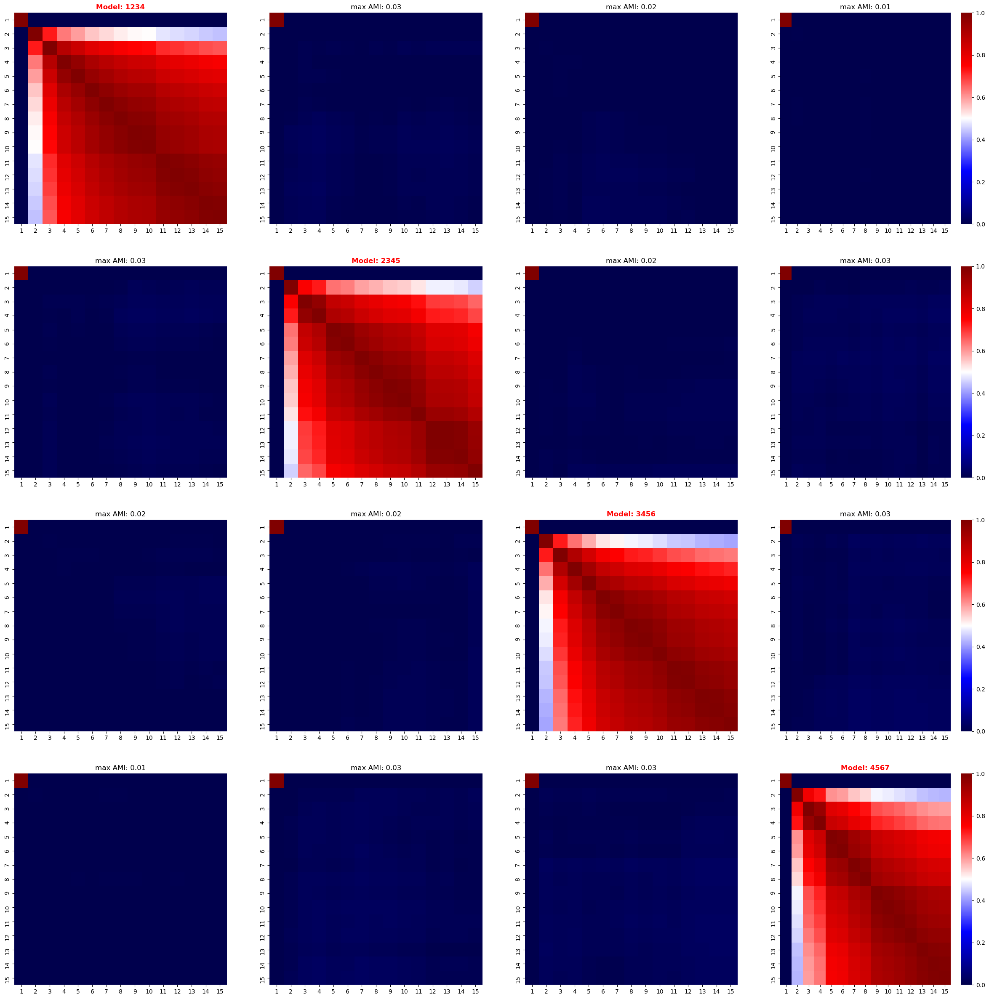

100%|██████████| 4/4 [00:03<00:00,  1.15it/s]


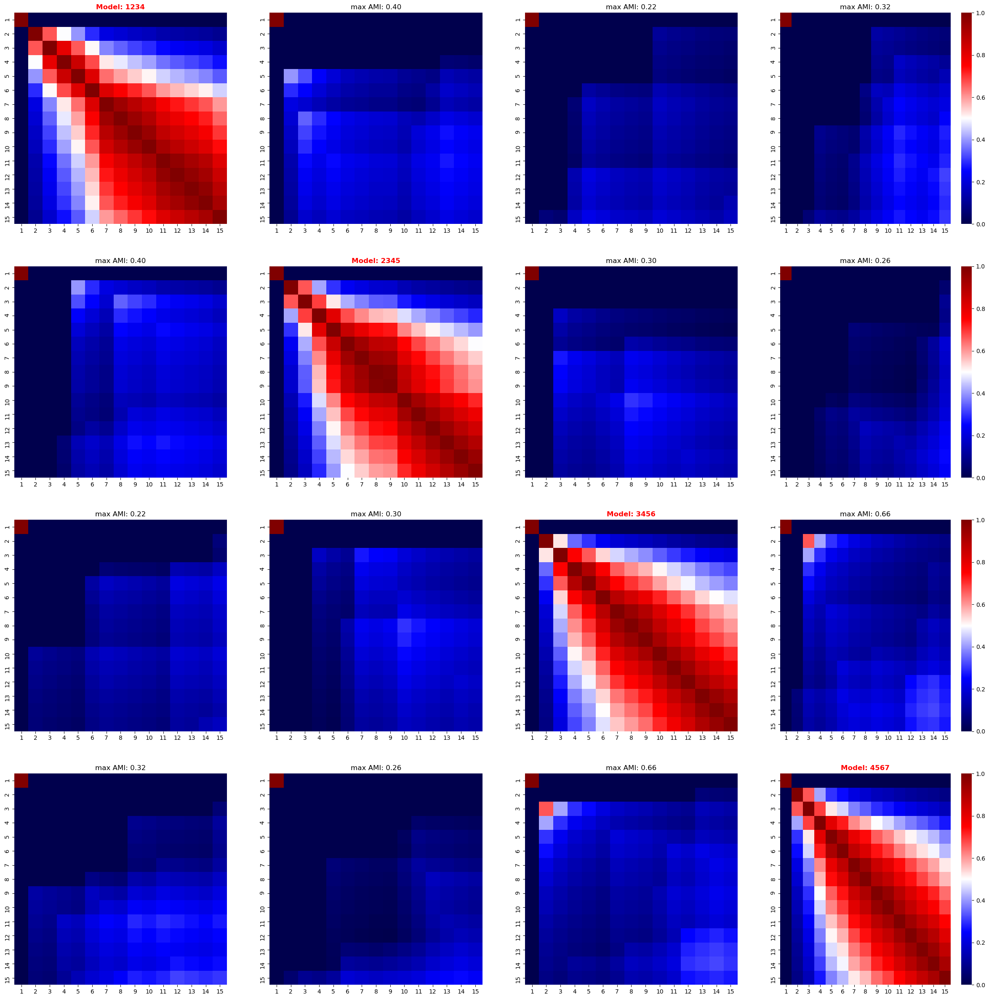

<IPython.core.display.Javascript object>

In [10]:
for latent_dim in latent_dims:
    latents_dict_n2v = get_n2v_latents_for_seed(
        graph_data,
        seeds,
        latent_dim=latent_dim,
        walk_length=50,
        context_size=5,
        walks_per_node=20,
        batch_size=4,
        num_workers=4,
        lr=0.01,
        n_epochs=100,
        plot_loss=True,
    )
    stability_amis_n2v = stability_cocluster_screen(
        latents_dict_n2v, linkage="average", affinity="cosine"
    )
    plot_amis_matrices(seeds, stability_amis_n2v)
    stability_amis_n2v = stability_cocluster_screen(
        latents_dict_n2v, linkage="average", affinity="euclidean"
    )
    plot_amis_matrices(seeds, stability_amis_n2v)

---

#### 3.1.2. GAE

After having assess the stability of the Node2Vec embeddings we will now run a similar analyses using a GAE model. Hereby, we will first vary the type of input features that we provide alongside with the adjacency matrix, before we also assess setups with different training objectives and different model configurations.

##### Topology-GAE

The first model does not uses any meaningful input features but is simply the identity matrix. Thus, the network should mostly focus on the graph structure. We will train the model on the task of reconstructing the adjacency matrix. Note that we do not split the data but simply aim to find a low-dimensional embedding that encodes the adjacency matrix.

100%|██████████| 1000/1000 [00:13<00:00, 76.79it/s]


------------------------------------------------------------
TRAIN loss: 0.7755157351493835
VAL loss: 0.7407187223434448
TEST loss: 0.7810317873954773


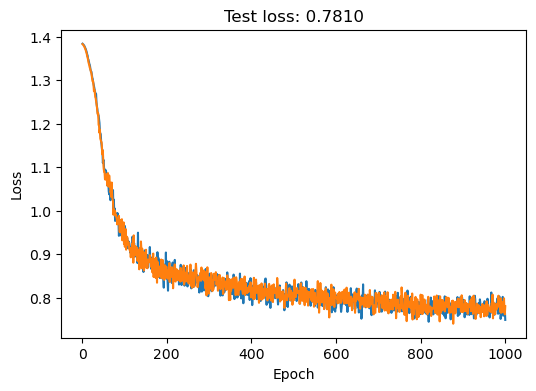

100%|██████████| 1000/1000 [00:12<00:00, 78.65it/s]

------------------------------------------------------------
TRAIN loss: 0.7857357263565063
VAL loss: 0.7348934412002563
TEST loss: 0.7847688794136047


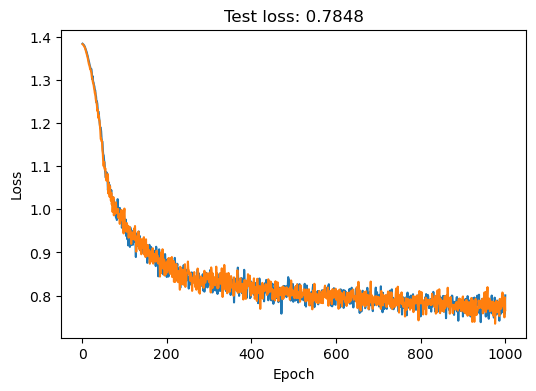

100%|██████████| 1000/1000 [00:12<00:00, 78.80it/s]


------------------------------------------------------------
TRAIN loss: 0.7865700125694275
VAL loss: 0.7454559803009033
TEST loss: 0.7948753237724304


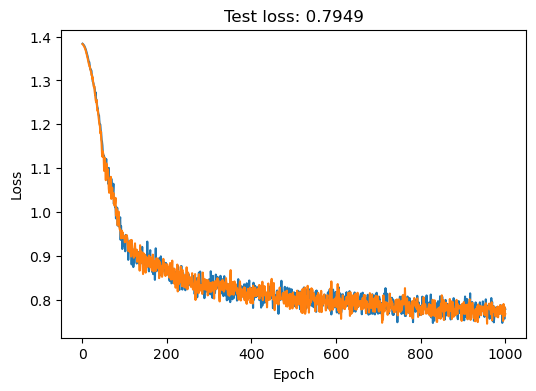

100%|██████████| 1000/1000 [00:12<00:00, 79.98it/s]


------------------------------------------------------------
TRAIN loss: 0.8075807690620422
VAL loss: 0.7423698306083679
TEST loss: 0.7842377424240112


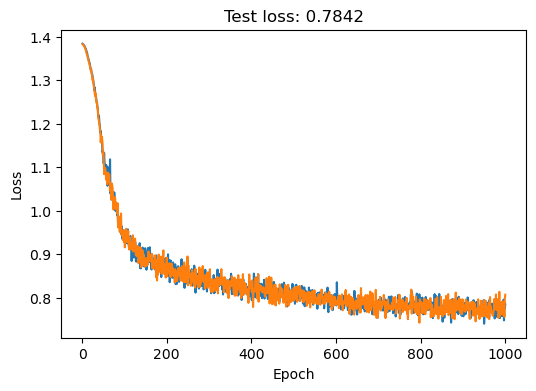

100%|██████████| 4/4 [00:02<00:00,  1.60it/s]


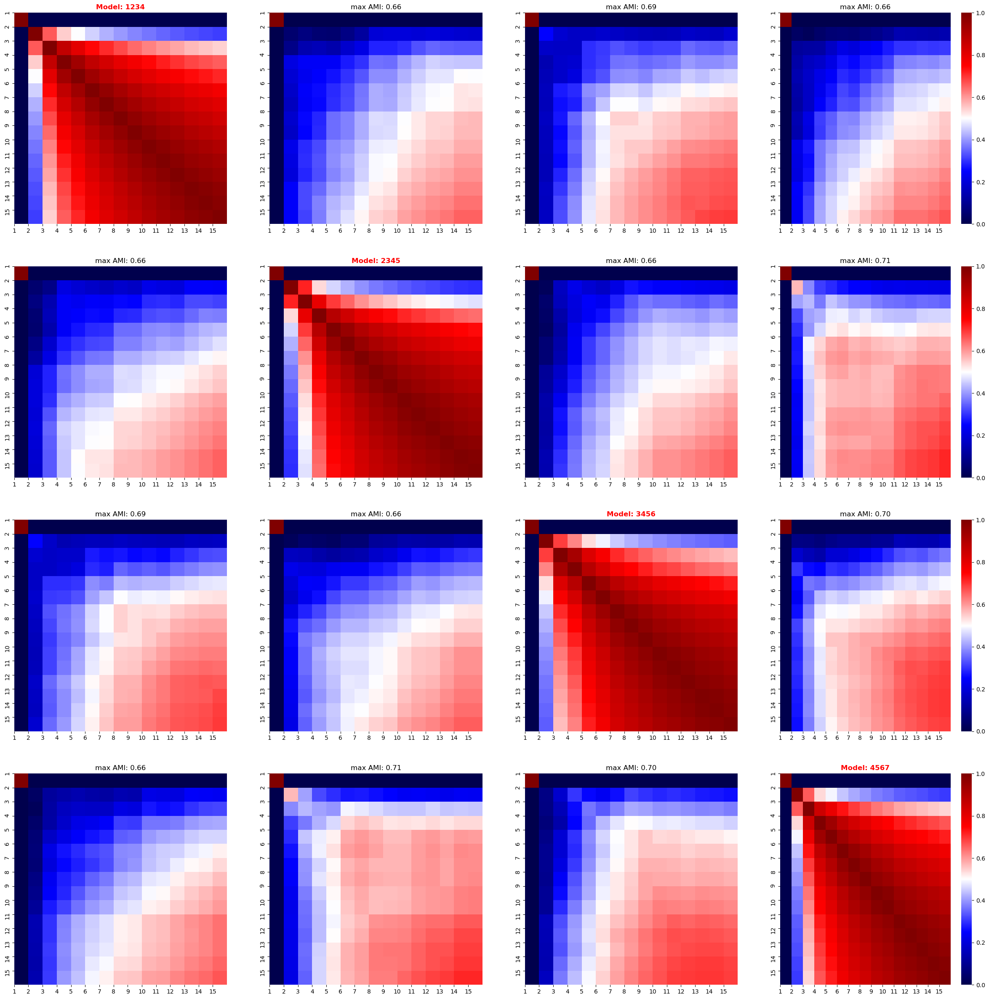

100%|██████████| 4/4 [00:02<00:00,  1.49it/s]


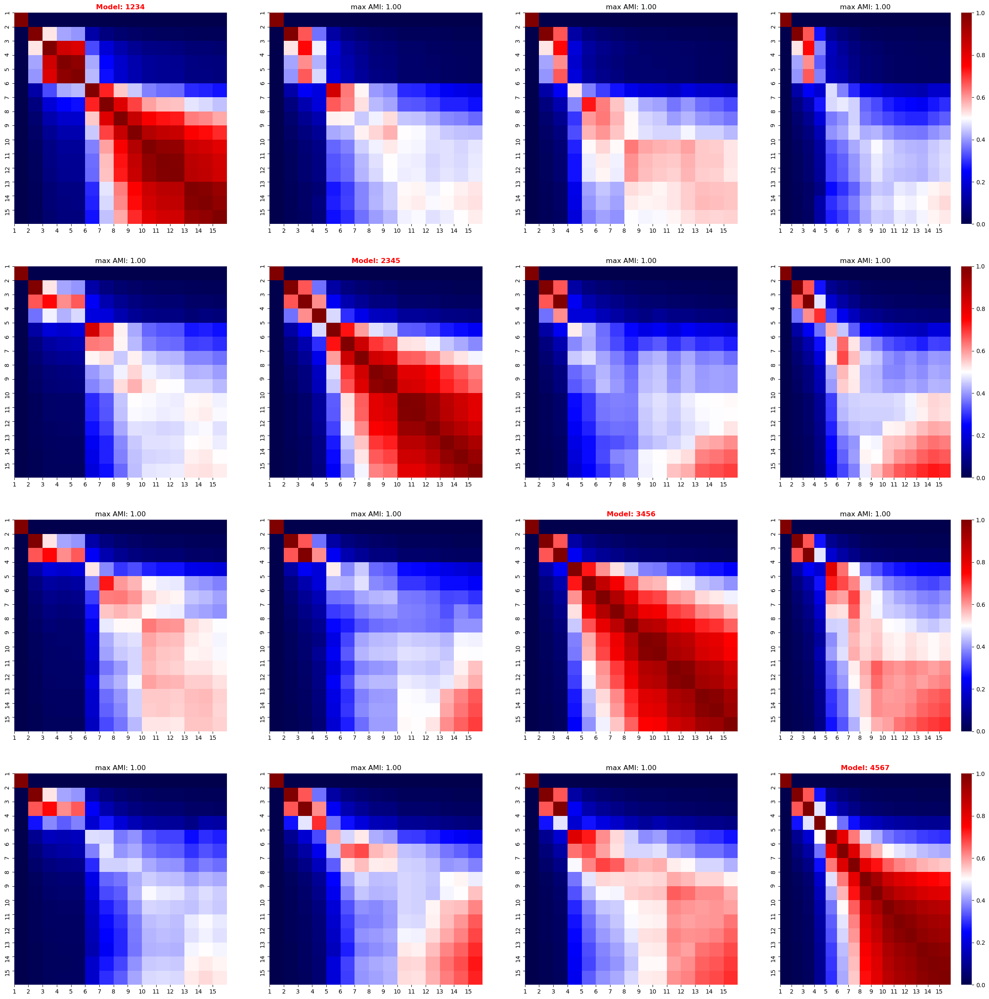

100%|██████████| 1000/1000 [00:12<00:00, 78.30it/s]


------------------------------------------------------------
TRAIN loss: 0.7809337973594666
VAL loss: 0.7278434038162231
TEST loss: 0.7503369450569153


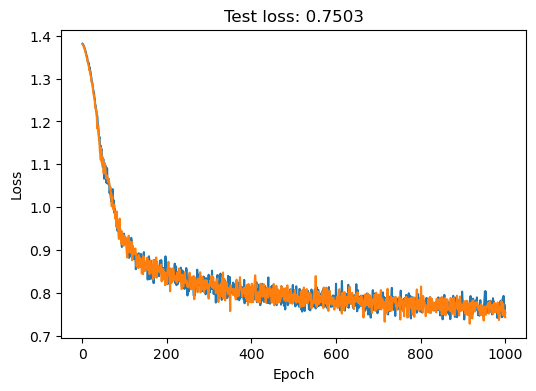

100%|██████████| 1000/1000 [00:13<00:00, 76.61it/s]


------------------------------------------------------------
TRAIN loss: 0.7395898699760437
VAL loss: 0.7088140845298767
TEST loss: 0.7645038962364197


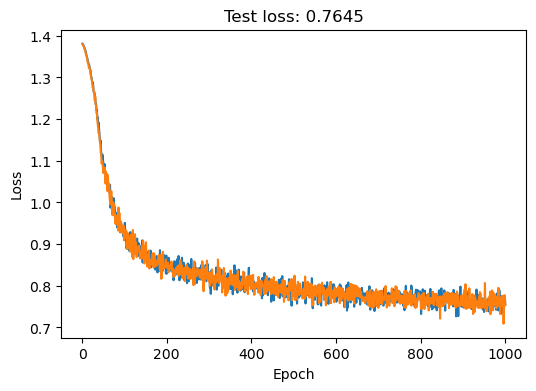

100%|██████████| 1000/1000 [00:13<00:00, 73.82it/s]


------------------------------------------------------------
TRAIN loss: 0.7870827913284302
VAL loss: 0.7344583868980408
TEST loss: 0.7703169584274292


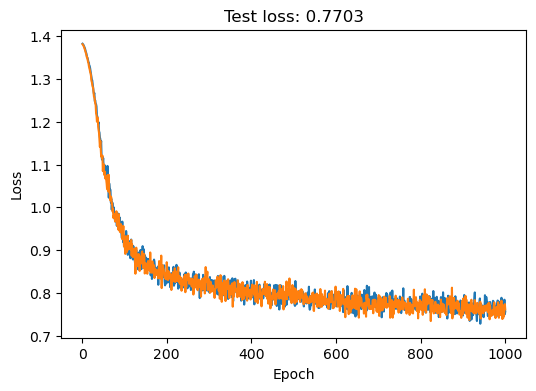

100%|██████████| 1000/1000 [00:13<00:00, 74.41it/s]


------------------------------------------------------------
TRAIN loss: 0.767551064491272
VAL loss: 0.727624237537384
TEST loss: 0.7721116542816162


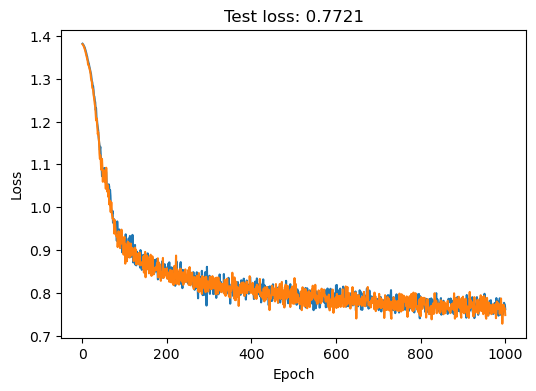

100%|██████████| 4/4 [00:02<00:00,  1.38it/s]


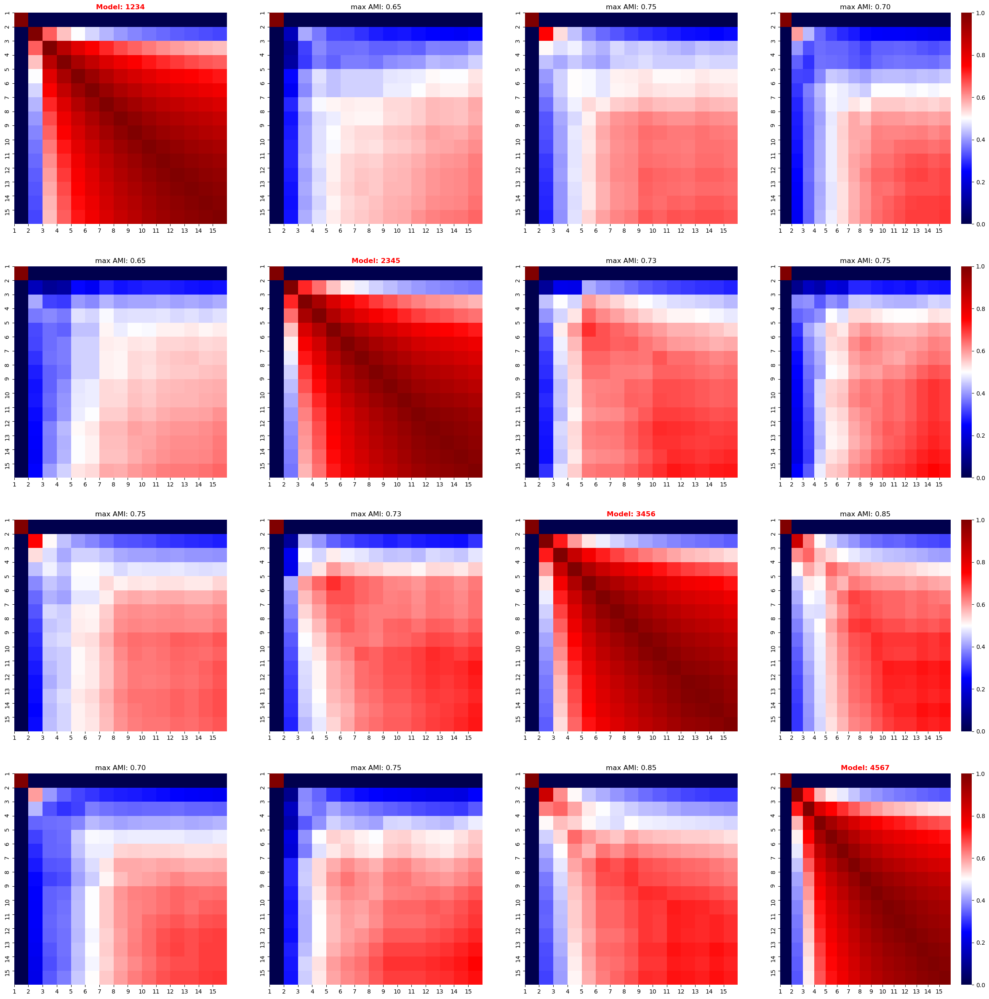

100%|██████████| 4/4 [00:02<00:00,  1.36it/s]


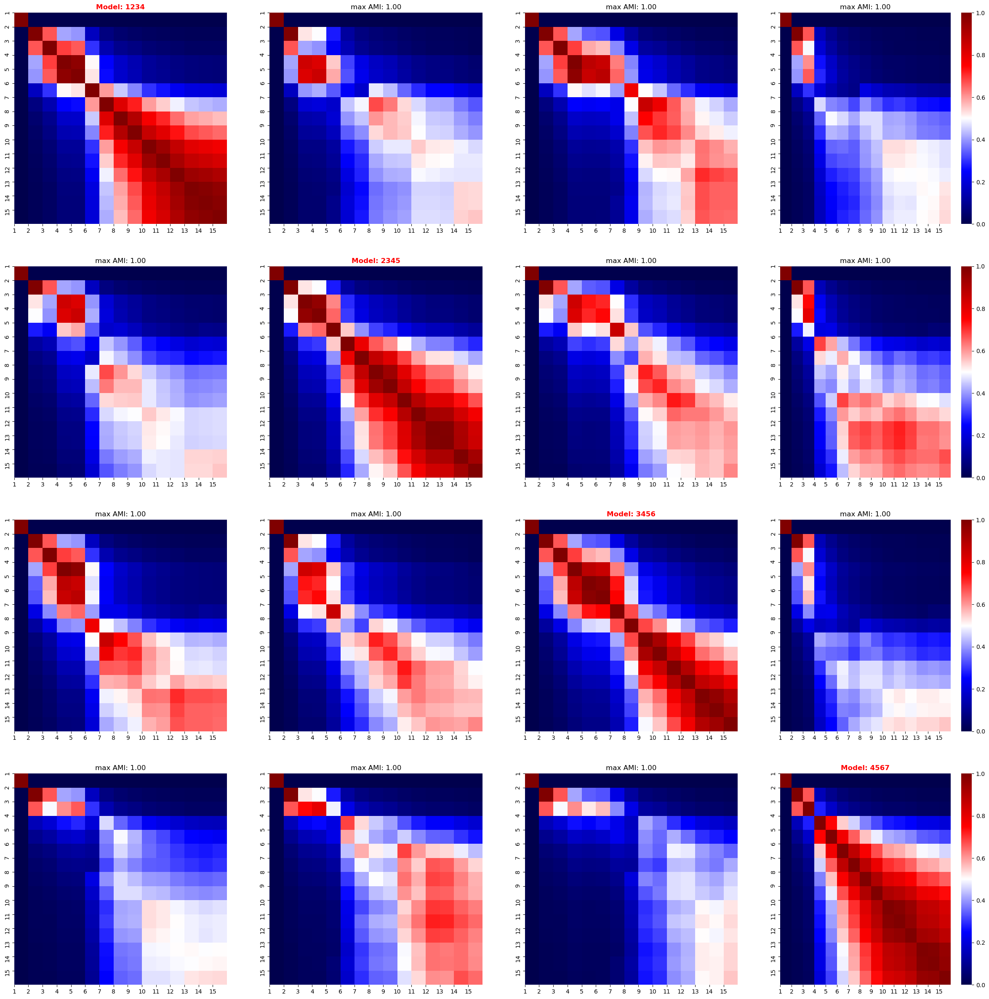

100%|██████████| 1000/1000 [00:13<00:00, 74.85it/s]


------------------------------------------------------------
TRAIN loss: 0.7542165517807007
VAL loss: 0.7176914811134338
TEST loss: 0.7420706748962402


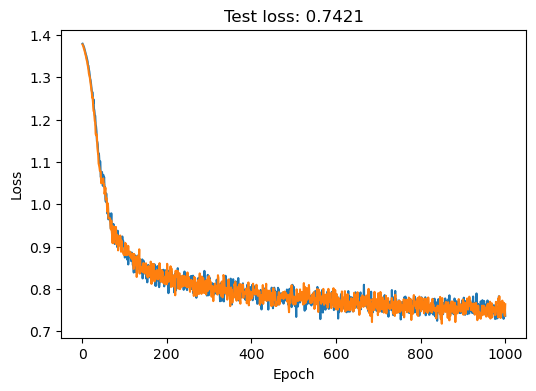

100%|██████████| 1000/1000 [00:13<00:00, 75.42it/s]


------------------------------------------------------------
TRAIN loss: 0.7601040601730347
VAL loss: 0.7206497192382812
TEST loss: 0.7544217705726624


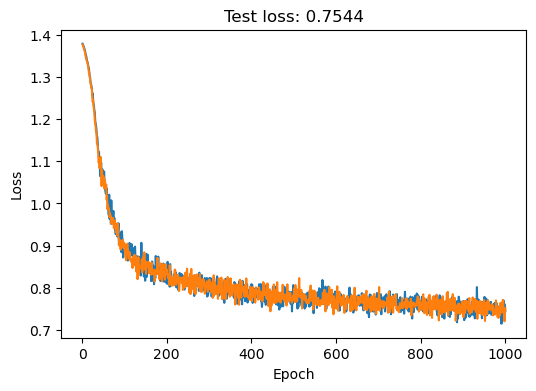

100%|██████████| 1000/1000 [00:12<00:00, 79.35it/s]


------------------------------------------------------------
TRAIN loss: 0.7483946681022644
VAL loss: 0.7143974900245667
TEST loss: 0.7746514678001404


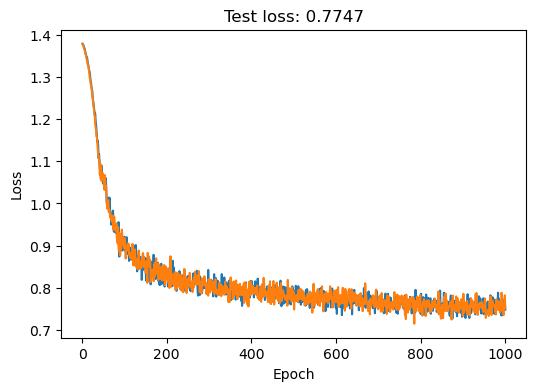

100%|██████████| 1000/1000 [00:12<00:00, 78.69it/s]


------------------------------------------------------------
TRAIN loss: 0.7653676271438599
VAL loss: 0.7219708561897278
TEST loss: 0.7501717209815979


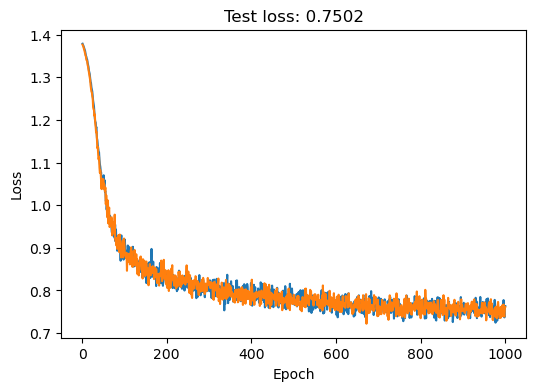

100%|██████████| 4/4 [00:03<00:00,  1.12it/s]


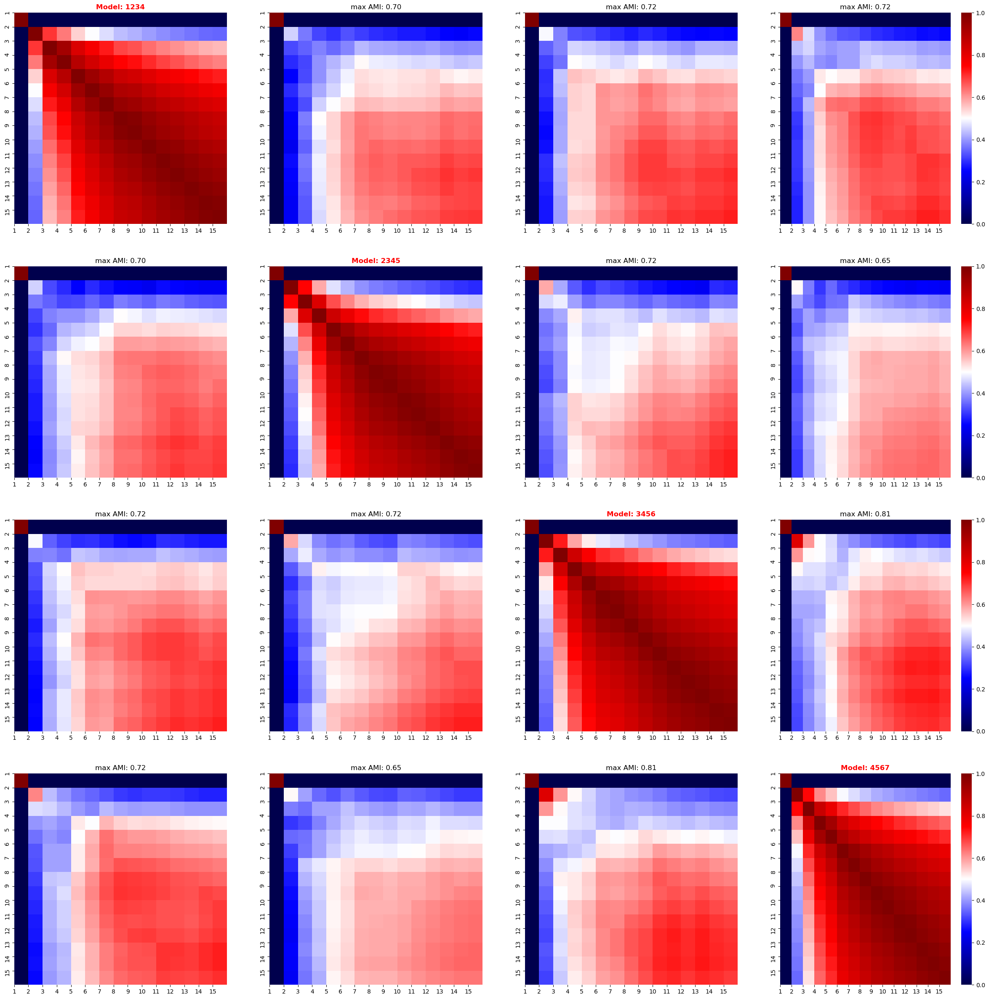

100%|██████████| 4/4 [00:03<00:00,  1.09it/s]


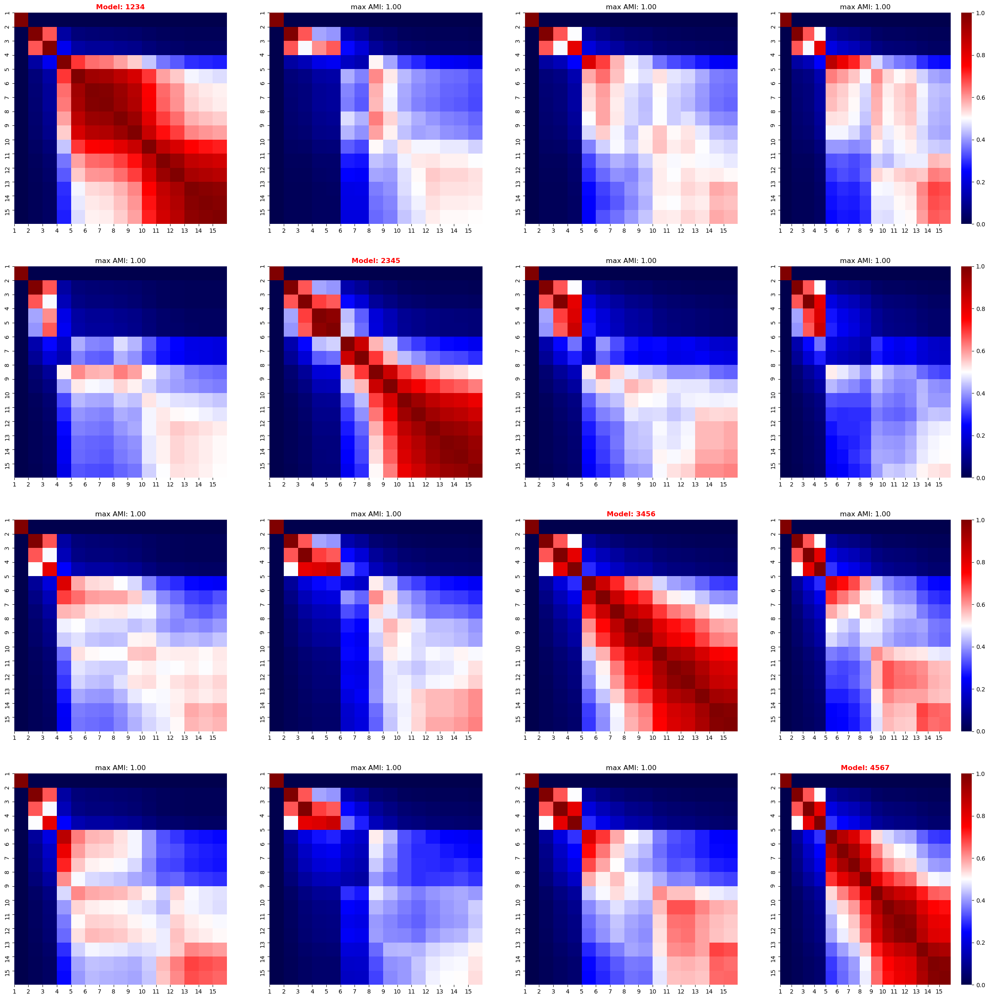

<IPython.core.display.Javascript object>

In [10]:
node_feature_key = "id"

for latent_dim in latent_dims:
    latents_dict_topogae = get_gae_latents_for_seed(
        graph_data=graph_data,
        seeds=seeds,
        node_feature_key=node_feature_key,
        input_dim=244,
        latent_dim=latent_dim,
        hidden_dim=128,
        n_epochs=1000,
        plot_loss=True,
        lr=1e-3,
        early_stopping=1000,
    )
    stability_amis_topogae = stability_cocluster_screen(
        latents_dict_topogae, linkage="average", affinity="cosine"
    )
    plot_amis_matrices(seeds, stability_amis_topogae)
    stability_amis_topogae = stability_cocluster_screen(
        latents_dict_topogae, linkage="average", affinity="euclidean"
    )
    plot_amis_matrices(seeds, stability_amis_topogae)

We see that for the GAE trained on solely minimizing the loss of the reconstruction of the adjacency matrix shows a significant dependence of the random initialization. Interestingly, we obtain more stable embeddings with increasing dimensions.

---

##### GEX GAE

Finally, we train an autoencoder using the min-max-scaled gene expression data as inputs.

100%|██████████| 1000/1000 [00:12<00:00, 78.74it/s]


------------------------------------------------------------
TRAIN loss: 1.0680820941925049
VAL loss: 1.010162591934204
TEST loss: 1.0474239587783813


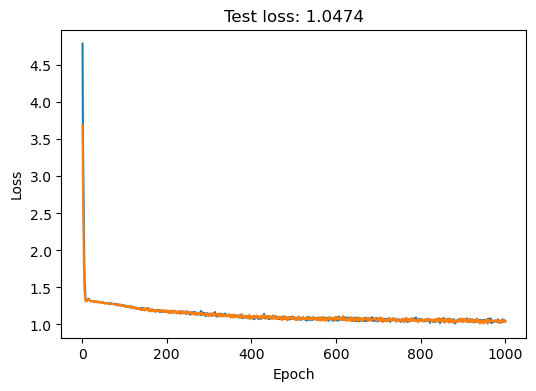

100%|██████████| 1000/1000 [00:12<00:00, 78.21it/s]


------------------------------------------------------------
TRAIN loss: 1.0358061790466309
VAL loss: 1.0026251077651978
TEST loss: 1.0603444576263428


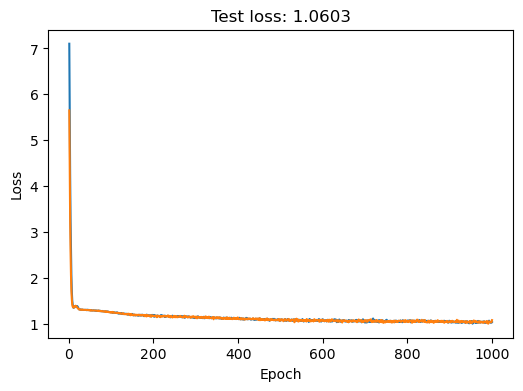

100%|██████████| 1000/1000 [00:13<00:00, 76.67it/s]


------------------------------------------------------------
TRAIN loss: 1.0763355493545532
VAL loss: 1.0150196552276611
TEST loss: 1.0471093654632568


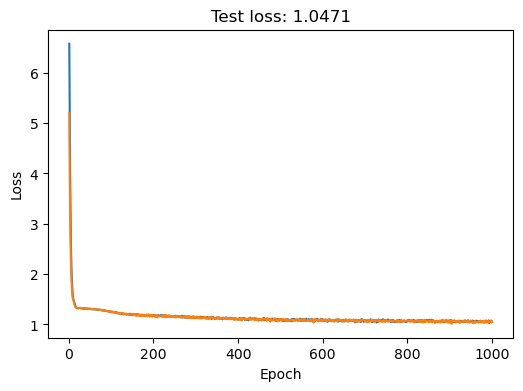

100%|██████████| 1000/1000 [00:12<00:00, 78.96it/s]


------------------------------------------------------------
TRAIN loss: 1.0551122426986694
VAL loss: 1.0179903507232666
TEST loss: 1.0656062364578247


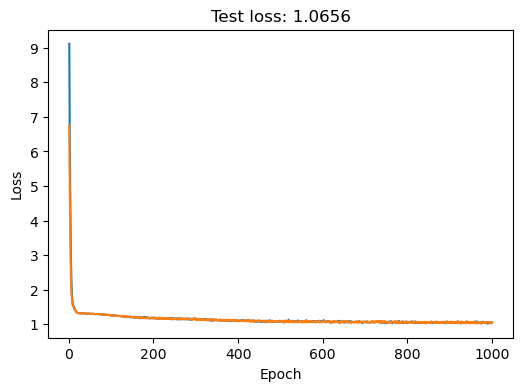

100%|██████████| 4/4 [00:02<00:00,  1.59it/s]


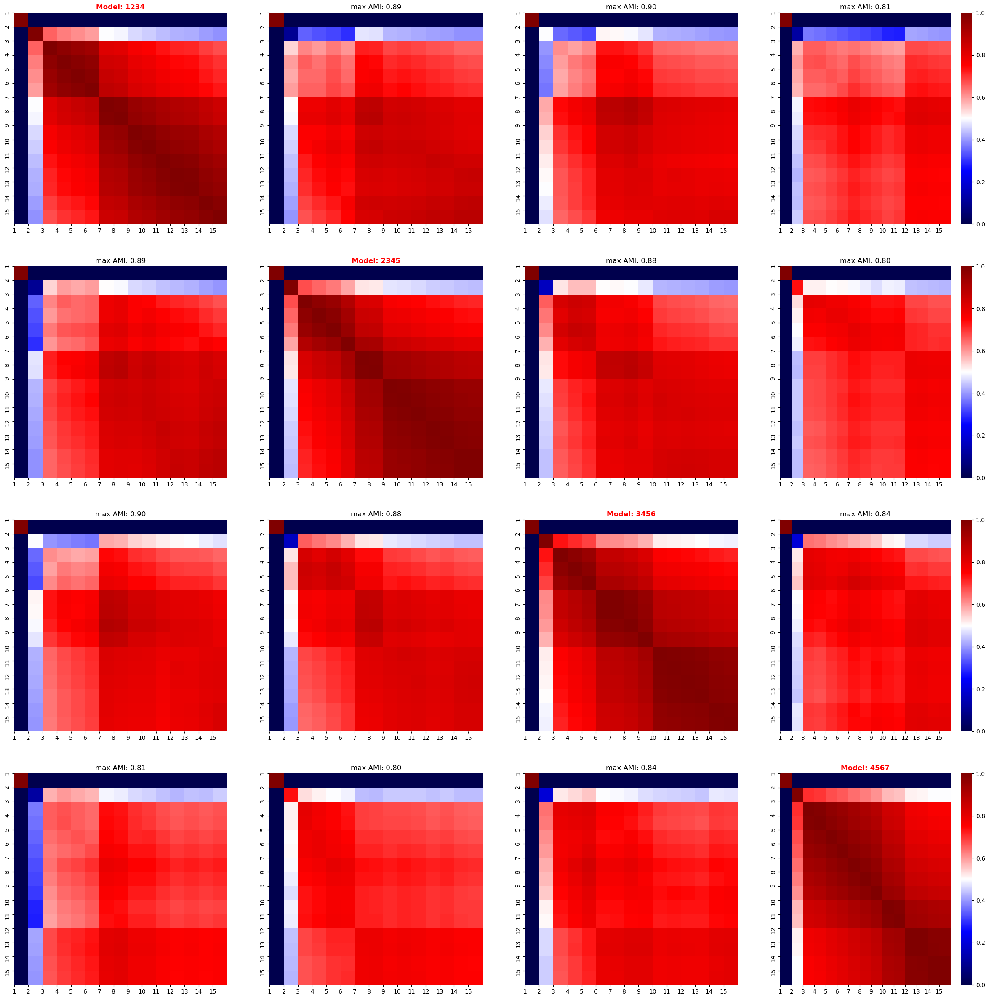

100%|██████████| 4/4 [00:02<00:00,  1.62it/s]


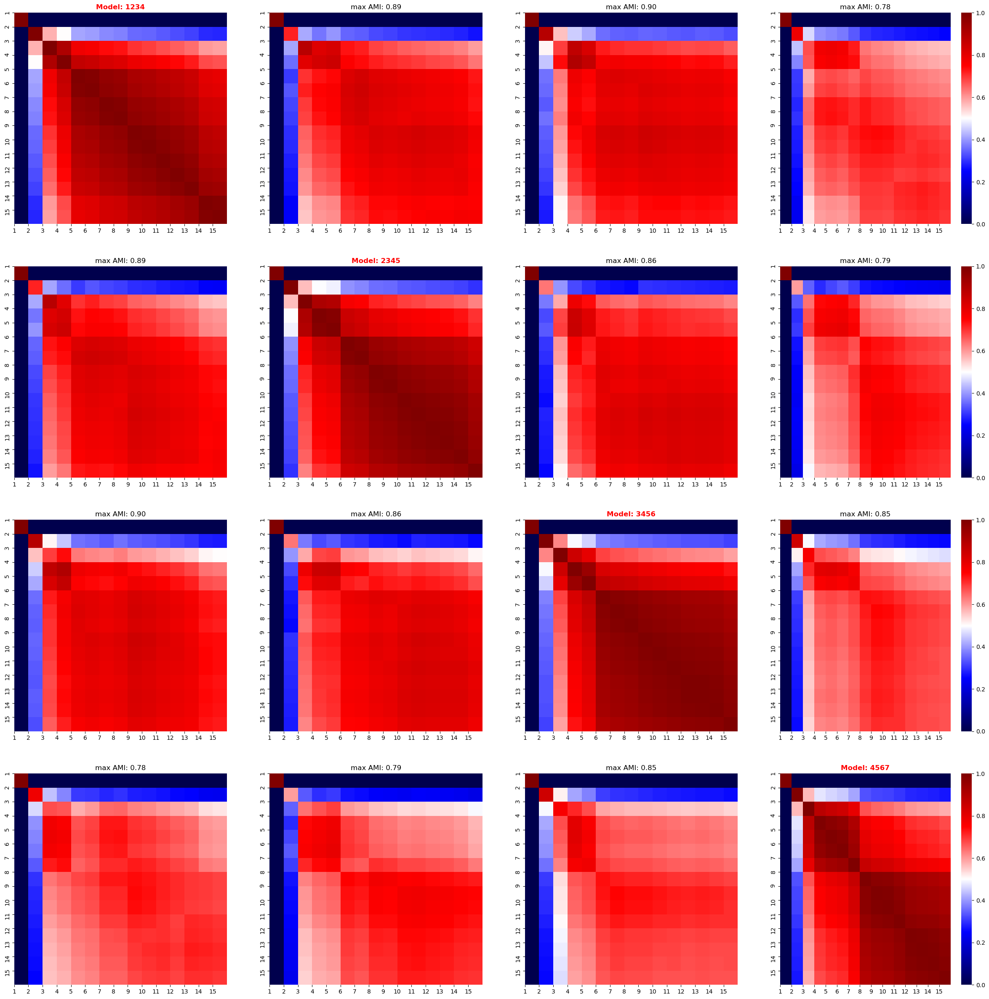

100%|██████████| 1000/1000 [00:13<00:00, 76.13it/s]


------------------------------------------------------------
TRAIN loss: 1.0379364490509033
VAL loss: 0.9959845542907715
TEST loss: 1.0219382047653198


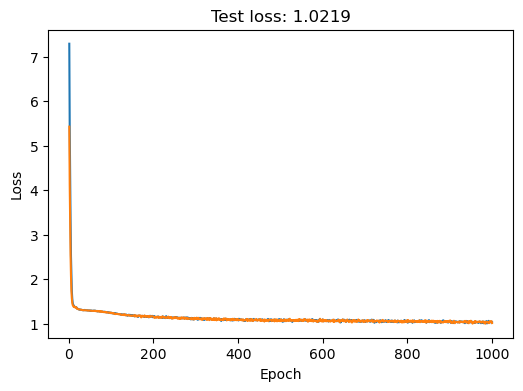

100%|██████████| 1000/1000 [00:13<00:00, 76.32it/s]


------------------------------------------------------------
TRAIN loss: 1.0543748140335083
VAL loss: 1.0181567668914795
TEST loss: 1.0387078523635864


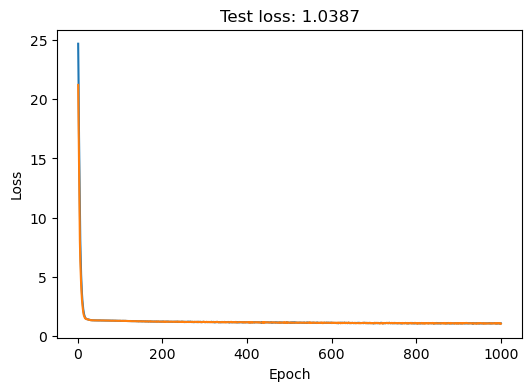

100%|██████████| 1000/1000 [00:13<00:00, 76.82it/s]


------------------------------------------------------------
TRAIN loss: 1.027674674987793
VAL loss: 0.9989234209060669
TEST loss: 1.0364432334899902


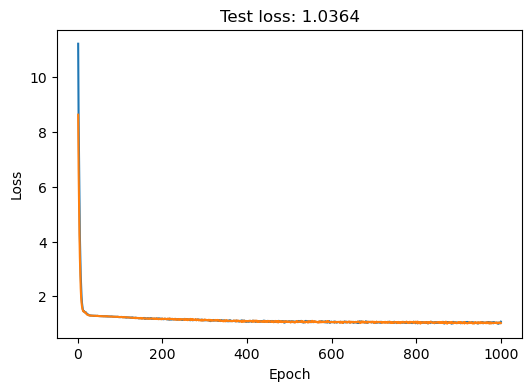

100%|██████████| 1000/1000 [00:12<00:00, 81.05it/s]

------------------------------------------------------------
TRAIN loss: 1.0529056787490845
VAL loss: 1.00070321559906
TEST loss: 1.0240352153778076


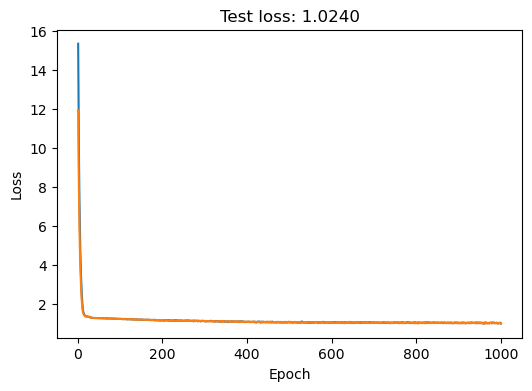

100%|██████████| 4/4 [00:02<00:00,  1.37it/s]


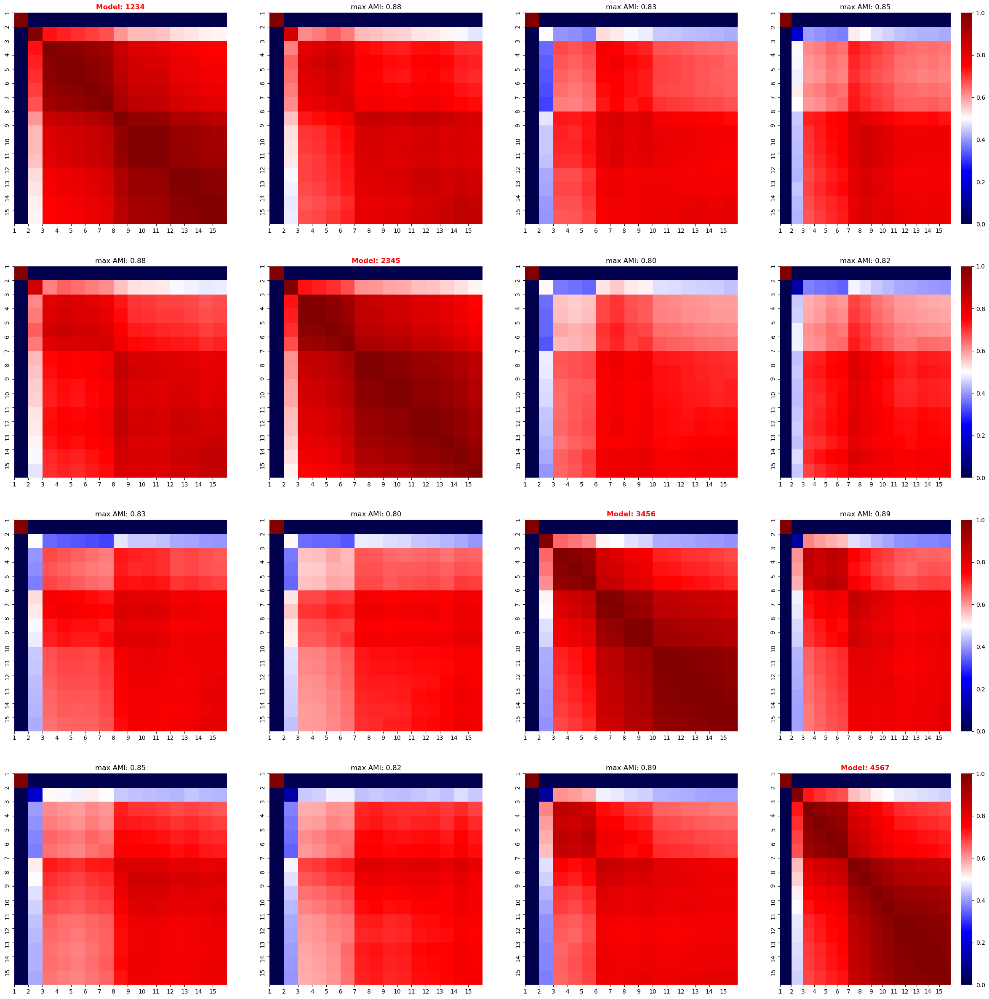

100%|██████████| 4/4 [00:02<00:00,  1.35it/s]


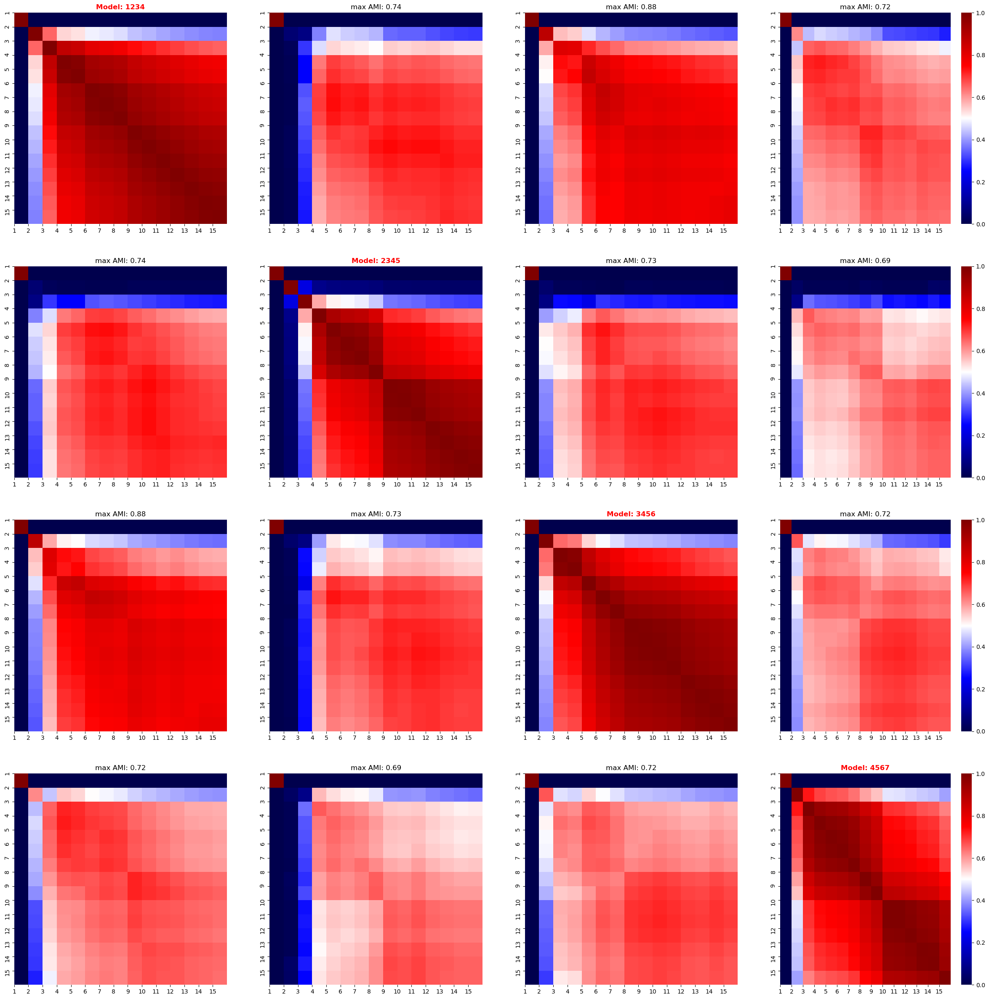

100%|██████████| 1000/1000 [00:13<00:00, 76.03it/s]


------------------------------------------------------------
TRAIN loss: 1.0273278951644897
VAL loss: 1.007932424545288
TEST loss: 1.038947343826294


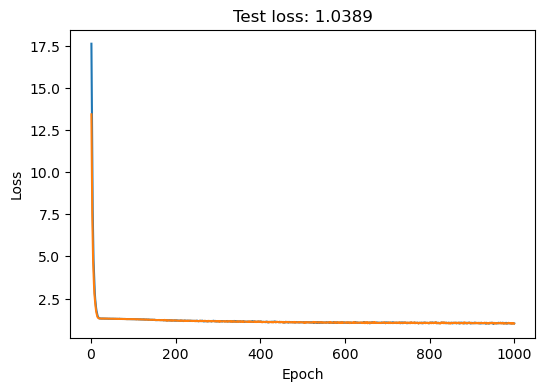

100%|██████████| 1000/1000 [00:12<00:00, 78.53it/s]

------------------------------------------------------------
TRAIN loss: 1.0576374530792236
VAL loss: 1.010439395904541
TEST loss: 1.0340802669525146


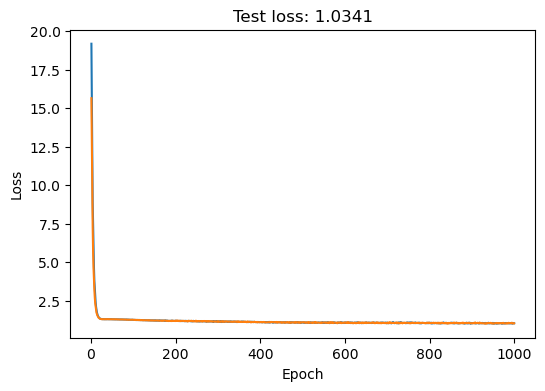

100%|██████████| 1000/1000 [00:13<00:00, 74.90it/s]


------------------------------------------------------------
TRAIN loss: 1.007596492767334
VAL loss: 0.9893893599510193
TEST loss: 1.0150736570358276


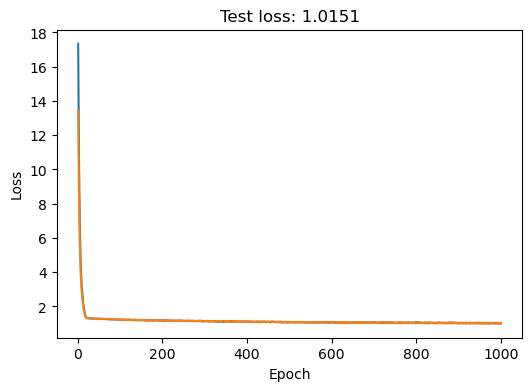

100%|██████████| 1000/1000 [00:12<00:00, 77.15it/s]


------------------------------------------------------------
TRAIN loss: 1.0575268268585205
VAL loss: 1.0074551105499268
TEST loss: 1.0584197044372559


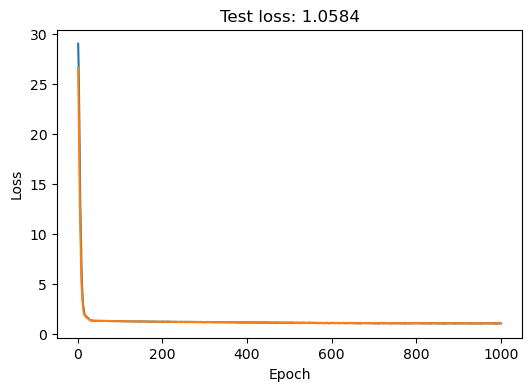

100%|██████████| 4/4 [00:03<00:00,  1.05it/s]


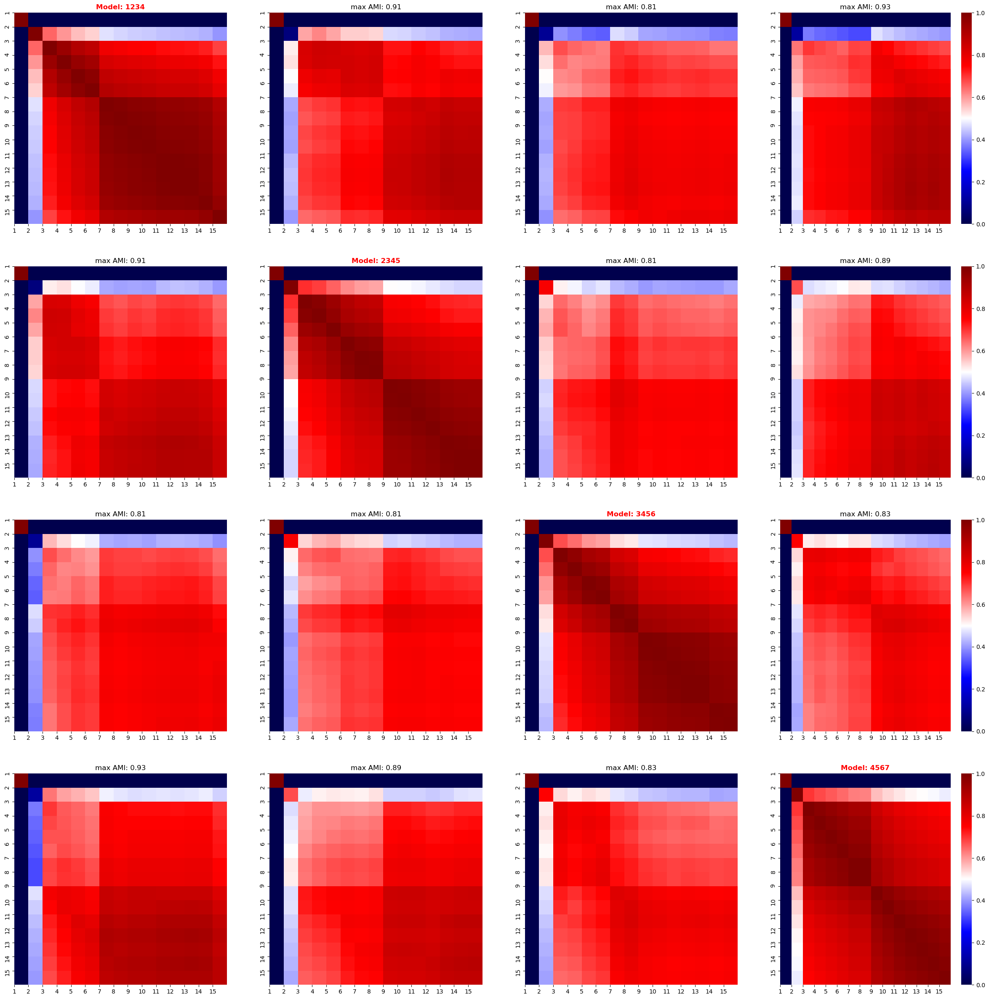

100%|██████████| 4/4 [00:03<00:00,  1.00it/s]


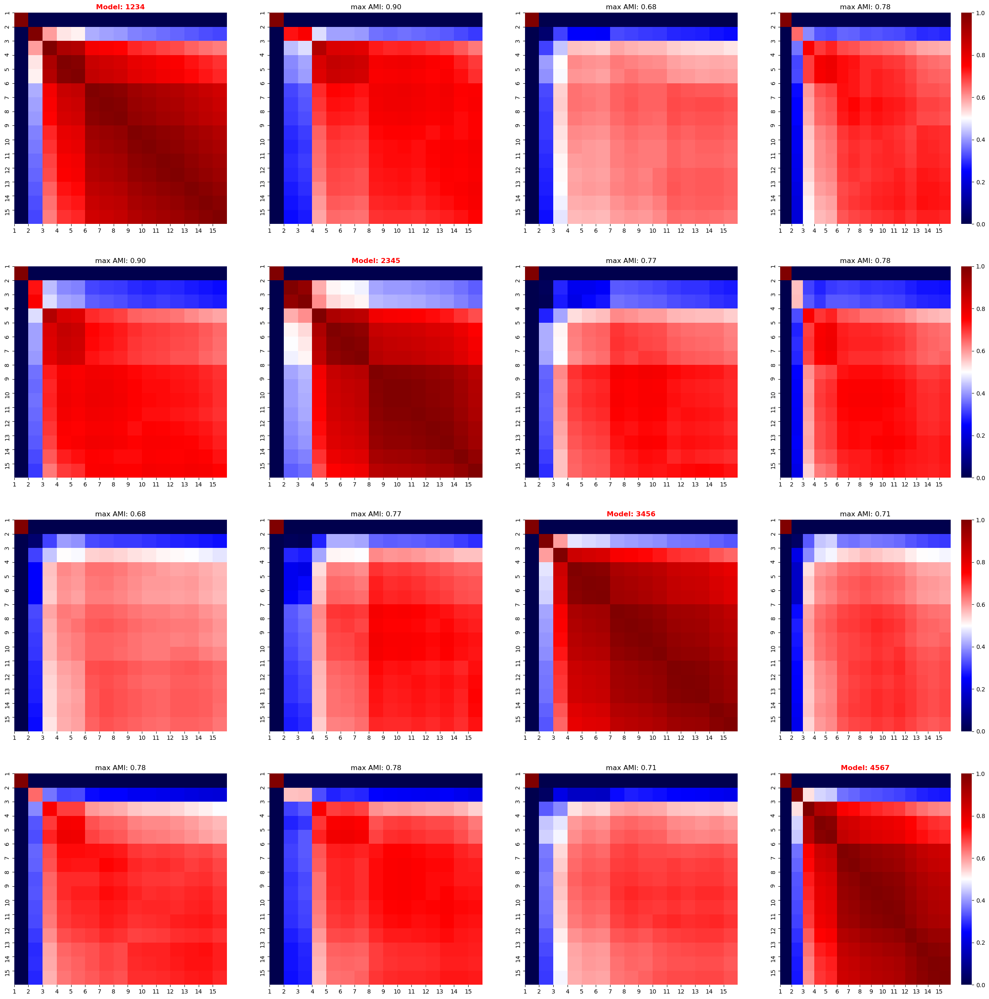

<IPython.core.display.Javascript object>

In [11]:
node_feature_key = "sc_gex"
for latent_dim in latent_dims:
    latents_dict_hallgexgae = get_gae_latents_for_seed(
        graph_data=graph_data,
        seeds=seeds,
        node_feature_key=node_feature_key,
        input_dim=1126,
        latent_dim=latent_dim,
        hidden_dim=128,
        n_epochs=1000,
        lr=0.0001,
        plot_loss=True,
        early_stopping=1000,
    )
    stability_amis_hallgexgae = stability_cocluster_screen(
        latents_dict_hallgexgae, linkage="average", affinity="cosine"
    )
    plot_amis_matrices(seeds, stability_amis_hallgexgae)
    stability_amis_hallgexgae = stability_cocluster_screen(
        latents_dict_hallgexgae, linkage="average", affinity="euclidean"
    )
    plot_amis_matrices(seeds, stability_amis_hallgexgae)

We obtain fairly stable results for different choices of the size of the latent space as well.

---

##### GEX GAE (link prediction)

We will now reassess the previous model's stability when training it on a link-prediction task.
That is the data will also be split differently for each term.

 21%|██        | 207/1000 [00:03<00:12, 64.83it/s]


Training stopped after 208 epochs
Best model found at epoch 156
------------------------------------------------------------
TRAIN loss: 1.1795071363449097
VAL loss: 1.1741585731506348
TEST loss: 1.2217369079589844
TEST AUC: 0.7159177456207161 	 AP: 0.7147343665378013


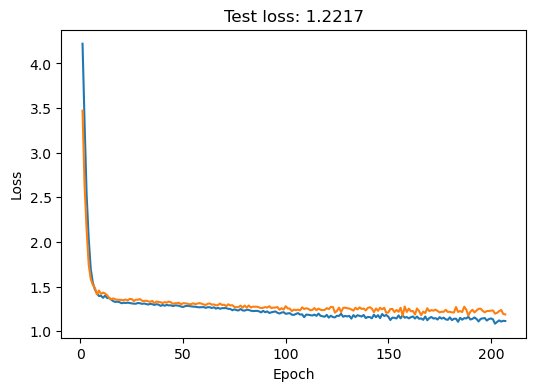

 21%|██        | 207/1000 [00:03<00:11, 68.11it/s]

Training stopped after 208 epochs
Best model found at epoch 156
------------------------------------------------------------
TRAIN loss: 1.1559327840805054
VAL loss: 1.1975101232528687
TEST loss: 1.2329174280166626
TEST AUC: 0.723914699162224 	 AP: 0.7270031053099271


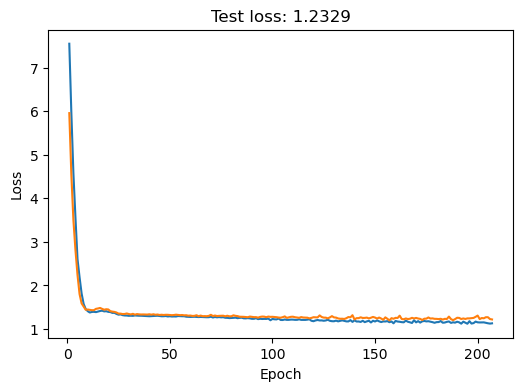

 30%|██▉       | 299/1000 [00:04<00:10, 64.62it/s]


Training stopped after 300 epochs
Best model found at epoch 248
------------------------------------------------------------
TRAIN loss: 1.119909644126892
VAL loss: 1.17383873462677
TEST loss: 1.2118123769760132
TEST AUC: 0.7291507996953541 	 AP: 0.7306060228238289


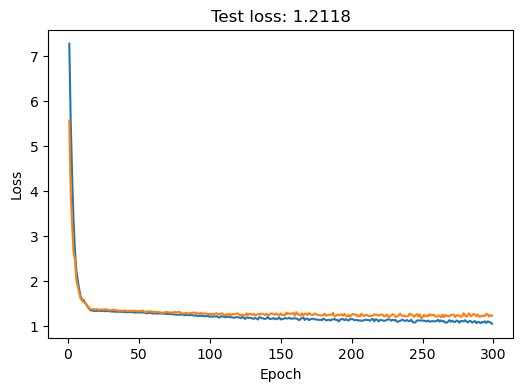

 24%|██▎       | 235/1000 [00:03<00:11, 64.07it/s]


Training stopped after 236 epochs
Best model found at epoch 184
------------------------------------------------------------
TRAIN loss: 1.1780678033828735
VAL loss: 1.1904038190841675
TEST loss: 1.2538185119628906
TEST AUC: 0.7321972581873571 	 AP: 0.7272312923660573


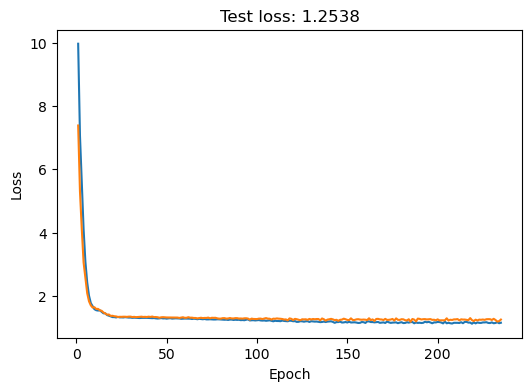

100%|██████████| 4/4 [00:02<00:00,  1.49it/s]


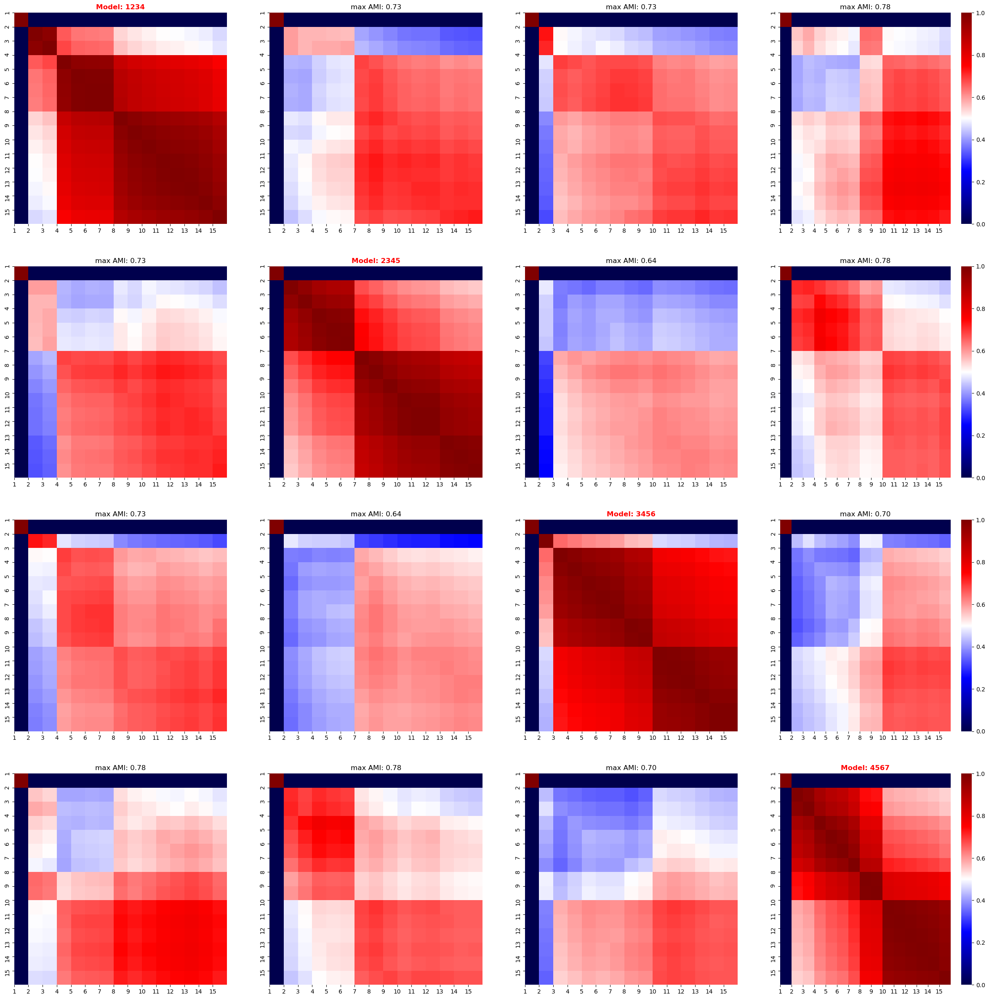

100%|██████████| 4/4 [00:02<00:00,  1.53it/s]


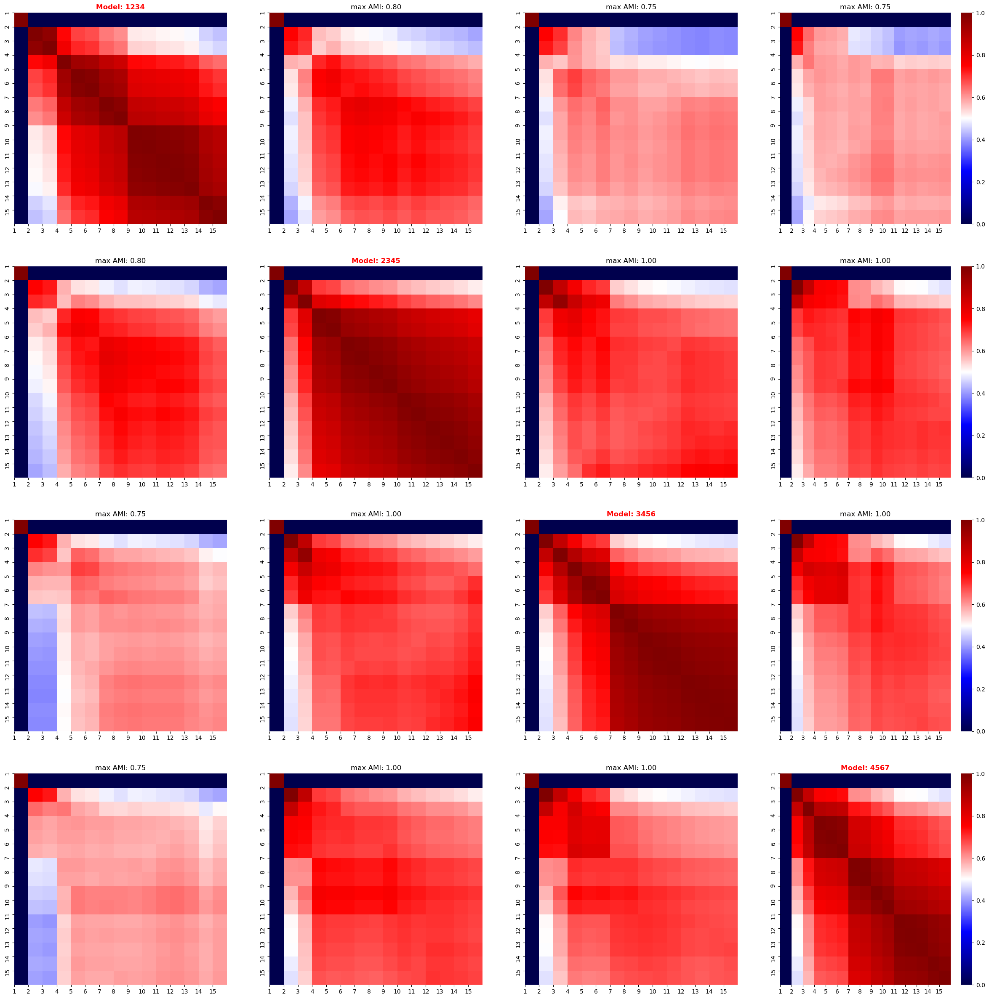

 24%|██▍       | 245/1000 [00:03<00:11, 67.62it/s]


Training stopped after 246 epochs
Best model found at epoch 194
------------------------------------------------------------
TRAIN loss: 1.1233421564102173
VAL loss: 1.1841121912002563
TEST loss: 1.2577576637268066
TEST AUC: 0.7498150887573964 	 AP: 0.7825401172926465


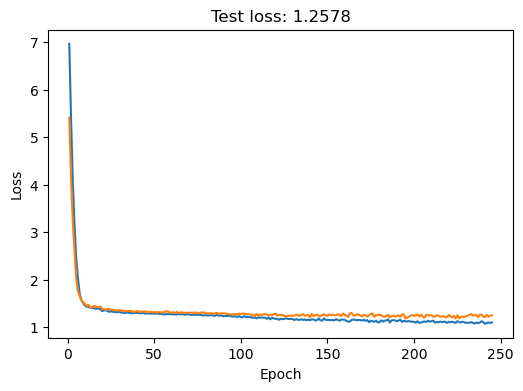

 41%|████      | 410/1000 [00:06<00:08, 66.00it/s]


Training stopped after 411 epochs
Best model found at epoch 359
------------------------------------------------------------
TRAIN loss: 1.0850470066070557
VAL loss: 1.150524377822876
TEST loss: 1.195605754852295
TEST AUC: 0.7751479289940828 	 AP: 0.7889249177648209


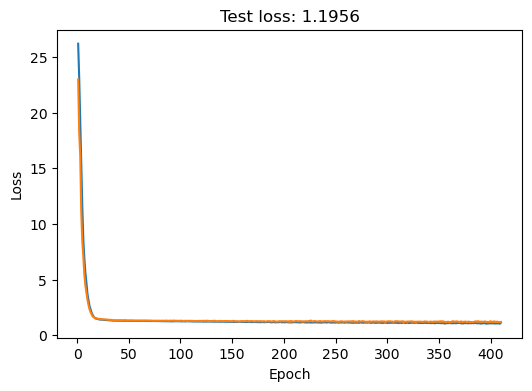

 20%|██        | 201/1000 [00:02<00:11, 67.59it/s]


Training stopped after 202 epochs
Best model found at epoch 150
------------------------------------------------------------
TRAIN loss: 1.175696849822998
VAL loss: 1.2119908332824707
TEST loss: 1.2117414474487305
TEST AUC: 0.7457470414201184 	 AP: 0.7833045036134217


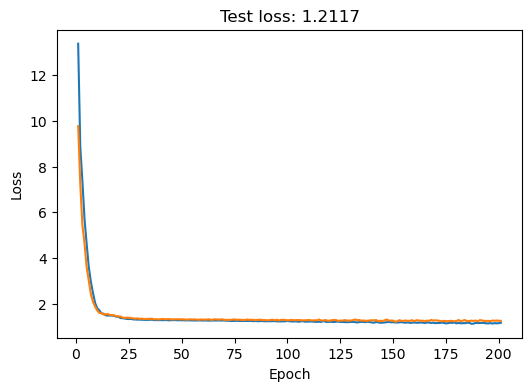

 31%|███       | 308/1000 [00:04<00:10, 64.83it/s]


Training stopped after 309 epochs
Best model found at epoch 257
------------------------------------------------------------
TRAIN loss: 1.1117234230041504
VAL loss: 1.1659990549087524
TEST loss: 1.2103056907653809
TEST AUC: 0.7608173076923077 	 AP: 0.7963365087240768


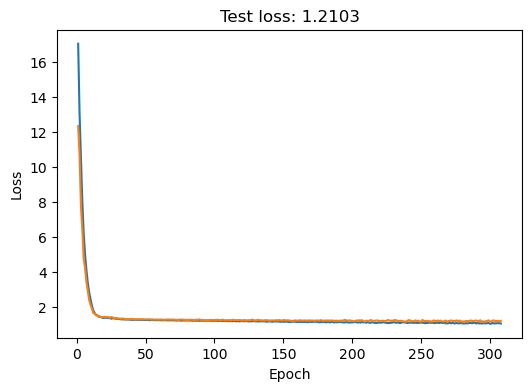

100%|██████████| 4/4 [00:02<00:00,  1.36it/s]


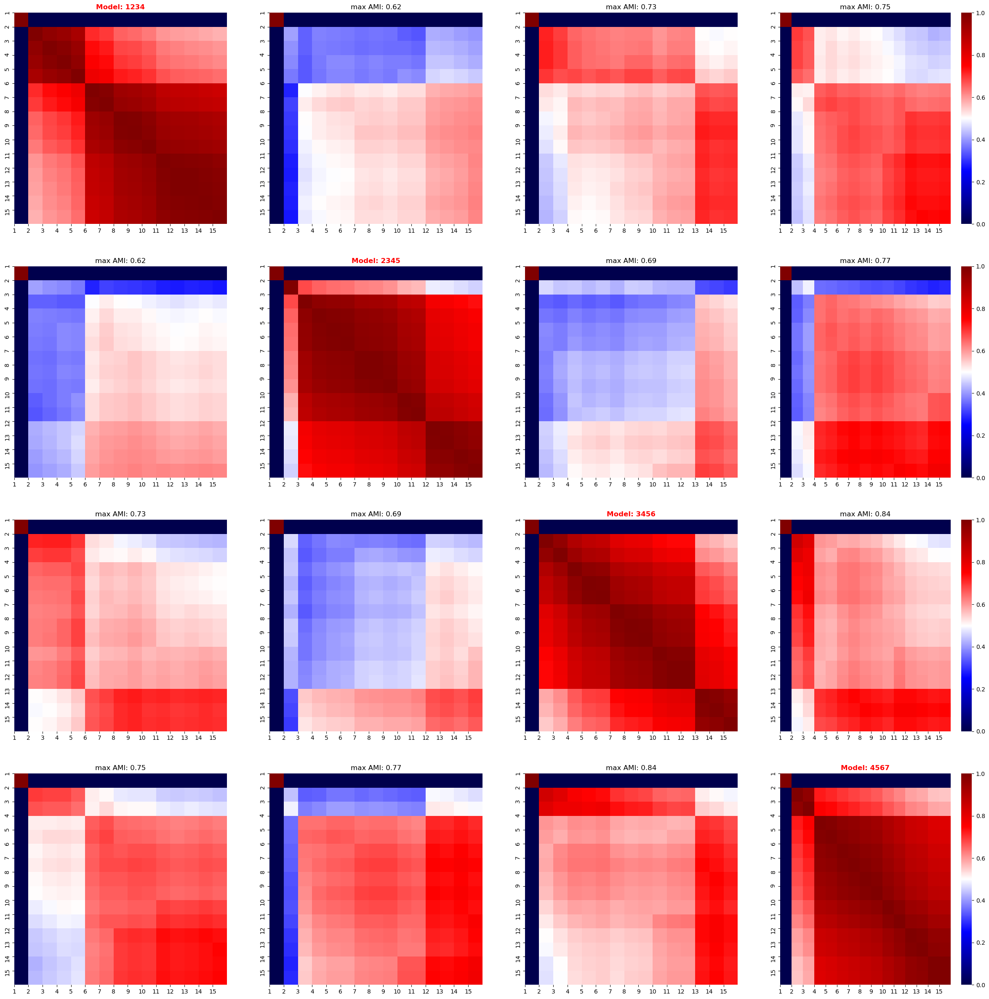

100%|██████████| 4/4 [00:02<00:00,  1.38it/s]


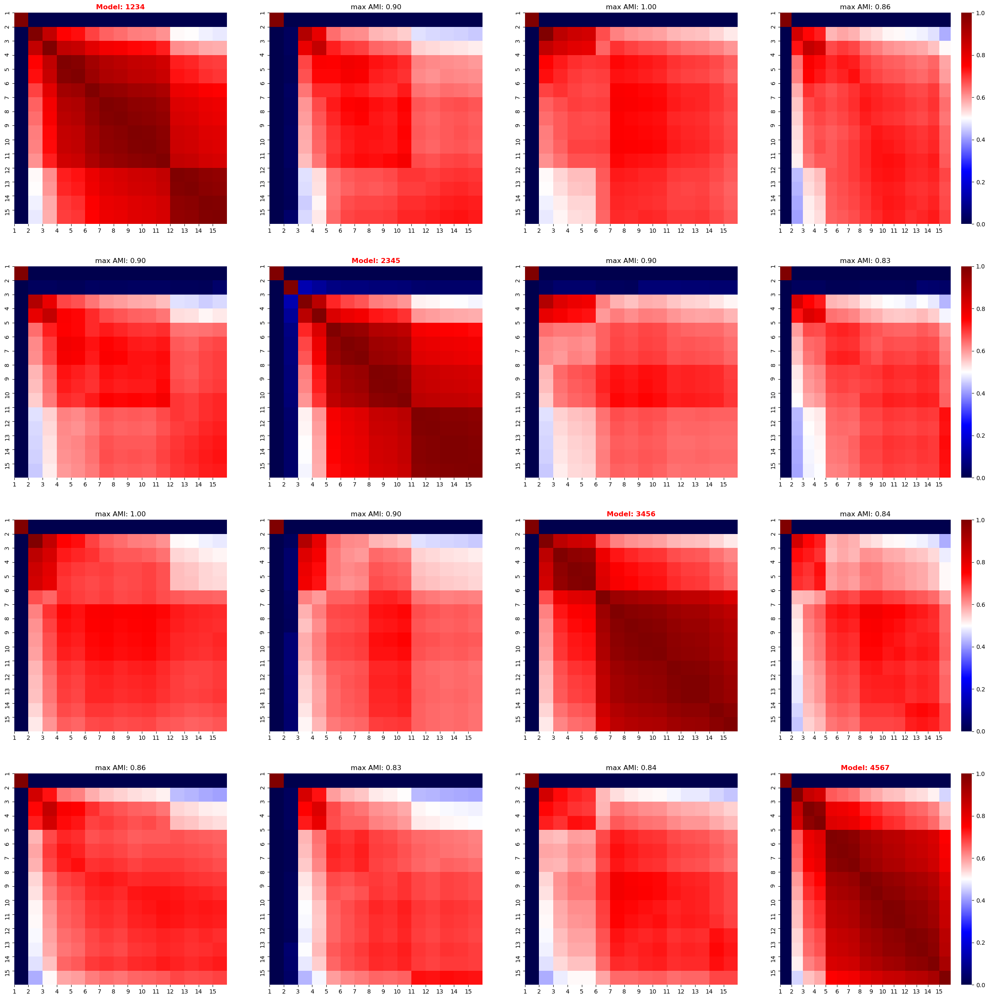

 20%|█▉        | 195/1000 [00:03<00:12, 64.68it/s]


Training stopped after 196 epochs
Best model found at epoch 144
------------------------------------------------------------
TRAIN loss: 1.1781330108642578
VAL loss: 1.2184677124023438
TEST loss: 1.259134292602539
TEST AUC: 0.7690458579881656 	 AP: 0.728147690951397


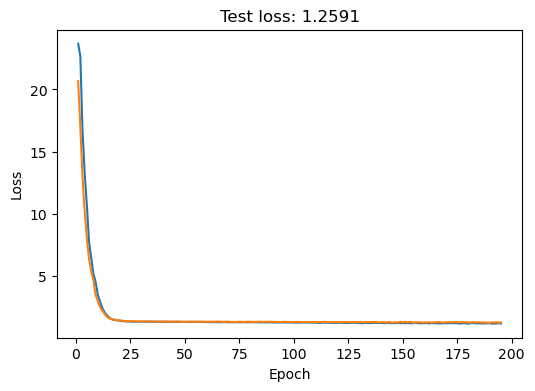

 33%|███▎      | 327/1000 [00:05<00:10, 62.80it/s]


Training stopped after 328 epochs
Best model found at epoch 276
------------------------------------------------------------
TRAIN loss: 1.1363041400909424
VAL loss: 1.1682584285736084
TEST loss: 1.2183313369750977
TEST AUC: 0.7390902366863905 	 AP: 0.7209914511050713


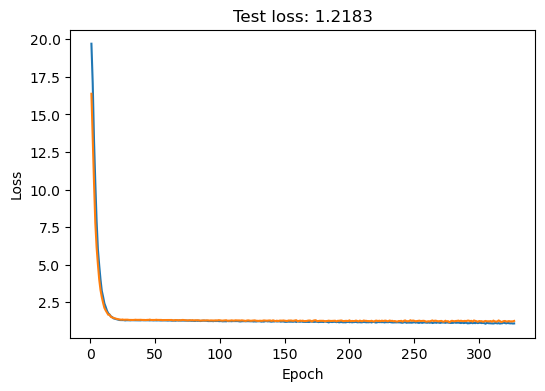

 30%|███       | 301/1000 [00:04<00:10, 63.77it/s]


Training stopped after 302 epochs
Best model found at epoch 250
------------------------------------------------------------
TRAIN loss: 1.0804378986358643
VAL loss: 1.1730890274047852
TEST loss: 1.2248661518096924
TEST AUC: 0.7603550295857988 	 AP: 0.7333857673675916


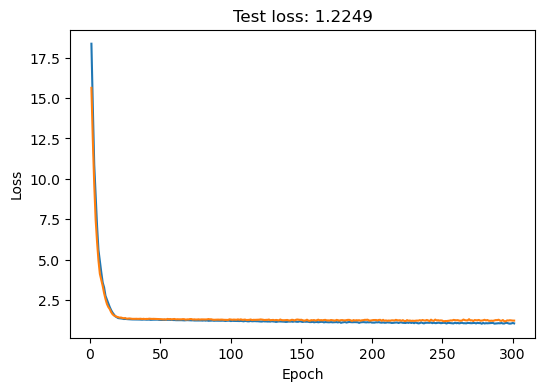

 24%|██▎       | 237/1000 [00:03<00:11, 67.15it/s]


Training stopped after 238 epochs
Best model found at epoch 186
------------------------------------------------------------
TRAIN loss: 1.1621695756912231
VAL loss: 1.2224712371826172
TEST loss: 1.229888916015625
TEST AUC: 0.7531434911242604 	 AP: 0.7297863087090468


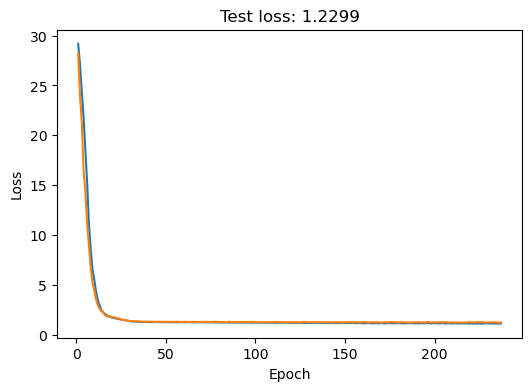

100%|██████████| 4/4 [00:03<00:00,  1.08it/s]


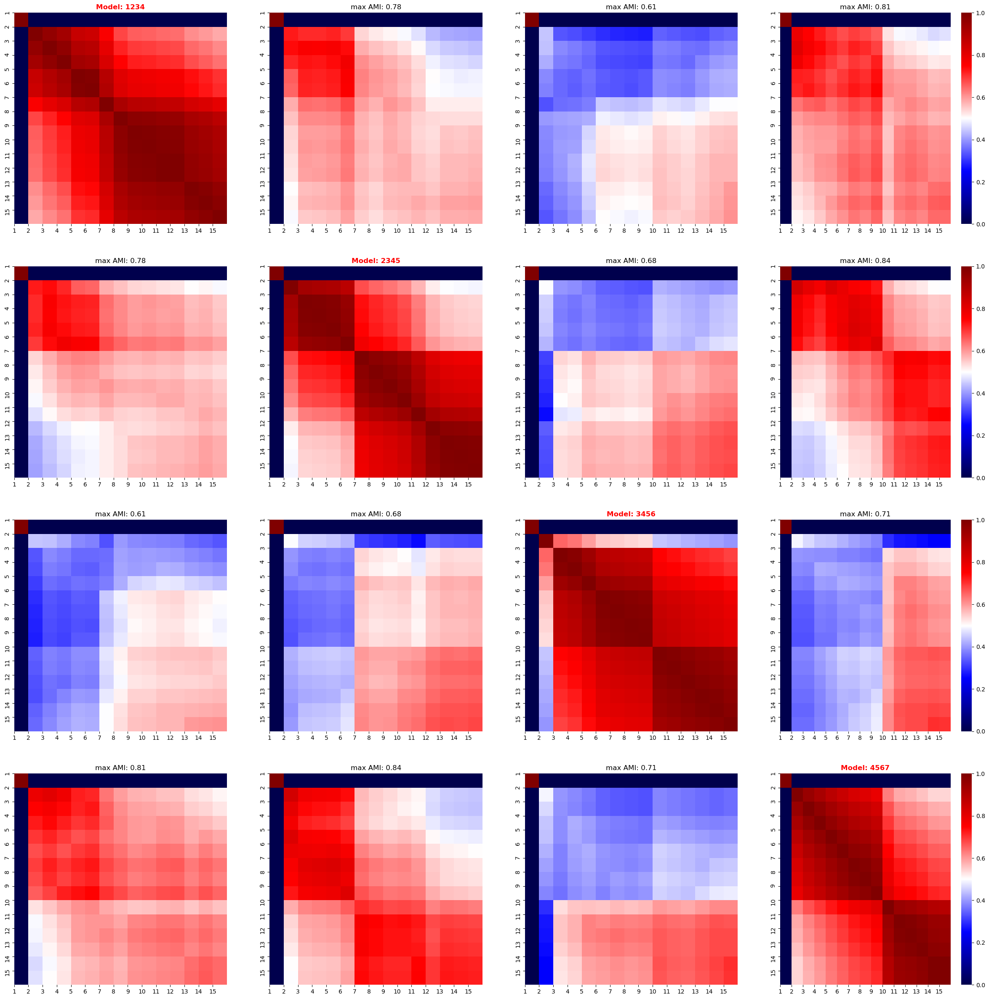

100%|██████████| 4/4 [00:03<00:00,  1.06it/s]


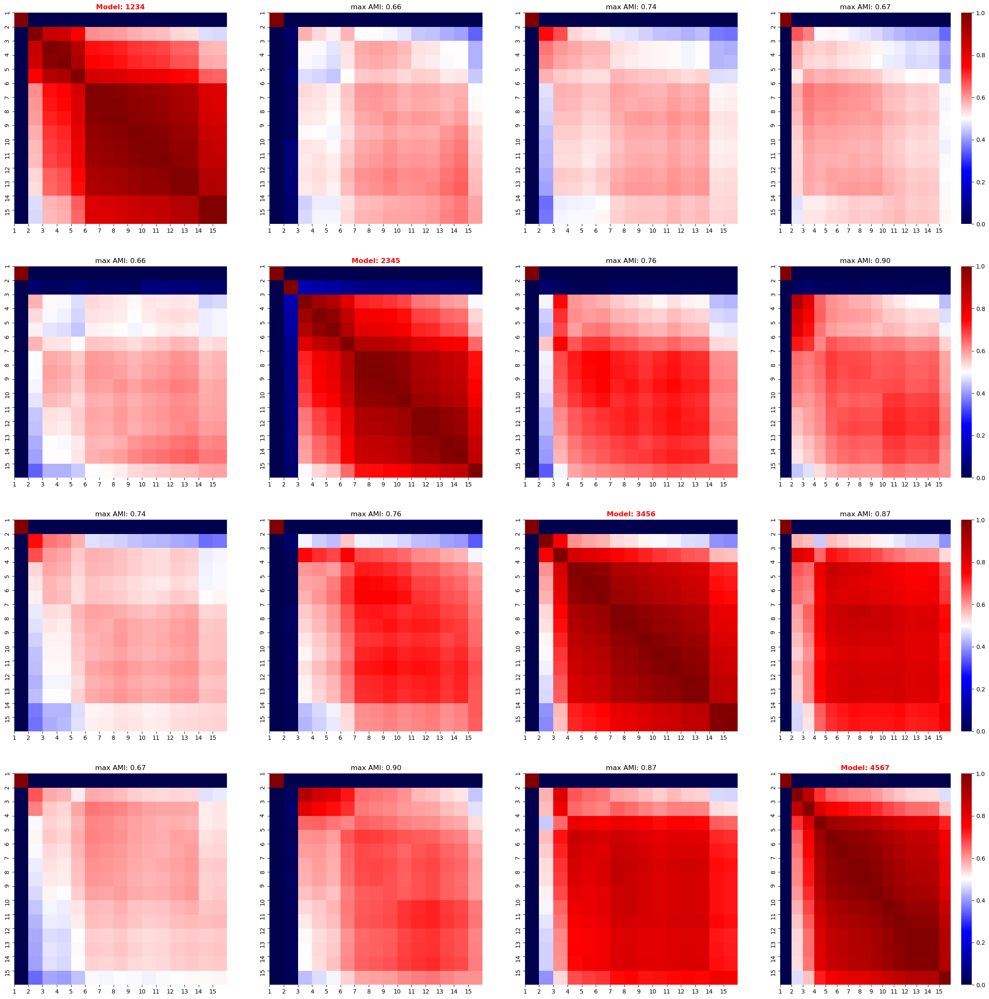

<IPython.core.display.Javascript object>

In [12]:
node_feature_key = "sc_gex"
for latent_dim in latent_dims:
    latents_dict_hallgexgae_lp = get_gae_latents_for_seed(
        graph_data=graph_data,
        seeds=seeds,
        node_feature_key=node_feature_key,
        input_dim=1126,
        latent_dim=latent_dim,
        hidden_dim=128,
        n_epochs=1000,
        lr=0.0001,
        link_pred=True,
        plot_loss=True,
    )
    stability_amis_hallgexgae_lp = stability_cocluster_screen(
        latents_dict_hallgexgae_lp, linkage="average", affinity="cosine"
    )
    plot_amis_matrices(seeds, stability_amis_hallgexgae_lp)
    stability_amis_hallgexgae_lp = stability_cocluster_screen(
        latents_dict_hallgexgae_lp, linkage="average", affinity="euclidean"
    )
    plot_amis_matrices(seeds, stability_amis_hallgexgae_lp)

---

##### GEX GAE (adjacency & feature reconstruction)

Next, we keep the previous model setup but train it on the task of feature reconstruction and the reconstruction of the adjacency matrix without any training-validation or test split of the data.

Latent dim: 32


 64%|██████▍   | 638/1000 [00:10<00:06, 58.40it/s]


Training stopped after 639 epochs
Best model found at epoch 587
------------------------------------------------------------
TRAIN loss: 1.1193323135375977
VAL loss: 1.1083934307098389
TEST loss: 1.1250758171081543


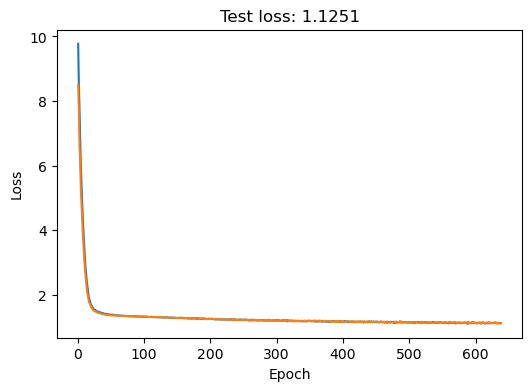

 36%|███▌      | 359/1000 [00:06<00:10, 59.63it/s]


Training stopped after 360 epochs
Best model found at epoch 308
------------------------------------------------------------
TRAIN loss: 1.1857508420944214
VAL loss: 1.1639436483383179
TEST loss: 1.1919689178466797


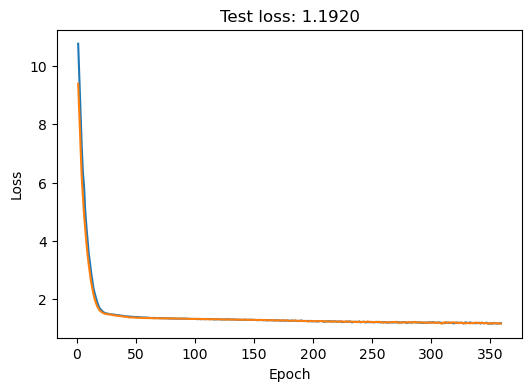

 63%|██████▎   | 629/1000 [00:10<00:06, 61.00it/s]


Training stopped after 630 epochs
Best model found at epoch 578
------------------------------------------------------------
TRAIN loss: 1.1067519187927246
VAL loss: 1.0937340259552002
TEST loss: 1.1140209436416626


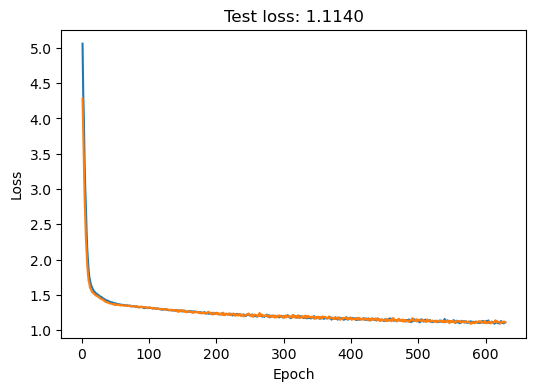

 60%|█████▉    | 597/1000 [00:10<00:07, 55.17it/s]


Training stopped after 598 epochs
Best model found at epoch 546
------------------------------------------------------------
TRAIN loss: 1.1523990631103516
VAL loss: 1.1028412580490112
TEST loss: 1.134883999824524


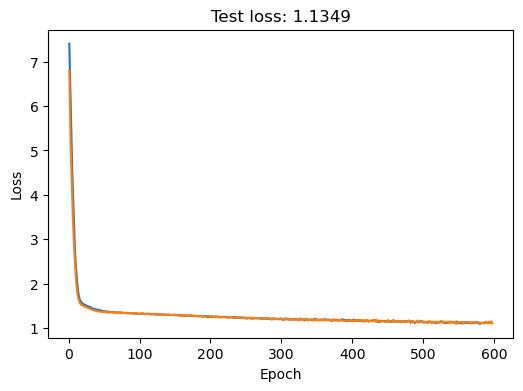

100%|██████████| 4/4 [00:02<00:00,  1.67it/s]


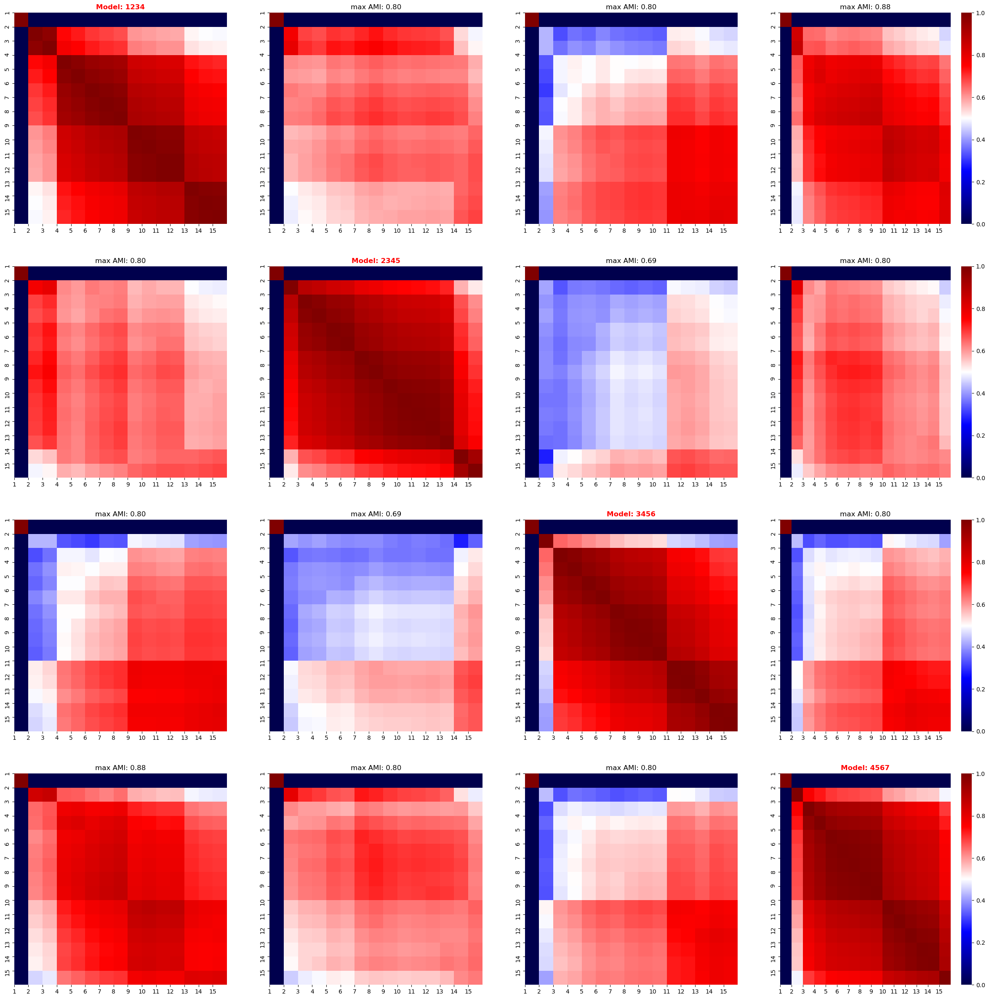

100%|██████████| 4/4 [00:02<00:00,  1.67it/s]


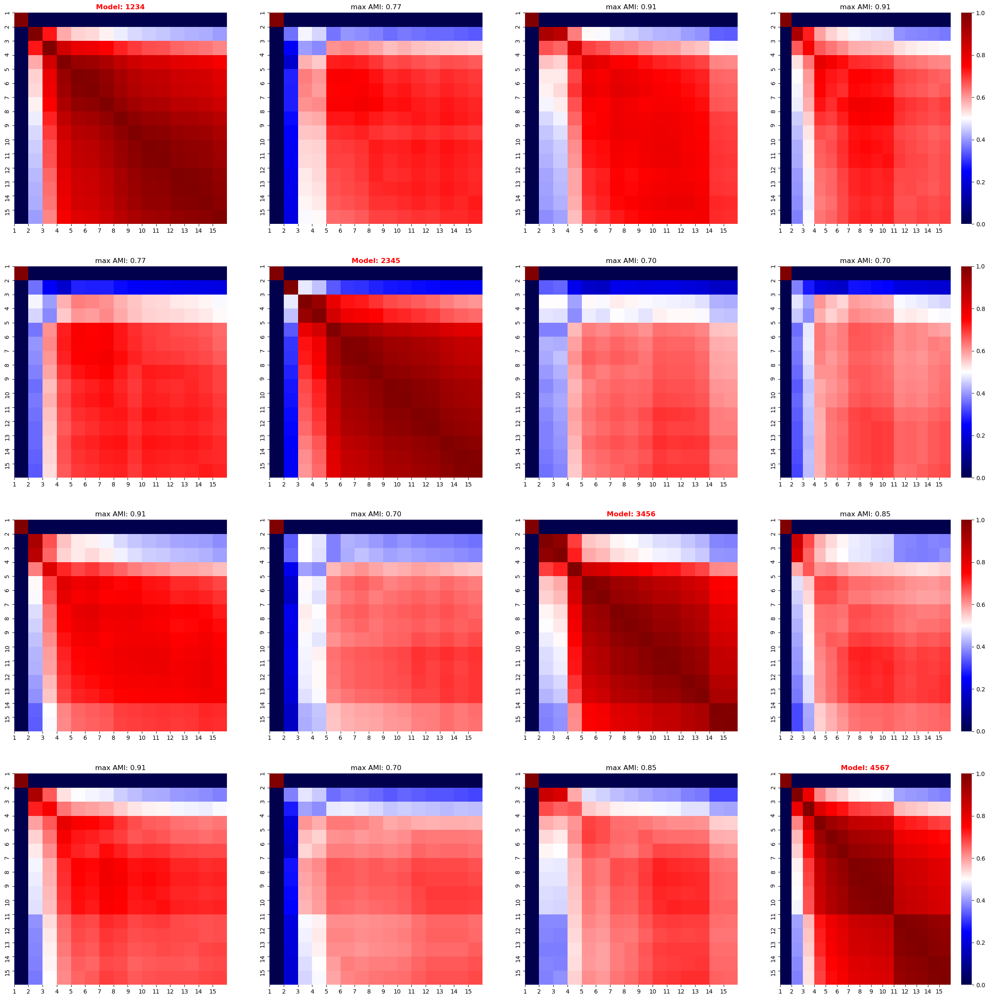

Latent dim: 64


 74%|███████▍  | 745/1000 [00:12<00:04, 59.88it/s]


Training stopped after 746 epochs
Best model found at epoch 694
------------------------------------------------------------
TRAIN loss: 1.1181442737579346
VAL loss: 1.0996549129486084
TEST loss: 1.1232409477233887


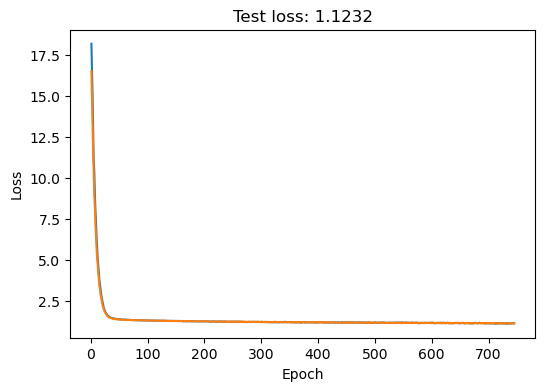

 64%|██████▎   | 635/1000 [00:10<00:06, 59.89it/s]


Training stopped after 636 epochs
Best model found at epoch 584
------------------------------------------------------------
TRAIN loss: 1.127347469329834
VAL loss: 1.11212956905365
TEST loss: 1.135094165802002


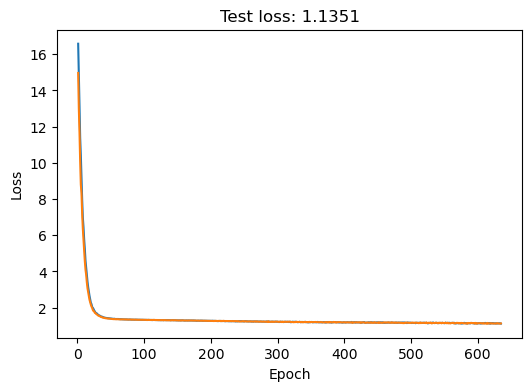

 62%|██████▏   | 615/1000 [00:09<00:06, 62.74it/s]


Training stopped after 616 epochs
Best model found at epoch 564
------------------------------------------------------------
TRAIN loss: 1.13468599319458
VAL loss: 1.1127920150756836
TEST loss: 1.1396068334579468


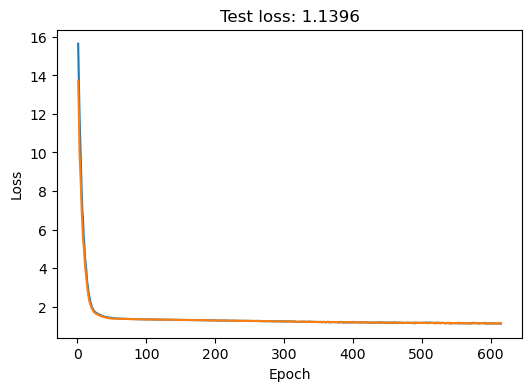

 69%|██████▊   | 686/1000 [00:11<00:05, 60.39it/s]


Training stopped after 687 epochs
Best model found at epoch 635
------------------------------------------------------------
TRAIN loss: 1.0936731100082397
VAL loss: 1.0601451396942139
TEST loss: 1.0743136405944824


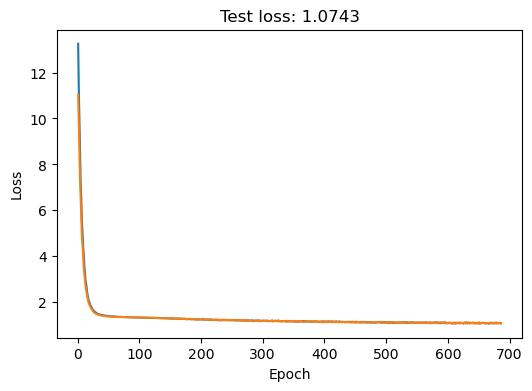

100%|██████████| 4/4 [00:02<00:00,  1.44it/s]


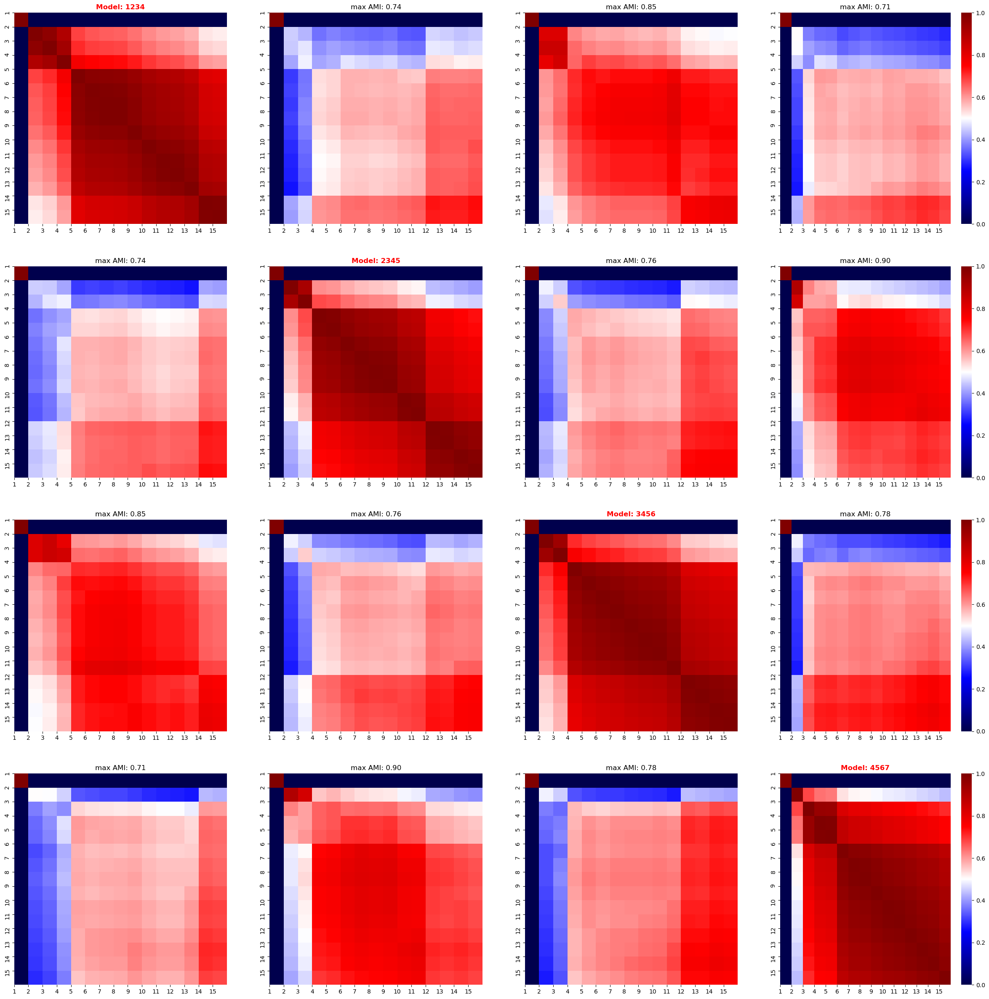

100%|██████████| 4/4 [00:02<00:00,  1.46it/s]


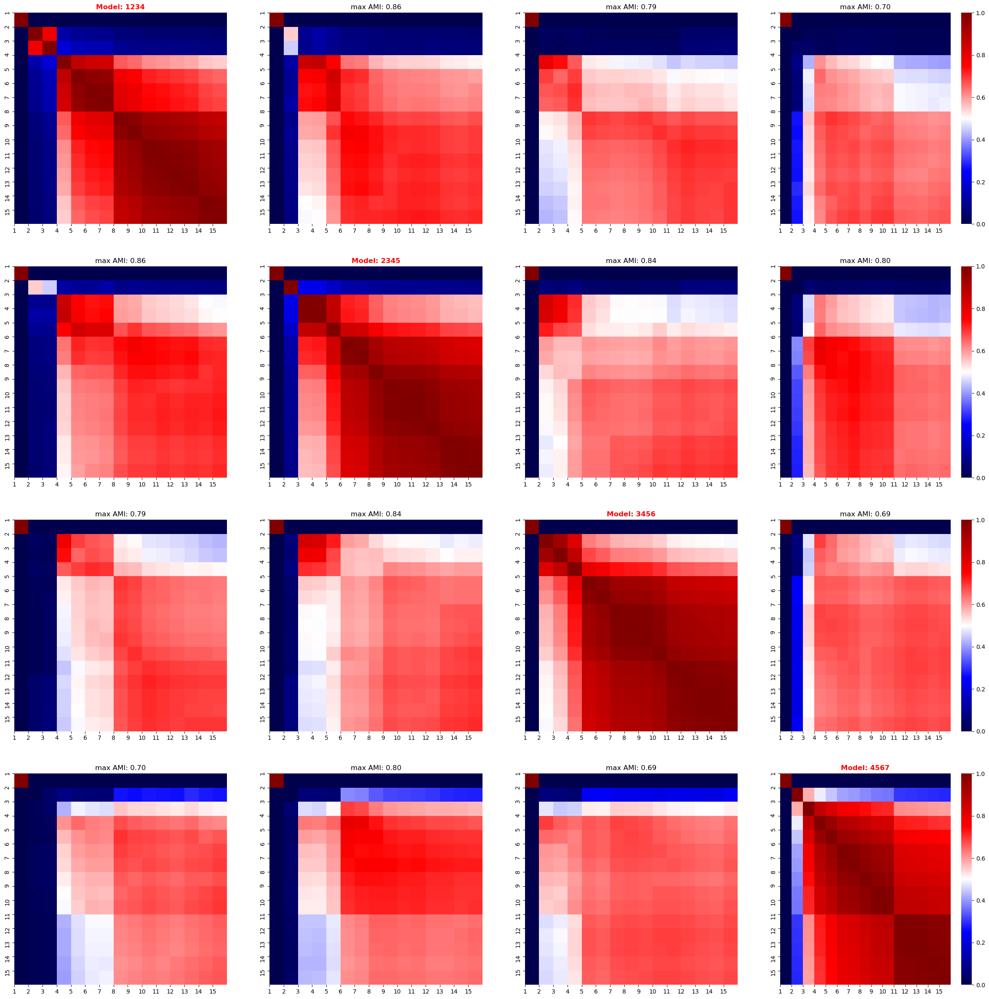

Latent dim: 128


 52%|█████▏    | 519/1000 [00:08<00:08, 58.92it/s]


Training stopped after 520 epochs
Best model found at epoch 468
------------------------------------------------------------
TRAIN loss: 1.1792216300964355
VAL loss: 1.1503701210021973
TEST loss: 1.1635770797729492


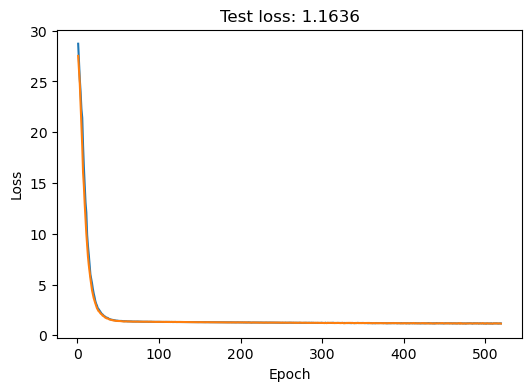

 89%|████████▉ | 890/1000 [00:14<00:01, 59.52it/s]


Training stopped after 891 epochs
Best model found at epoch 839
------------------------------------------------------------
TRAIN loss: 1.0705968141555786
VAL loss: 1.0429151058197021
TEST loss: 1.0557961463928223


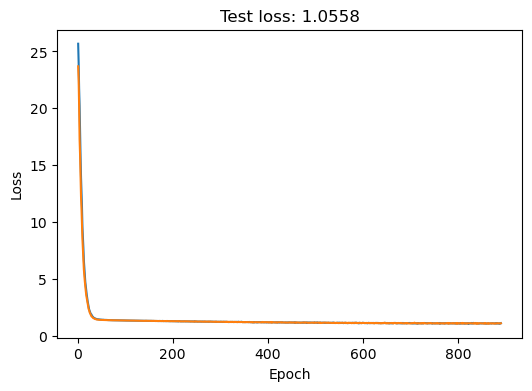

 63%|██████▎   | 628/1000 [00:11<00:06, 53.63it/s]


Training stopped after 629 epochs
Best model found at epoch 577
------------------------------------------------------------
TRAIN loss: 1.124345064163208
VAL loss: 1.0927770137786865
TEST loss: 1.1062763929367065


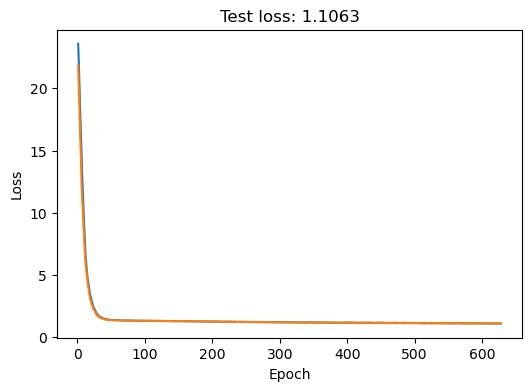

 89%|████████▉ | 888/1000 [00:14<00:01, 60.56it/s]


Training stopped after 889 epochs
Best model found at epoch 837
------------------------------------------------------------
TRAIN loss: 1.0696772336959839
VAL loss: 1.0559406280517578
TEST loss: 1.0665334463119507


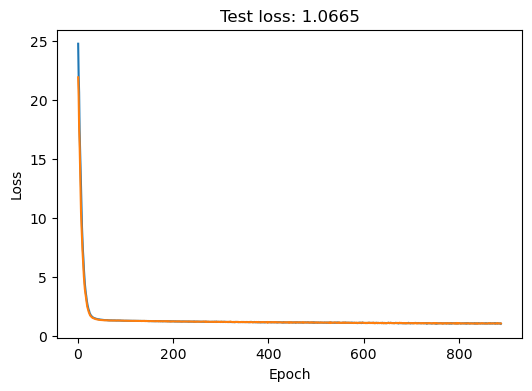

100%|██████████| 4/4 [00:03<00:00,  1.18it/s]


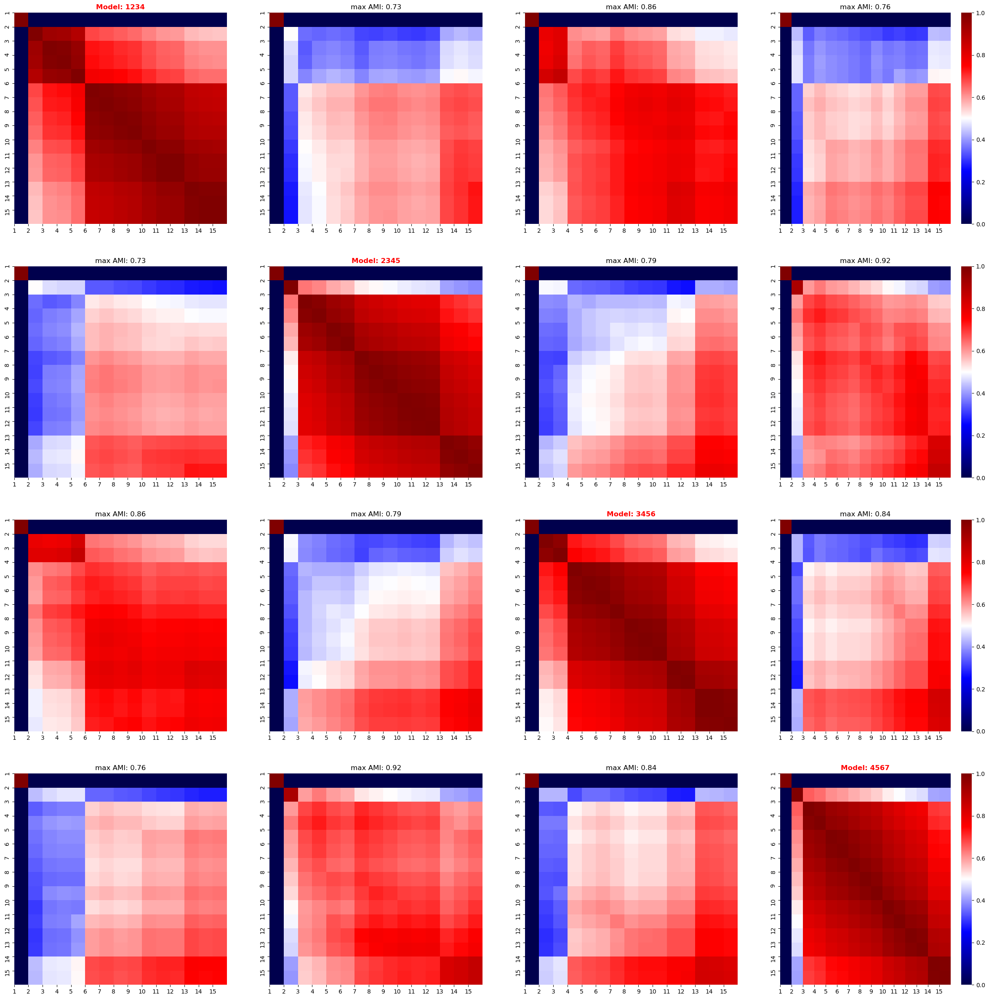

100%|██████████| 4/4 [00:03<00:00,  1.14it/s]


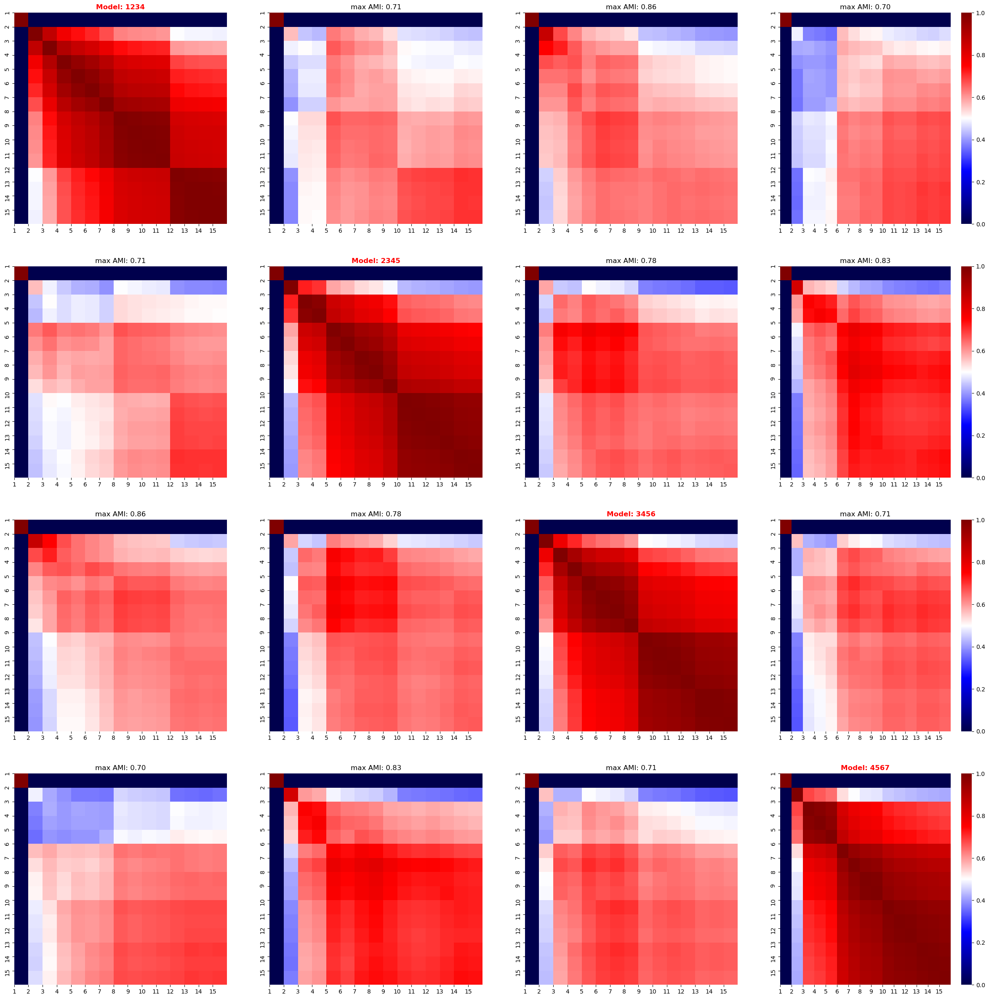

<IPython.core.display.Javascript object>

In [129]:
node_feature_key = "sc_gex"

for latent_dim in latent_dims:
    print("Latent dim: {}".format(latent_dim))
    latents_dict_gexgae_feat = get_gae_latents_for_seed(
        graph_data=graph_data,
        seeds=seeds,
        node_feature_key=node_feature_key,
        input_dim=1126,
        latent_dim=latent_dim,
        hidden_dim=128,
        n_epochs=1000,
        lr=0.00005,
        link_pred=False,
        reconstruct_features=True,
        feature_decoder_params={
            "latent_dim": latent_dim,
            "output_dim": 1126,
            "hidden_dims": [256, 512, 1024],
        },
        feat_loss=torch.nn.MSELoss(),
        alpha=1,
        beta=1,
        plot_loss=True,
    )
    stability_amis_gexgae_feat = stability_cocluster_screen(
        latents_dict_gexgae_feat, linkage="average", affinity="cosine"
    )
    plot_amis_matrices(seeds, stability_amis_gexgae_feat)
    stability_amis_hallgexgae_feat = stability_cocluster_screen(
        latents_dict_gexgae_feat, linkage="average", affinity="euclidean"
    )
    plot_amis_matrices(seeds, stability_amis_hallgexgae_feat)

---

##### HallGEX GAE (adjacency & feature reconstruction)

Next, we keep the previous model setup but train it on the task of feature reconstruction and the reconstruction of the adjacency matrix without any training-validation or test split of the data.

Latent dim: 32


 60%|██████    | 604/1000 [00:08<00:05, 70.04it/s]


Training stopped after 605 epochs
Best model found at epoch 553
------------------------------------------------------------
TRAIN loss: 1.1470887660980225
VAL loss: 1.1168406009674072
TEST loss: 1.1306530237197876


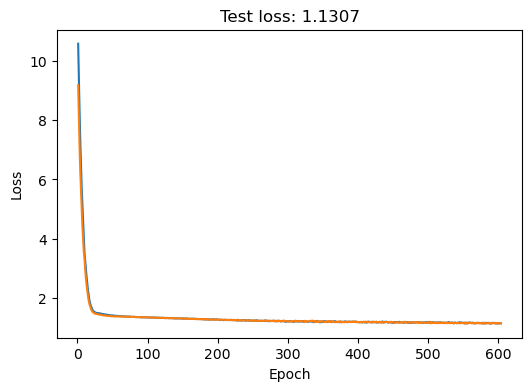

 61%|██████▏   | 614/1000 [00:08<00:05, 69.21it/s]


Training stopped after 615 epochs
Best model found at epoch 563
------------------------------------------------------------
TRAIN loss: 1.1458537578582764
VAL loss: 1.1135387420654297
TEST loss: 1.116532325744629


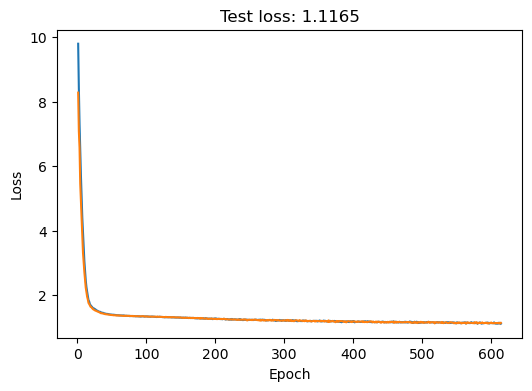

 64%|██████▍   | 639/1000 [00:09<00:05, 65.78it/s]


Training stopped after 640 epochs
Best model found at epoch 588
------------------------------------------------------------
TRAIN loss: 1.0848026275634766
VAL loss: 1.0601011514663696
TEST loss: 1.1073411703109741


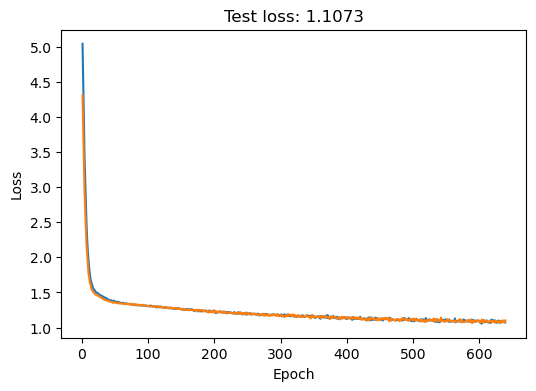

 67%|██████▋   | 668/1000 [00:10<00:05, 65.01it/s]

Training stopped after 669 epochs
Best model found at epoch 617
------------------------------------------------------------
TRAIN loss: 1.103992223739624
VAL loss: 1.0608428716659546
TEST loss: 1.0906987190246582


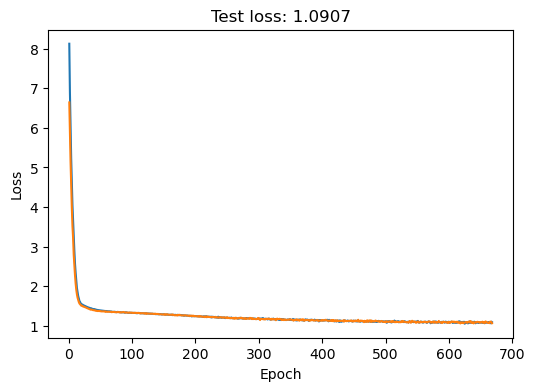

100%|██████████| 4/4 [00:02<00:00,  1.69it/s]


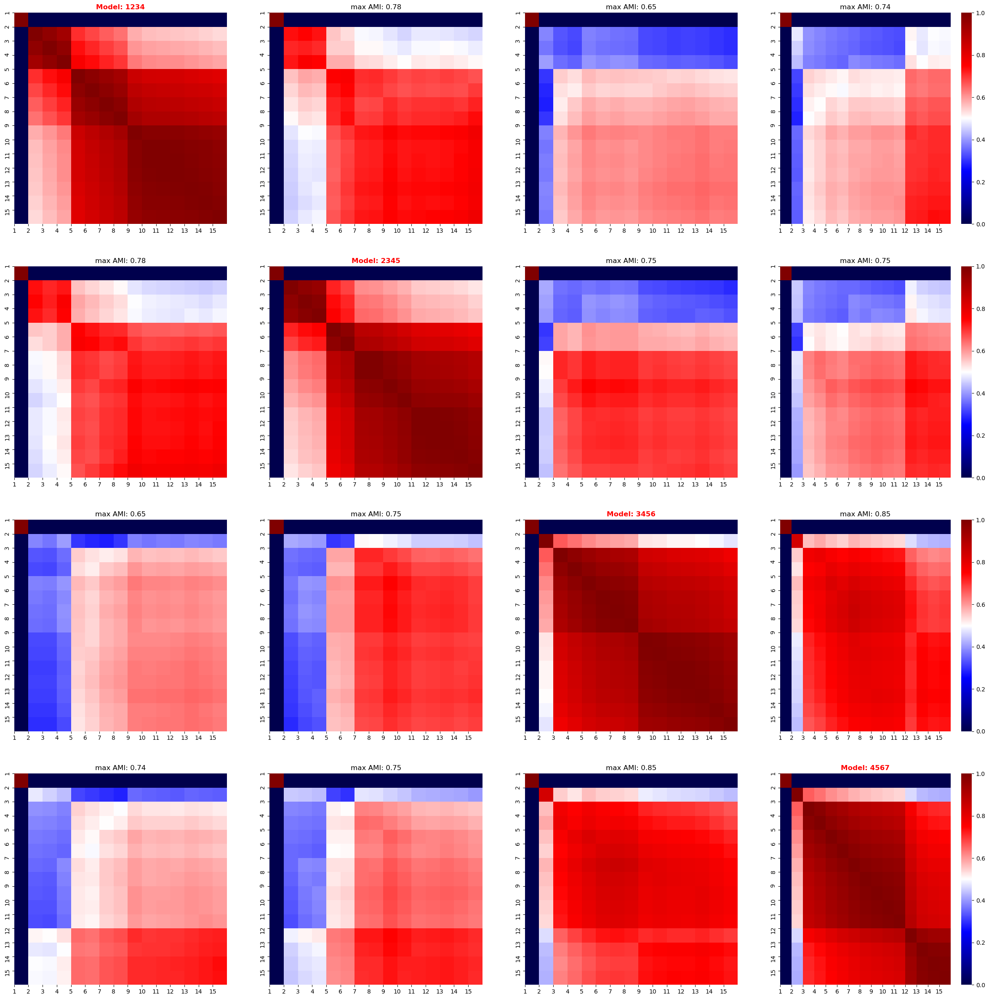

100%|██████████| 4/4 [00:02<00:00,  1.71it/s]


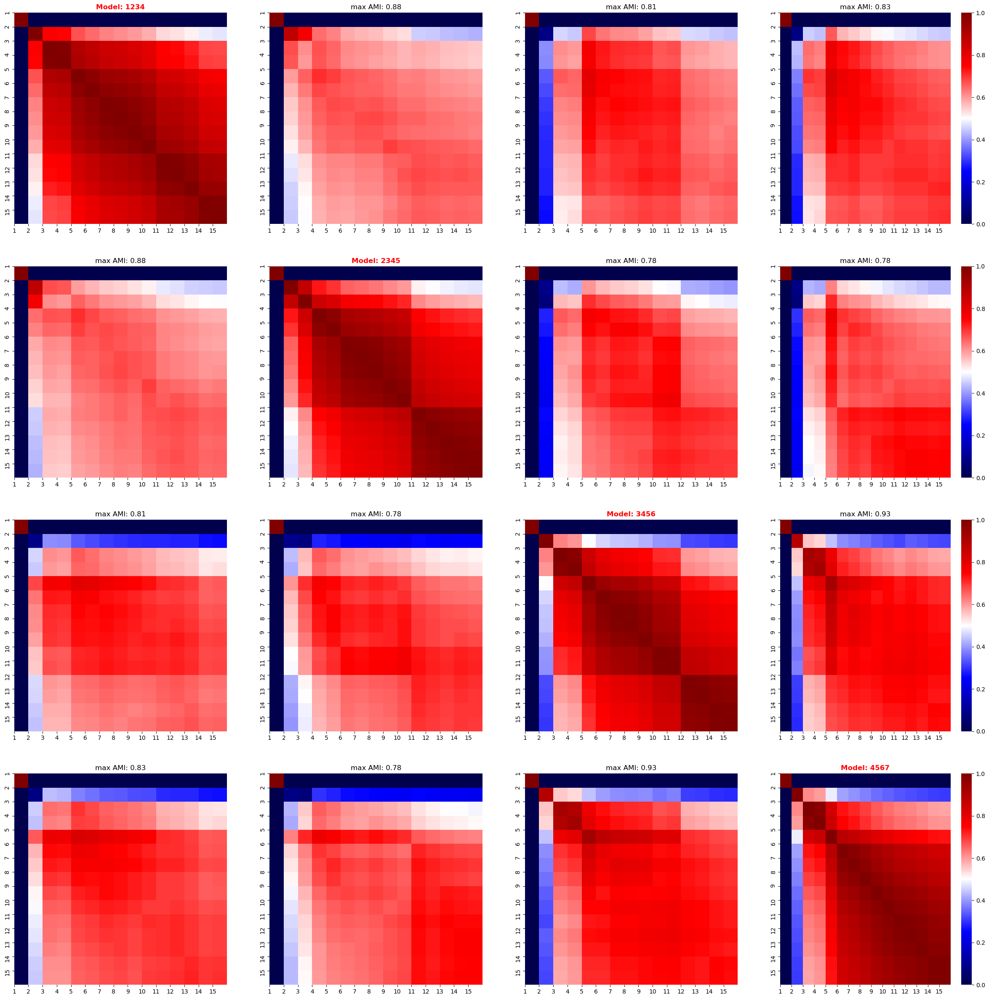

Latent dim: 64


 76%|███████▌  | 761/1000 [00:11<00:03, 65.42it/s]


Training stopped after 762 epochs
Best model found at epoch 710
------------------------------------------------------------
TRAIN loss: 1.0918079614639282
VAL loss: 1.0626380443572998
TEST loss: 1.084519624710083


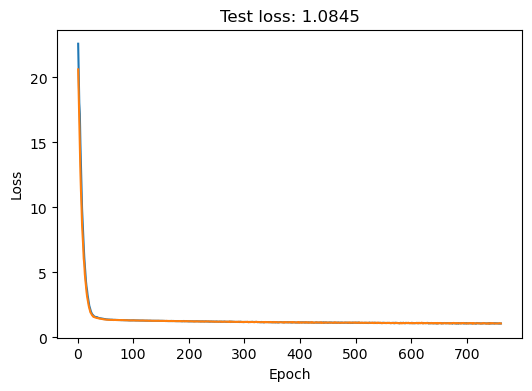

 66%|██████▌   | 656/1000 [00:10<00:05, 61.47it/s]


Training stopped after 657 epochs
Best model found at epoch 605
------------------------------------------------------------
TRAIN loss: 1.1047524213790894
VAL loss: 1.0748546123504639
TEST loss: 1.1071796417236328


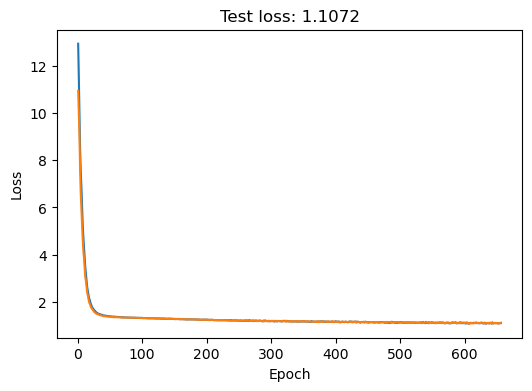

 70%|███████   | 704/1000 [00:10<00:04, 67.76it/s]

Training stopped after 705 epochs
Best model found at epoch 653
------------------------------------------------------------
TRAIN loss: 1.0700541734695435
VAL loss: 1.0401201248168945
TEST loss: 1.0649559497833252


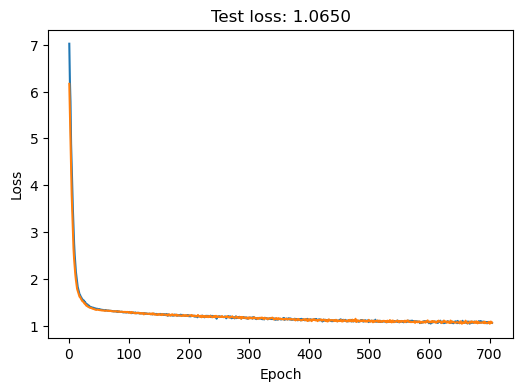

 53%|█████▎    | 526/1000 [00:07<00:07, 66.26it/s]


Training stopped after 527 epochs
Best model found at epoch 475
------------------------------------------------------------
TRAIN loss: 1.1444600820541382
VAL loss: 1.1078401803970337
TEST loss: 1.1235811710357666


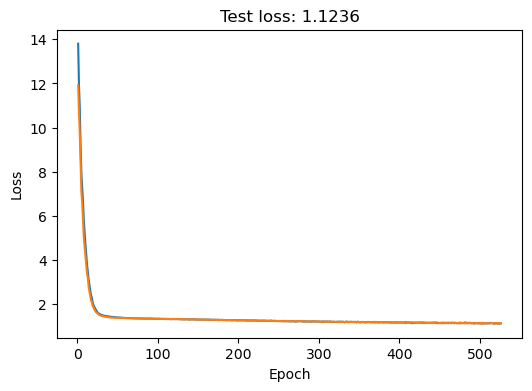

100%|██████████| 4/4 [00:02<00:00,  1.46it/s]


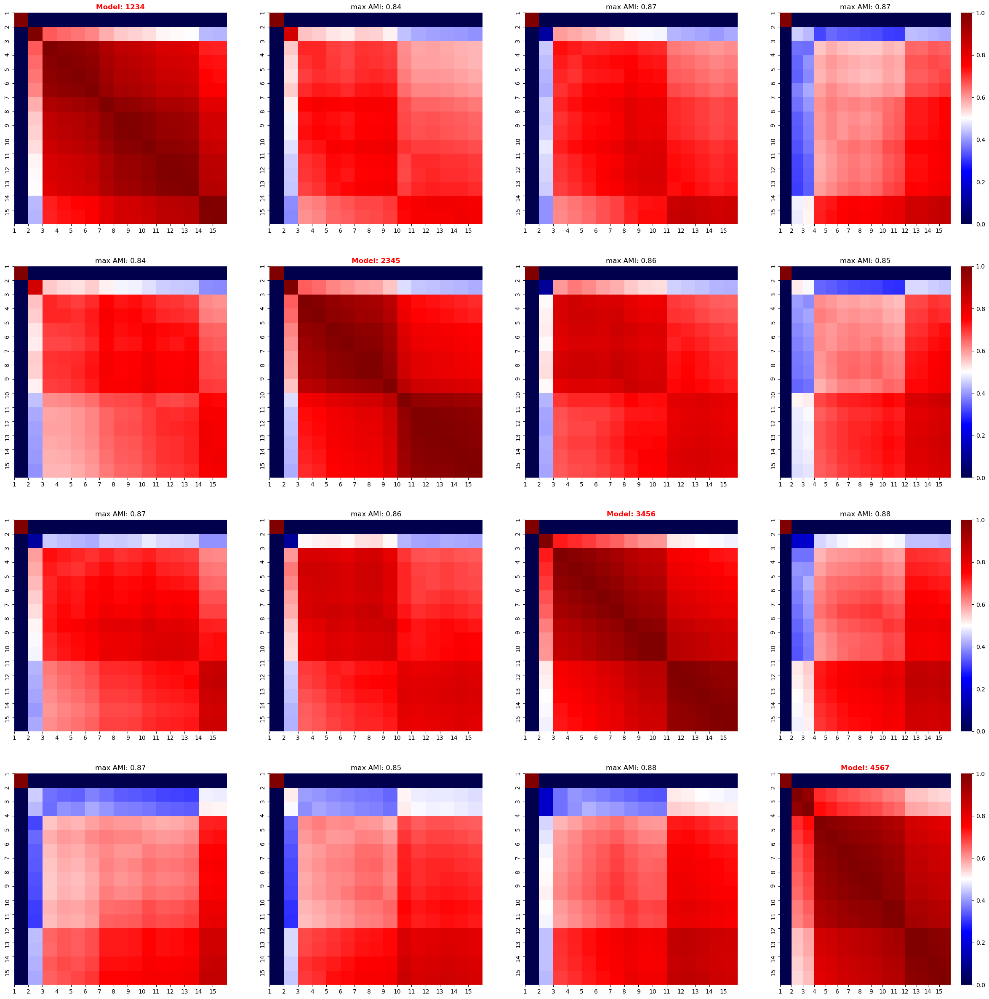

100%|██████████| 4/4 [00:02<00:00,  1.48it/s]


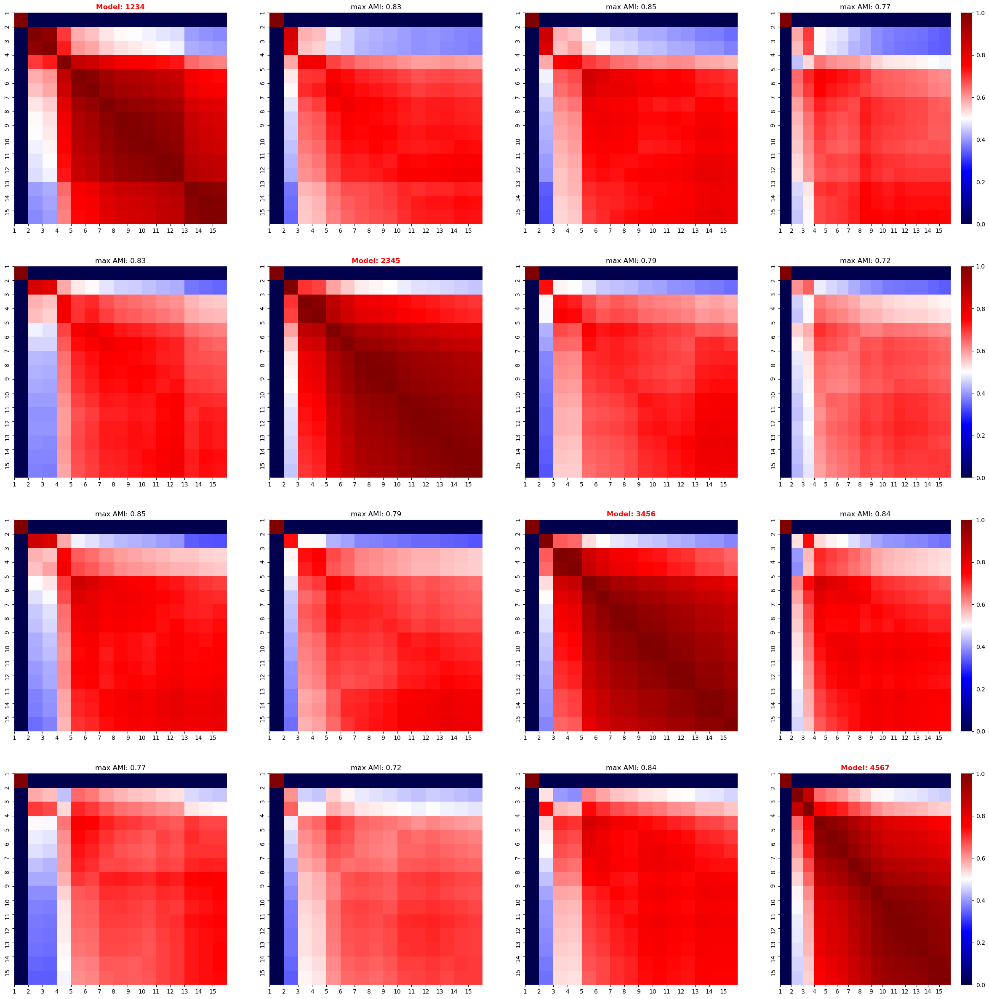

Latent dim: 128


 91%|█████████▏| 914/1000 [00:13<00:01, 68.82it/s]


Training stopped after 915 epochs
Best model found at epoch 863
------------------------------------------------------------
TRAIN loss: 1.064237356185913
VAL loss: 1.0281085968017578
TEST loss: 1.042980670928955


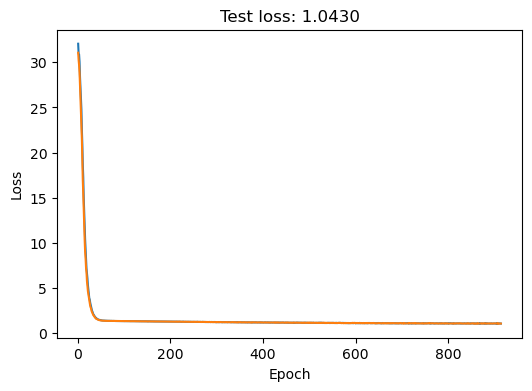

 78%|███████▊  | 778/1000 [00:11<00:03, 68.78it/s]


Training stopped after 779 epochs
Best model found at epoch 727
------------------------------------------------------------
TRAIN loss: 1.0665717124938965
VAL loss: 1.0398343801498413
TEST loss: 1.0545178651809692


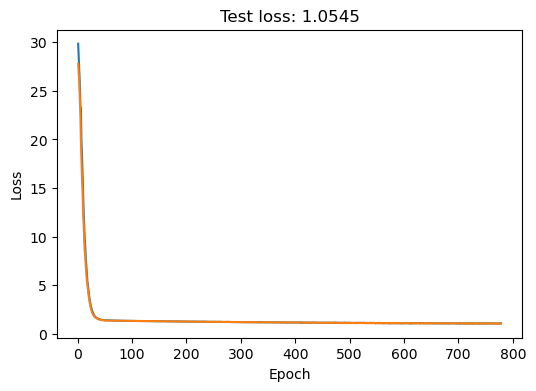

 64%|██████▎   | 635/1000 [00:09<00:05, 67.84it/s]


Training stopped after 636 epochs
Best model found at epoch 584
------------------------------------------------------------
TRAIN loss: 1.0783500671386719
VAL loss: 1.0443146228790283
TEST loss: 1.0443544387817383


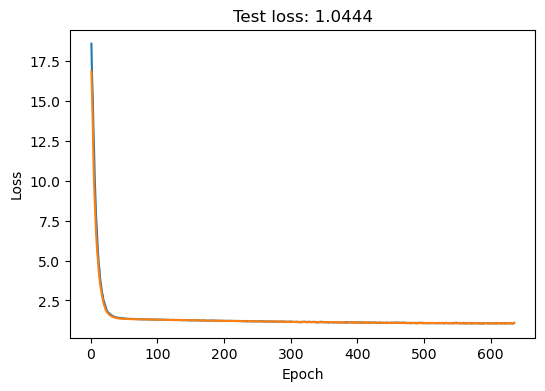

 76%|███████▌  | 761/1000 [00:11<00:03, 63.54it/s]


Training stopped after 762 epochs
Best model found at epoch 710
------------------------------------------------------------
TRAIN loss: 1.0659555196762085
VAL loss: 1.0450395345687866
TEST loss: 1.0805858373641968


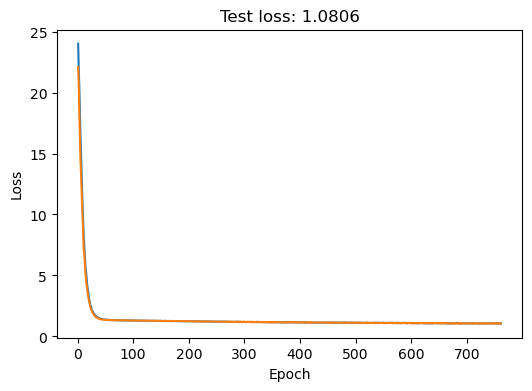

100%|██████████| 4/4 [00:03<00:00,  1.18it/s]


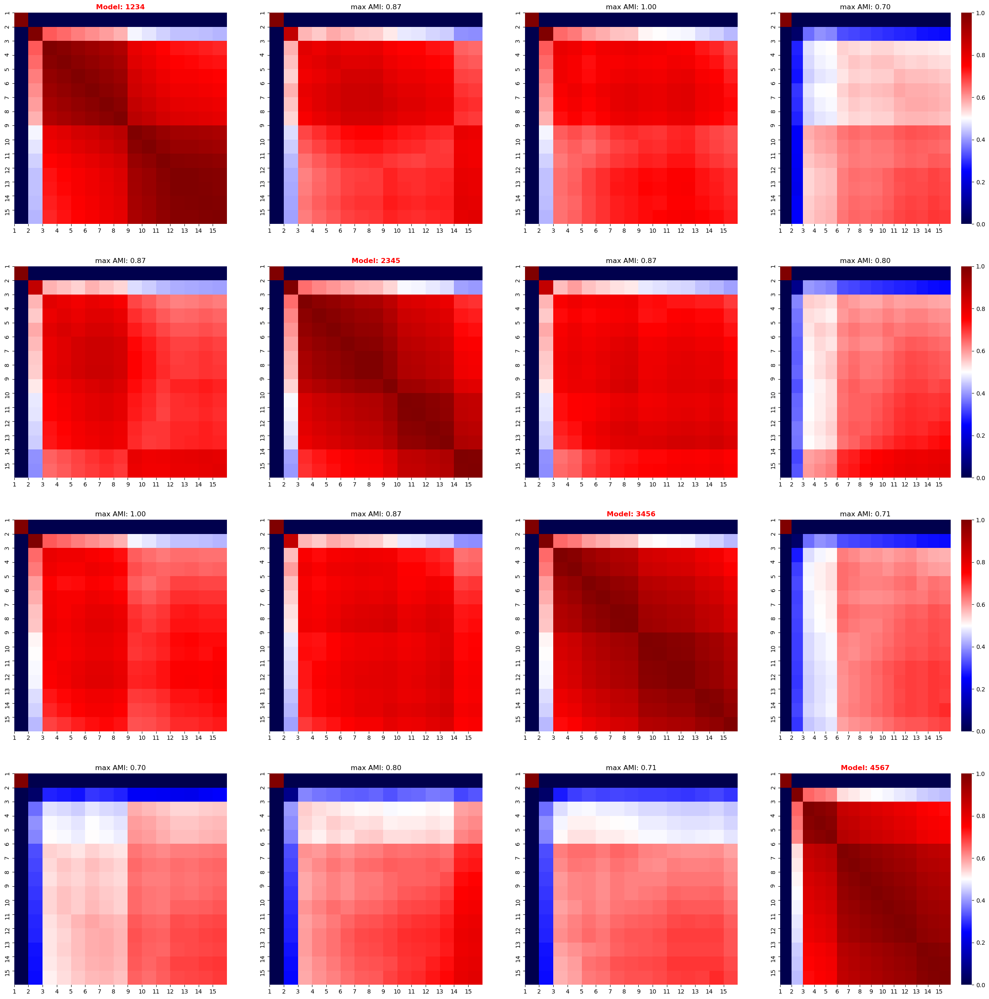

100%|██████████| 4/4 [00:03<00:00,  1.12it/s]


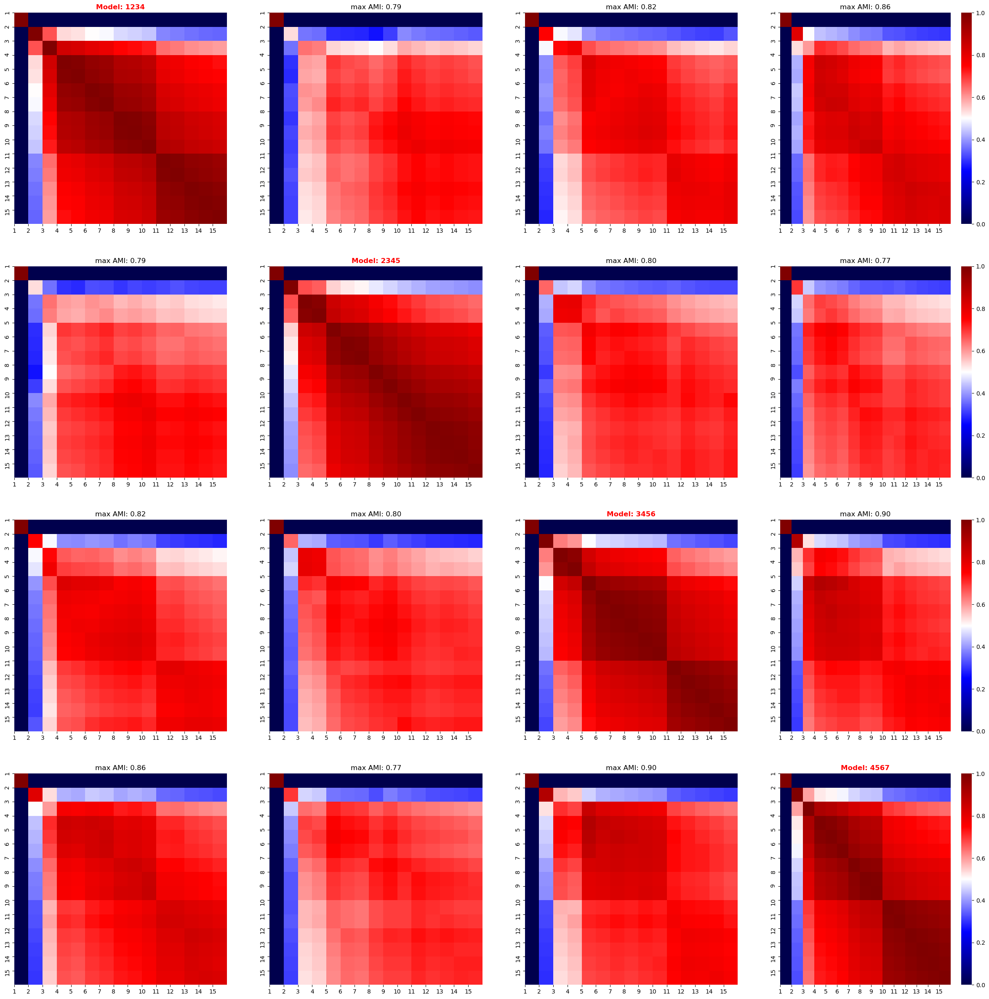

<IPython.core.display.Javascript object>

In [130]:
node_feature_key = "sc_gex_hallmark"

for latent_dim in latent_dims:
    print("Latent dim: {}".format(latent_dim))
    latents_dict_hallgexgae_feat = get_gae_latents_for_seed(
        graph_data=graph_data,
        seeds=seeds,
        node_feature_key=node_feature_key,
        input_dim=1176,
        latent_dim=latent_dim,
        hidden_dim=128,
        n_epochs=1000,
        lr=0.00005,
        link_pred=False,
        reconstruct_features=True,
        feature_decoder_params={
            "latent_dim": latent_dim,
            "output_dim": 1176,
            "hidden_dims": [256, 512, 1024],
        },
        feat_loss=torch.nn.MSELoss(),
        alpha=1,
        beta=1,
        plot_loss=True,
    )
    stability_amis_hallgexgae_feat = stability_cocluster_screen(
        latents_dict_hallgexgae_feat, linkage="average", affinity="cosine"
    )
    plot_amis_matrices(seeds, stability_amis_hallgexgae_feat)
    stability_amis_hallgexgae_feat = stability_cocluster_screen(
        latents_dict_hallgexgae_feat, linkage="average", affinity="euclidean"
    )
    plot_amis_matrices(seeds, stability_amis_hallgexgae_feat)

We find that adding the reconstruction loss as an additional supervisory signal seems to improve the stability of the inferred embeddings. As for all GAE variants we see more stable solutions for the largest embedding dimension considered in the study 128.

---

##### GEX-GAE ( only feature reconstruction)

The final setup is training the same model as above but only on the task of feature reconstruction, i.e. assigning zero-loss for the reconstruction of the adjacency matrix.

Latent dim: 32


 61%|██████    | 606/1000 [00:11<00:07, 50.88it/s]


Training stopped after 607 epochs
Best model found at epoch 555
------------------------------------------------------------
TRAIN loss: 0.004275461658835411
VAL loss: 0.004736813250929117
TEST loss: 0.01644265279173851


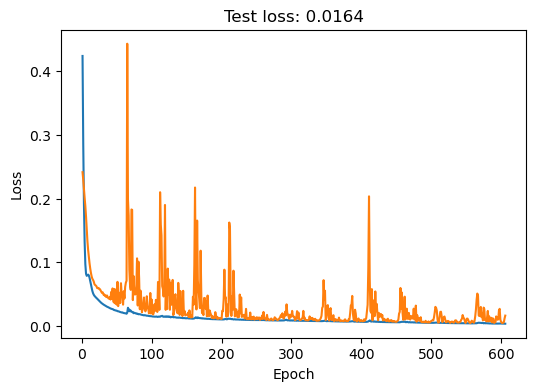

 45%|████▍     | 448/1000 [00:08<00:10, 51.31it/s]

Training stopped after 449 epochs
Best model found at epoch 397
------------------------------------------------------------
TRAIN loss: 0.0069267237558960915
VAL loss: 0.0071068271063268185
TEST loss: 0.009033441543579102


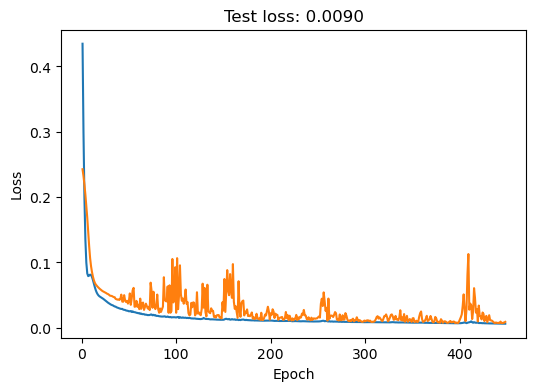

 56%|█████▌    | 562/1000 [00:10<00:08, 51.35it/s]


Training stopped after 563 epochs
Best model found at epoch 511
------------------------------------------------------------
TRAIN loss: 0.004775599576532841
VAL loss: 0.004874000791460276
TEST loss: 0.01859125867486


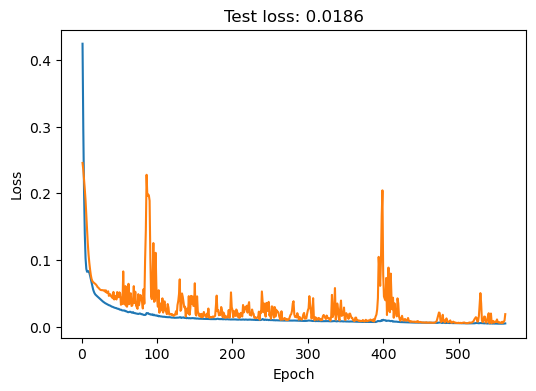

 44%|████▍     | 441/1000 [00:08<00:11, 50.18it/s]


Training stopped after 442 epochs
Best model found at epoch 390
------------------------------------------------------------
TRAIN loss: 0.006983547005802393
VAL loss: 0.007145365234464407
TEST loss: 0.019898032769560814


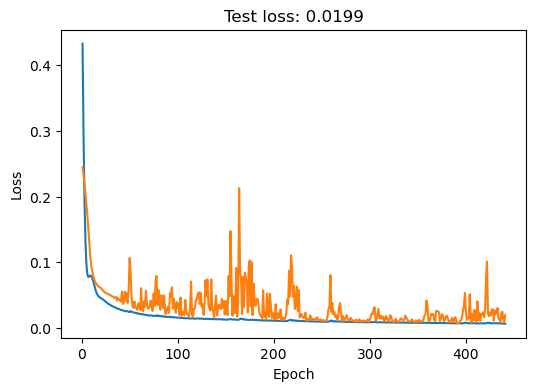

100%|██████████| 4/4 [00:02<00:00,  1.59it/s]


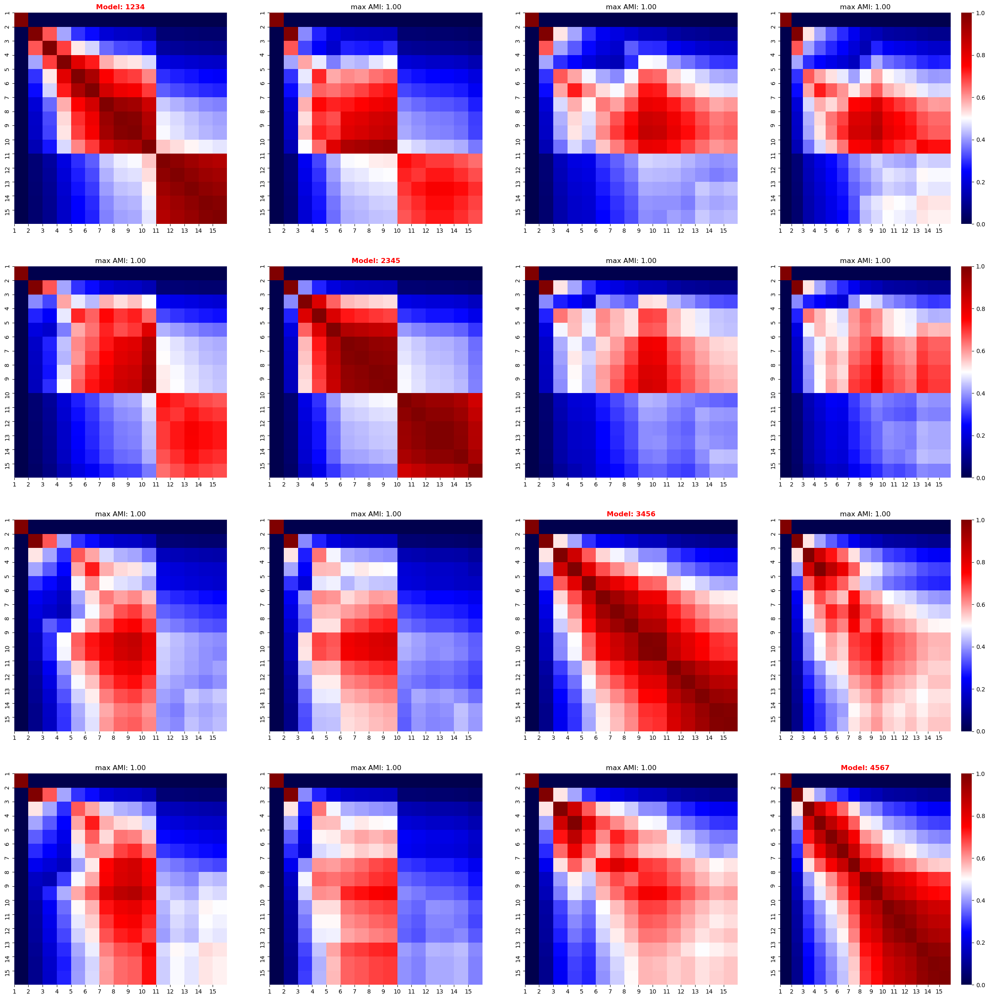

100%|██████████| 4/4 [00:02<00:00,  1.57it/s]


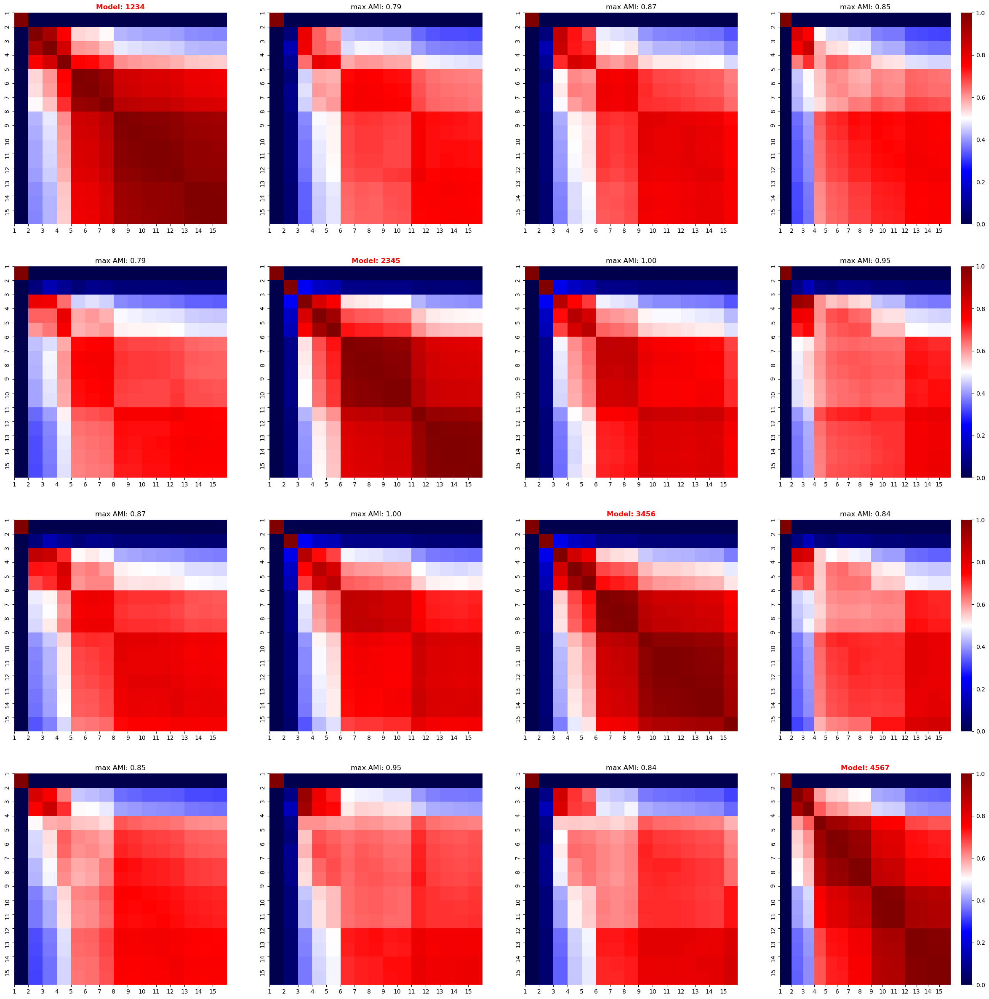

Latent dim: 64


 51%|█████▏    | 514/1000 [00:09<00:09, 51.78it/s]

Training stopped after 515 epochs
Best model found at epoch 463
------------------------------------------------------------
TRAIN loss: 0.005193042103201151
VAL loss: 0.005382671486586332
TEST loss: 0.010151717811822891


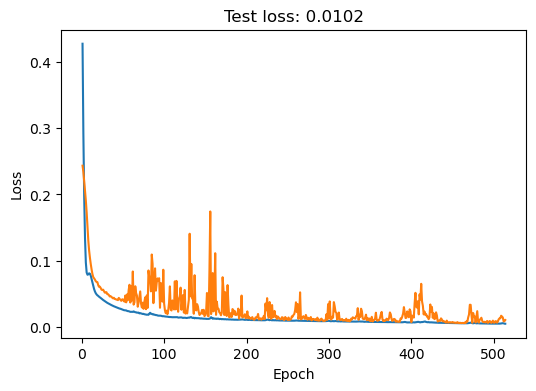

 52%|█████▏    | 515/1000 [00:10<00:09, 51.33it/s]


Training stopped after 516 epochs
Best model found at epoch 464
------------------------------------------------------------
TRAIN loss: 0.004919147584587336
VAL loss: 0.005129699595272541
TEST loss: 0.009828955866396427


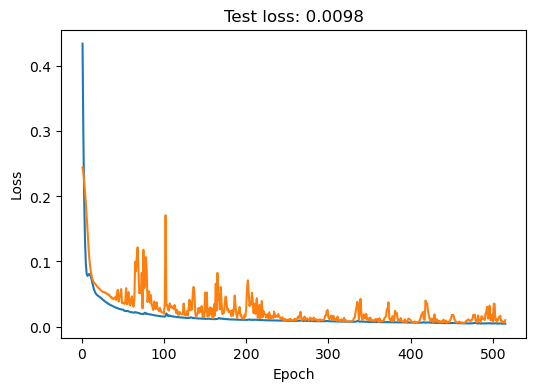

 35%|███▍      | 349/1000 [00:06<00:12, 51.57it/s]


Training stopped after 350 epochs
Best model found at epoch 298
------------------------------------------------------------
TRAIN loss: 0.00827009603381157
VAL loss: 0.008692465722560883
TEST loss: 0.020066771656274796


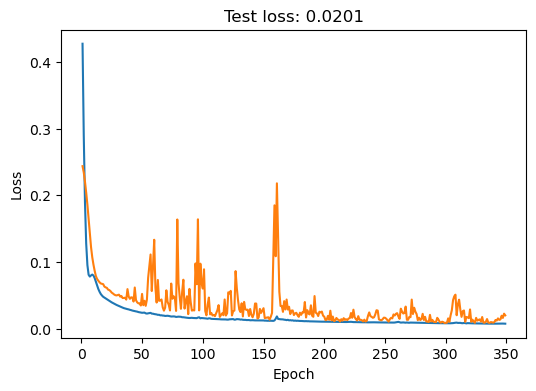

 26%|██▌       | 257/1000 [00:04<00:14, 51.41it/s]


Training stopped after 258 epochs
Best model found at epoch 206
------------------------------------------------------------
TRAIN loss: 0.01010883878916502
VAL loss: 0.010854729451239109
TEST loss: 0.011982356198132038


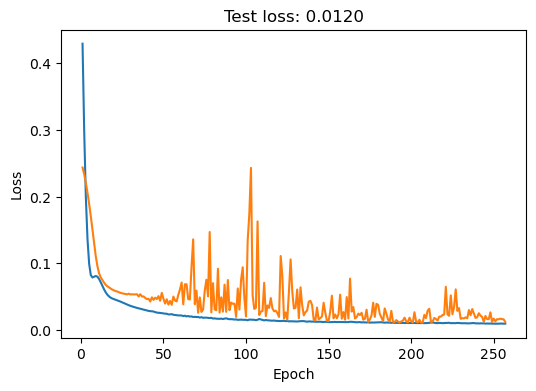

100%|██████████| 4/4 [00:03<00:00,  1.32it/s]


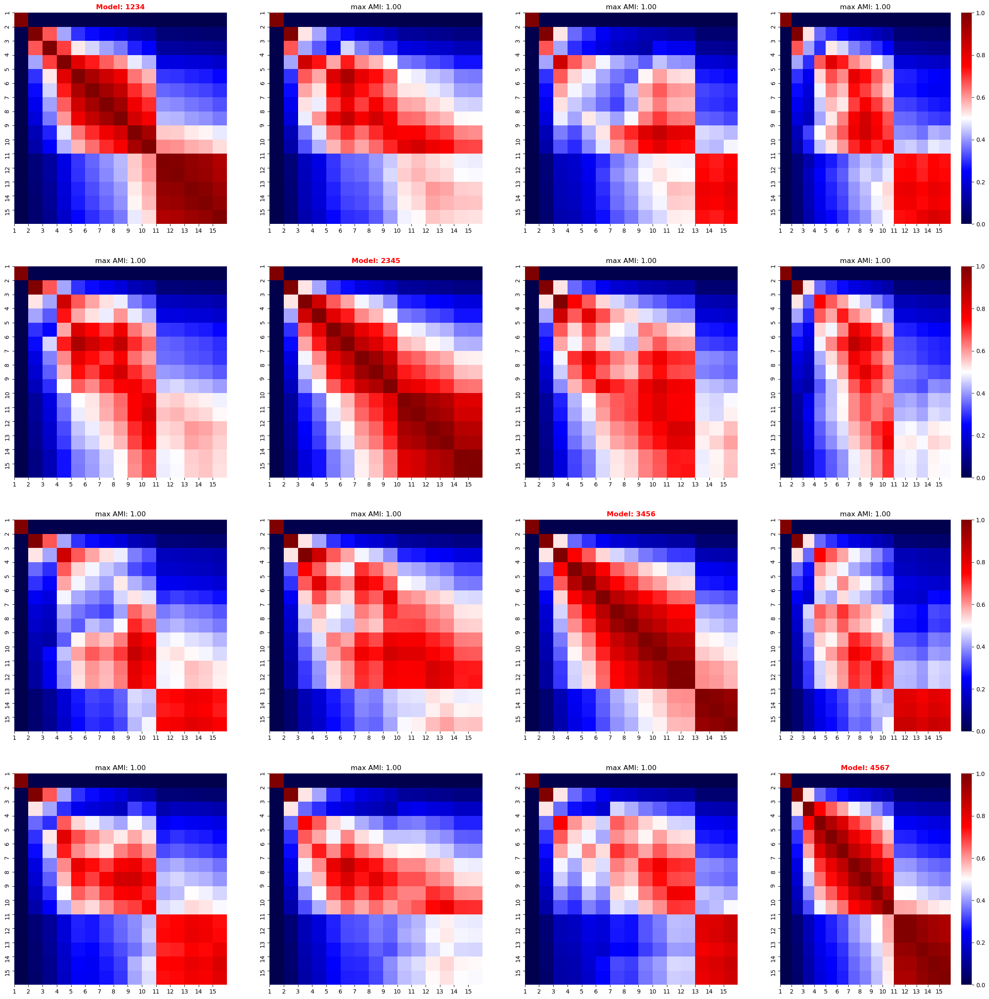

100%|██████████| 4/4 [00:02<00:00,  1.34it/s]


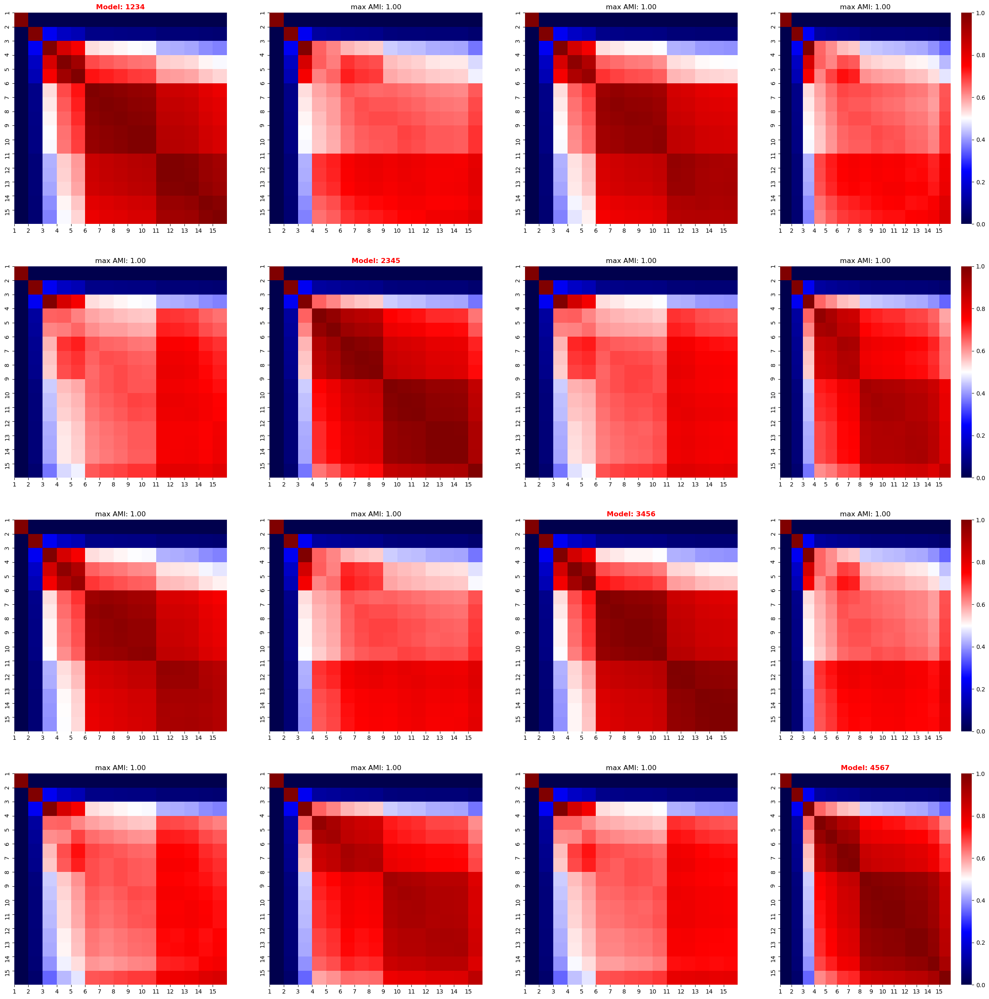

Latent dim: 128


 24%|██▎       | 235/1000 [00:04<00:15, 50.38it/s]


Training stopped after 236 epochs
Best model found at epoch 184
------------------------------------------------------------
TRAIN loss: 0.011258445680141449
VAL loss: 0.011952158063650131
TEST loss: 0.013441843912005424


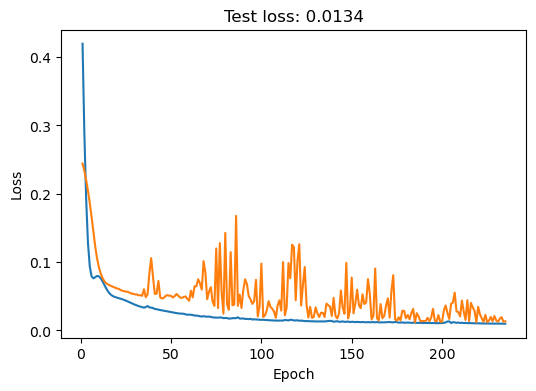

 28%|██▊       | 282/1000 [00:05<00:14, 49.56it/s]


Training stopped after 283 epochs
Best model found at epoch 231
------------------------------------------------------------
TRAIN loss: 0.009972821921110153
VAL loss: 0.010845833458006382
TEST loss: 0.017380675300955772


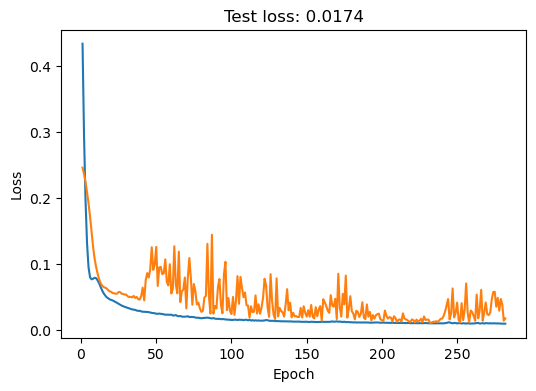

 66%|██████▋   | 663/1000 [00:12<00:06, 51.80it/s]


Training stopped after 664 epochs
Best model found at epoch 612
------------------------------------------------------------
TRAIN loss: 0.0034499671310186386
VAL loss: 0.003888059174641967
TEST loss: 0.004016081336885691


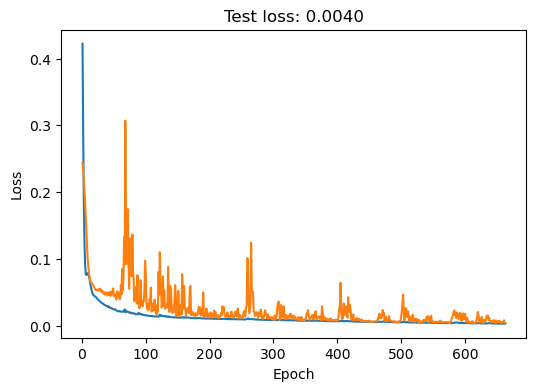

 84%|████████▍ | 838/1000 [00:16<00:03, 50.34it/s]


Training stopped after 839 epochs
Best model found at epoch 787
------------------------------------------------------------
TRAIN loss: 0.0016780466539785266
VAL loss: 0.001897049369290471
TEST loss: 0.0056467498652637005


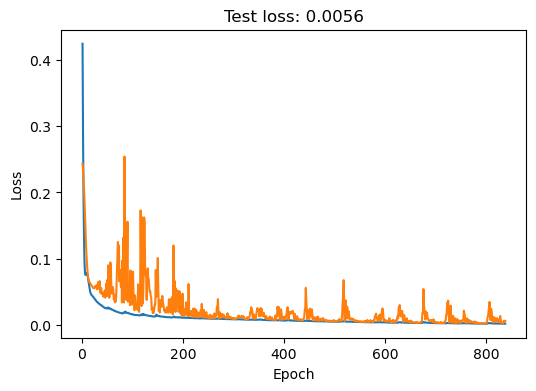

100%|██████████| 4/4 [00:03<00:00,  1.11it/s]


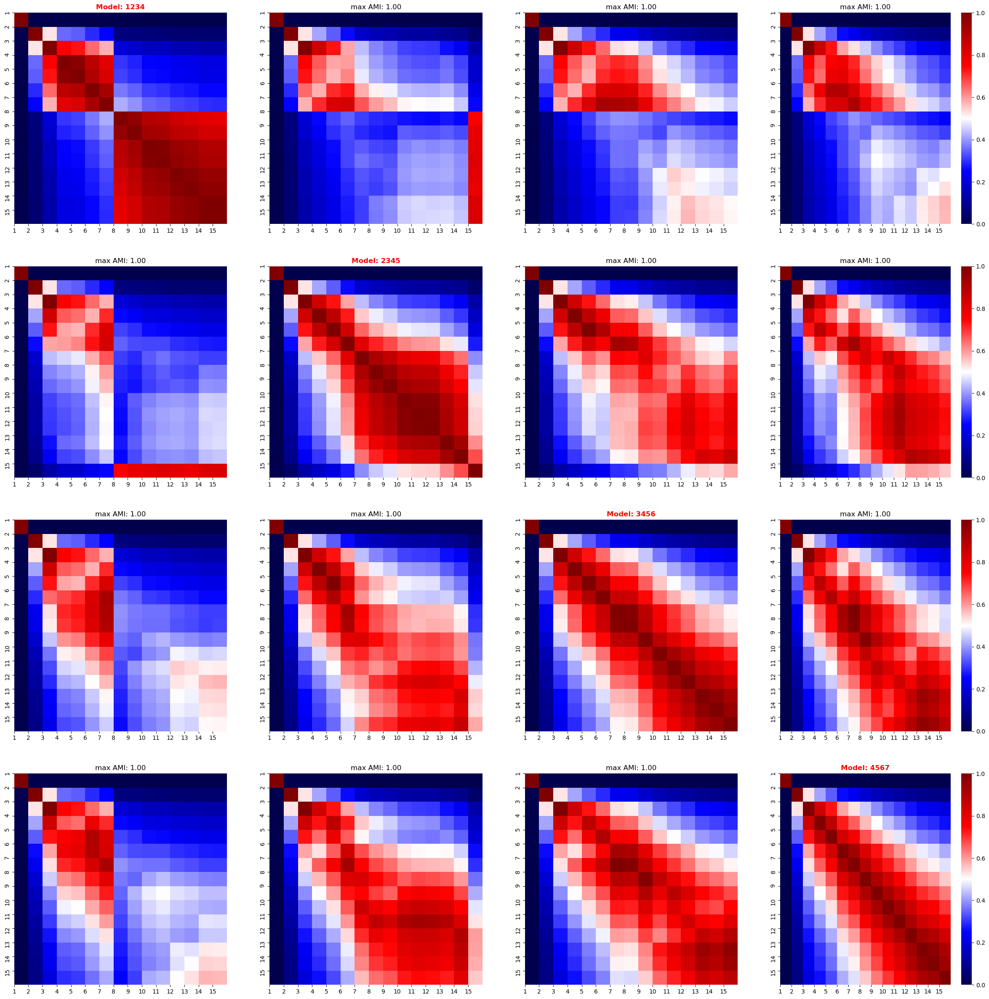

100%|██████████| 4/4 [00:03<00:00,  1.04it/s]


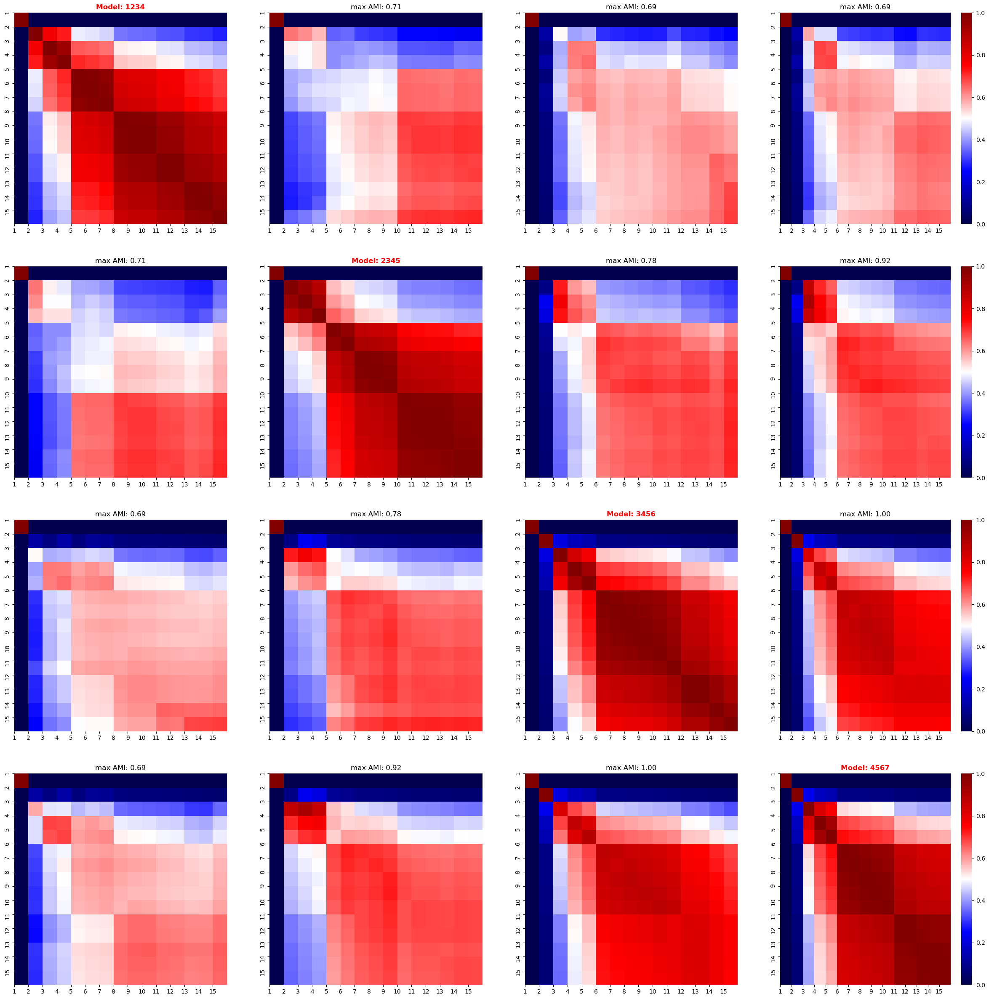

<IPython.core.display.Javascript object>

In [15]:
node_feature_key = "sc_gex"

for latent_dim in latent_dims:
    print("Latent dim: {}".format(latent_dim))
    latents_dict_hallgexgae_feat_only = get_gae_latents_for_seed(
        graph_data=graph_data,
        seeds=seeds,
        node_feature_key=node_feature_key,
        input_dim=1126,
        latent_dim=latent_dim,
        hidden_dim=128,
        n_epochs=1000,
        lr=0.0005,
        link_pred=False,
        reconstruct_features=True,
        feature_decoder_params={
            "latent_dim": latent_dim,
            "output_dim": 1126,
            "hidden_dims": [256, 512, 1024],
        },
        feat_loss=torch.nn.MSELoss(),
        alpha=0,
        beta=1,
        plot_loss=True,
    )
    stability_amis_hallgexgae_feat_only = stability_cocluster_screen(
        latents_dict_hallgexgae_feat_only, linkage="average", affinity="cosine"
    )
    plot_amis_matrices(seeds, stability_amis_hallgexgae_feat_only)
    stability_amis_hallgexgae_feat_only = stability_cocluster_screen(
        latents_dict_hallgexgae_feat_only, linkage="average", affinity="euclidean"
    )
    plot_amis_matrices(seeds, stability_amis_hallgexgae_feat_only)

Compared to the solution that also penalizes the mismatch of the reconstructed adjacency matrix, we see that the embeddings are more dissimilar while still highly stable in general. That is especially for a small number of clusters we often see lower adjusted mutual information scores. As we increase the dimensionality those become more stable. However at a certain point the curse of dimensionality yields to less stable cluster solutions again.

---


### 3.2. Comparison of the inferred latent spaces

We will now compare the inferred latent spaces from the different model setups introduced in the previous section. To this end, we will again assess the co-clustering of the respective models. However, this time we will only consider one random initialization for each model. We will use 128 latent dimensions for the GAE models and 32 latent dimensions for the Node2Vec model as we previously have seen that these provide the most stable results for the respective models. 

100%|██████████| 100/100 [00:59<00:00,  1.67it/s]

Final loss: 0.9382940608947004


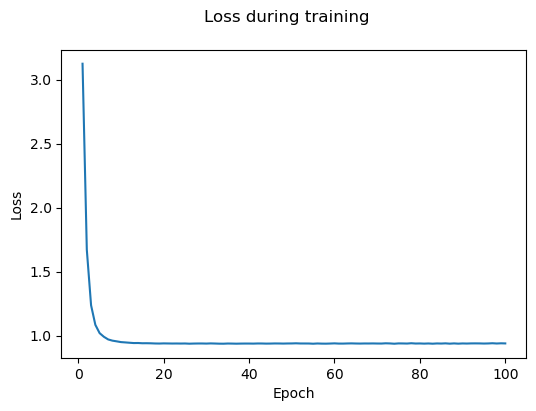

<IPython.core.display.Javascript object>

In [133]:
seed = 1234

# Since the last configuration was an embedding space of size 128, we can simply use the
# precomputed latents for those models
comp_latents_dict = {
    "gae_id": latents_dict_topogae[seed],
    "gae_gex_feat": latents_dict_gexgae_feat[seed],
    "gae_hallgex": latents_dict_hallgexgae[seed],
    "gae_gex_lp": latents_dict_hallgexgae_lp[seed],
    "gae_hallgex_feat": latents_dict_hallgexgae_feat[seed],
    "gae_gex_feat_only": latents_dict_hallgexgae_feat_only[seed],
}

# We quickly recompute the corresponding embeddings for the Node2Vec model
latents_dict_n2v = get_n2v_latents_for_seed(
    graph_data,
    [seed],
    latent_dim=32,
    walk_length=50,
    context_size=5,
    walks_per_node=20,
    batch_size=4,
    num_workers=4,
    lr=0.01,
    n_epochs=100,
    plot_loss=True,
)
comp_latents_dict["n2v"] = latents_dict_n2v[seed]

100%|██████████| 7/7 [00:05<00:00,  1.27it/s]


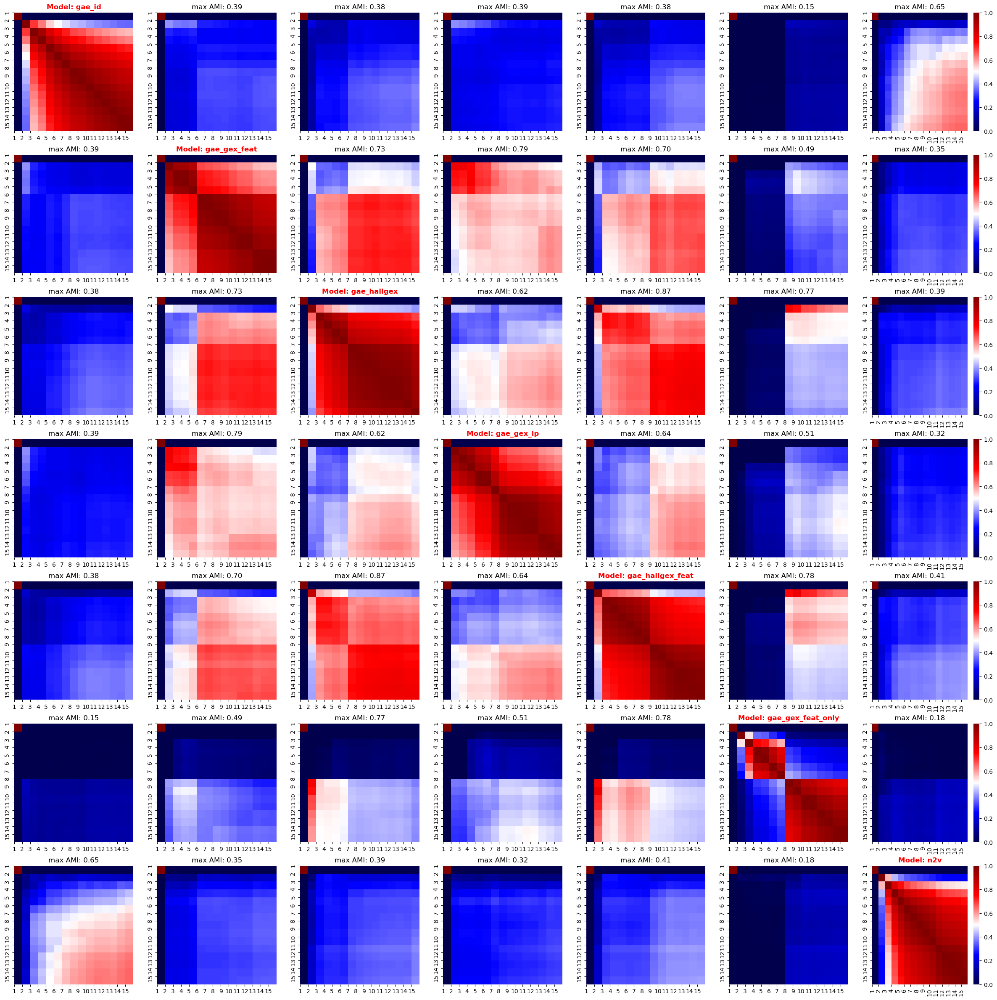

<IPython.core.display.Javascript object>

In [134]:
stability_amis_comparison = stability_cocluster_screen(
    comp_latents_dict, linkage="average", affinity="cosine"
)
plot_amis_matrices(list(comp_latents_dict.keys()), stability_amis_comparison)

100%|██████████| 7/7 [00:05<00:00,  1.21it/s]


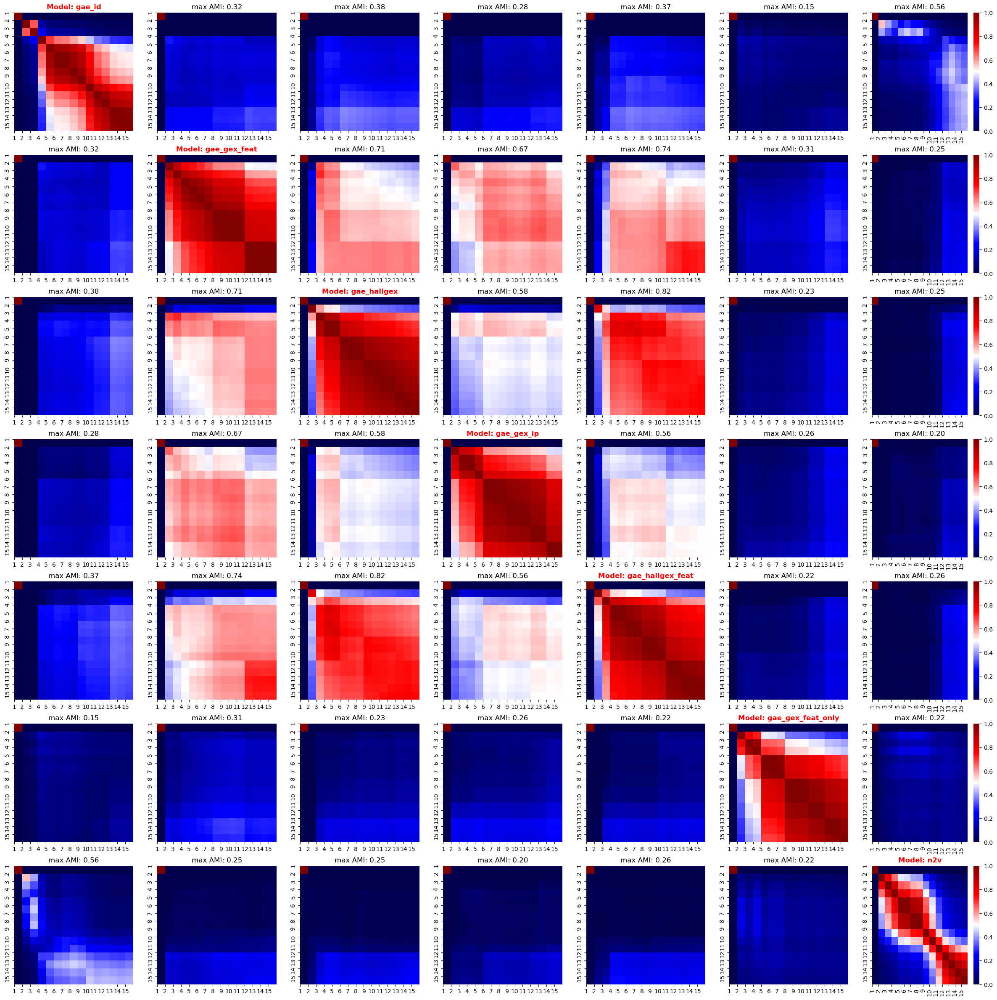

<IPython.core.display.Javascript object>

In [135]:
stability_amis_comparison = stability_cocluster_screen(
    comp_latents_dict, linkage="average", affinity="euclidean"
)
plot_amis_matrices(list(comp_latents_dict.keys()), stability_amis_comparison)

The plot above suggests that only the models that use the sc-RNAseq data as input features yield comparable latent spaces. The other modelsshow only limited co-clustering especially for a low-number of clusters. Thus, we suggest to use the embeddings obtained from the GAE using the Hallmark geneset membership and the single-cell gene expression data as input trained without a data split but on the task of the reconstruction of both the feature matrix and the adjacency matrix. Note that this solution also yielded us the most stable embeddings as seen in the previous analyses.

---

### 3.3. Analyses of the inferred node embeddings

As discussed earlier, we will select the embeddings obtained from the previously described model as the final embeddings of the nodes in our network. We now will visualize and analyze the node embeddings with respect to their clustering to validate that e.g. genes which are known to function together co-cluster in the embedding space.

#### Visualization of the inferred latent space

In [ ]:
latents = comp_latents_dict["gae_gex_feat"]

In [117]:
node_names = getattr(graph_data, "name")
cc_memberships = getattr(graph_data, "cell_cycle")
co_memberships = getattr(graph_data, "chromatin_org")
dr_memberships = getattr(graph_data, "dna_repair")
cd_memberships = getattr(graph_data, "cell_death")
cr_memberships = getattr(graph_data, "cytoskeleton_org")
tf_memberships = getattr(graph_data, "tf")
st_memberships = getattr(graph_data, "spec_target")

<IPython.core.display.Javascript object>

In [118]:
latents = pd.DataFrame(latents, index=node_names)

<IPython.core.display.Javascript object>

In [119]:
embs = TSNE(random_state=1234, perplexity=16).fit_transform(latents)
embs = pd.DataFrame(embs, columns=["tsne-0", "tsne-1"], index=node_names)
embs["cell_cycle"] = cc_memberships.cpu().numpy()
embs["chromatin_org"] = co_memberships.cpu().numpy()
embs["dna_repair"] = dr_memberships.cpu().numpy()
embs["cell_death"] = cd_memberships.cpu().numpy()
embs["cytoskeleton_org"] = cr_memberships.cpu().numpy()
embs["tfs"] = tf_memberships.cpu().numpy()
embs["spec_target"] = st_memberships.cpu().numpy()

<IPython.core.display.Javascript object>

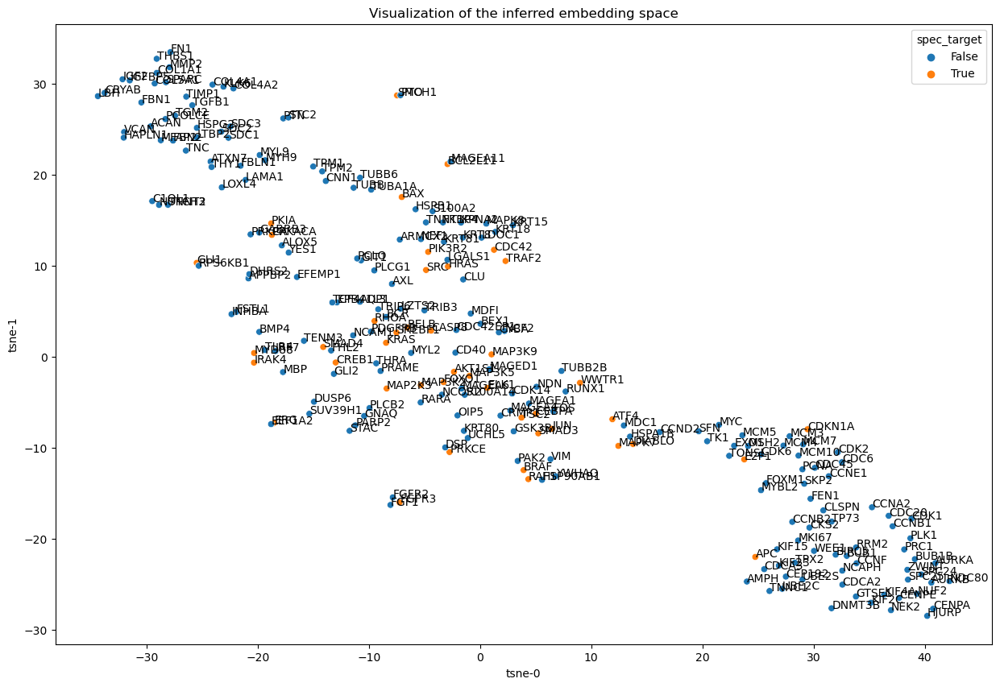

<IPython.core.display.Javascript object>

In [120]:
fig, ax = plt.subplots(figsize=[15, 10])
ax = sns.scatterplot(
    data=embs, x="tsne-0", y="tsne-1", cmap="viridis", hue="spec_target"
)
label_point(
    np.array(embs.loc[:, "tsne-0"]),
    np.array(embs.loc[:, "tsne-1"]),
    np.array(embs.index).astype("str"),
    ax=ax,
)
ax.set_title("Visualization of the inferred embedding space")
plt.show()

#### Clustering of the embedding space

We will now perform a cluster analyses using hierarchical clustering based on the euclidean distances of the individual node embeddings and average linkage.

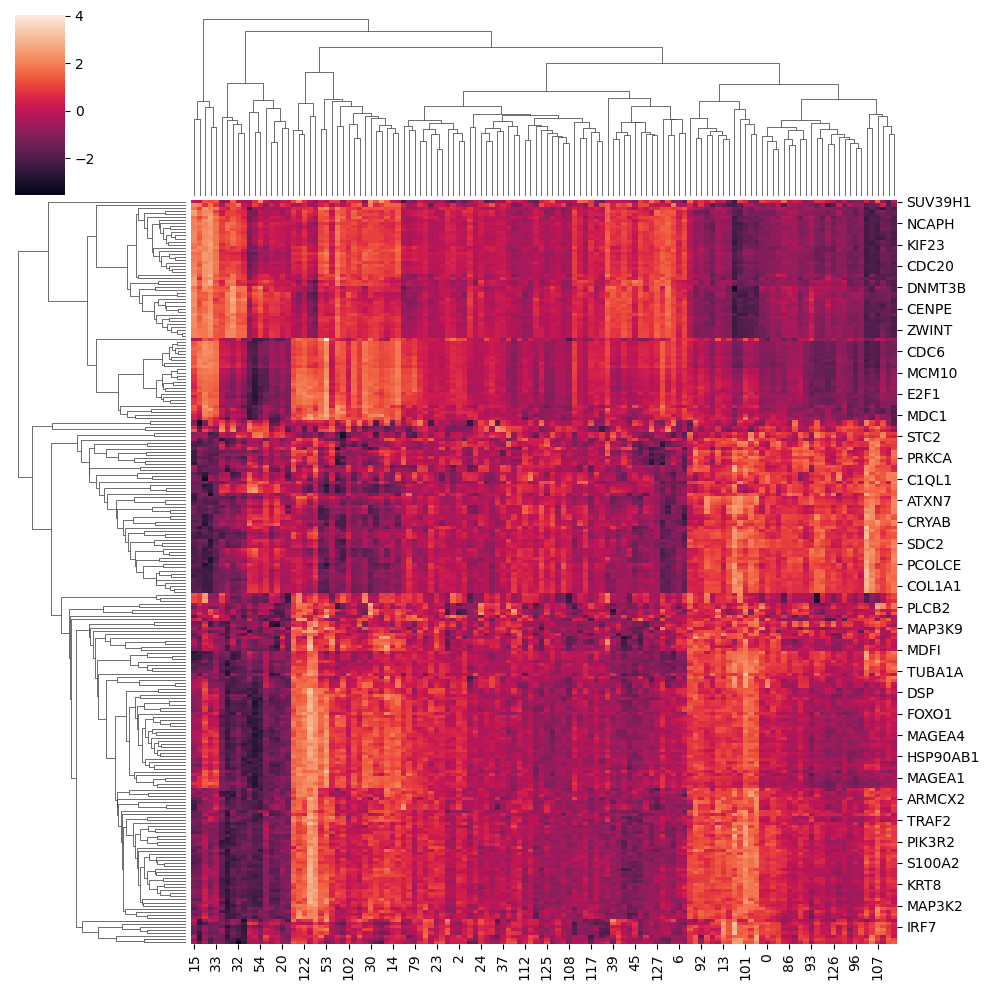

<IPython.core.display.Javascript object>

In [121]:
ax = sns.clustermap(
    latents,
    figsize=[10, 10],
    z_score=0,
    metric="euclidean",
    method="average",
)

To better understand the clustering of the latent space, we will run a agglomerative clustering analysis. To select the optimal number of clusters we look at a number of scores that have been proposed in the literature for a varying number of clusters. We set the range of clusters to 2-15 as in the previous study.

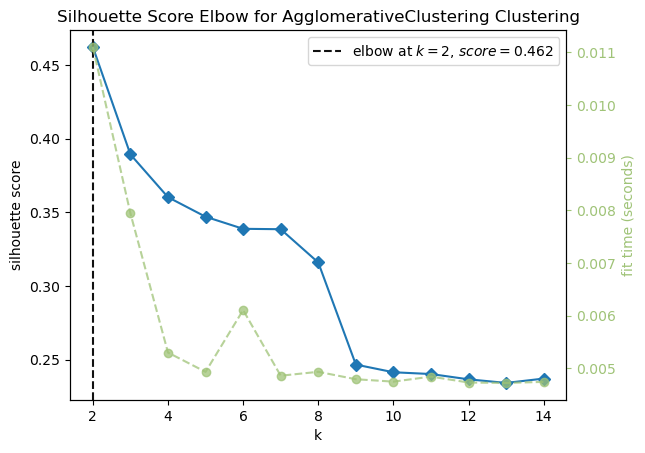

<IPython.core.display.Javascript object>

In [122]:
model = AgglomerativeClustering(linkage="average")
visualizer = KElbowVisualizer(
    model, k=(2, 15), metric="silhouette", timings=True, locate_elbow=True
)

visualizer.fit(latents)
ax = visualizer.show()

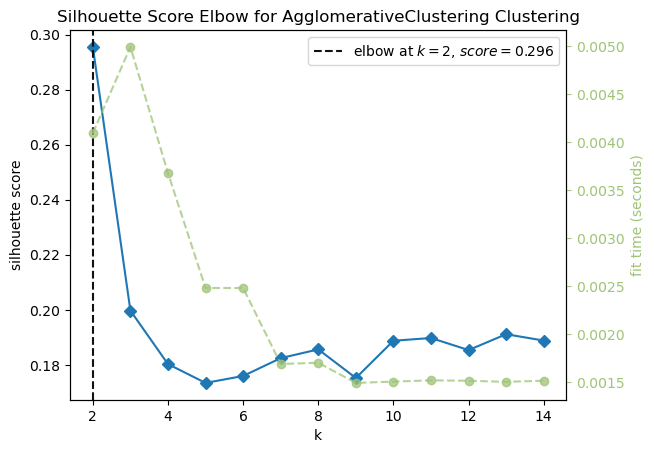

<IPython.core.display.Javascript object>

In [127]:
visualizer = KElbowVisualizer(
    model, k=(2, 15), metric="distortion", timings=True, locate_elbow=True
)

visualizer.fit(np.array(latents))
ax = visualizer.show()

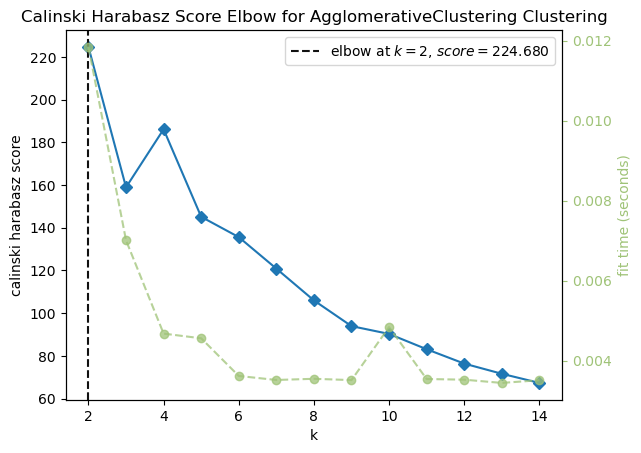

<IPython.core.display.Javascript object>

In [86]:
visualizer = KElbowVisualizer(
    model, k=(2, 15), metric="calinski_harabasz", timings=True, locate_elbow=True
)

visualizer.fit(latents)
ax = visualizer.show()

The support the impression from the previously plotted cluster map that shows to large clusters. Interestingly, the distortion score reaches its elbow at 8 clusters. We will assess these 8 clusters in more depth although these might slightly overcluster the embedding space.

In [124]:
model = AgglomerativeClustering(n_clusters=6, linkage="average")
cluster_labels = model.fit_predict(latents)
cluster_dict = {}
for cluster_label in np.unique(cluster_labels):
    cluster_dict[cluster_label] = list(
        np.array(list(latents.index))[cluster_labels == cluster_label]
    )
for k, v in cluster_dict.items():
    print("Cluster {}: {}".format(k, sorted(v)))
    print("")

Cluster 0: ['AMPH', 'APC', 'BIRC5', 'BUB1', 'CCNA2', 'CCNB1', 'CCNB2', 'CCNF', 'CDC20', 'CDCA2', 'CDCA3', 'CDK1', 'CEP192', 'CKS2', 'CLSPN', 'DNMT3B', 'FEN1', 'KIF15', 'KIF23', 'MKI67', 'NCAPH', 'RRM2', 'TNNC1', 'TP73', 'TPX2', 'UBE2C', 'UBE2S', 'WEE1']

Cluster 1: ['ACAN', 'ATXN7', 'C1QL1', 'COL1A1', 'COL4A1', 'COL4A2', 'COL5A1', 'CRYAB', 'FBLN1', 'FBN1', 'FBN2', 'FN1', 'HAPLN1', 'HSPG2', 'IGF2', 'IGFBP5', 'KLK6', 'LBH', 'LTBP2', 'MFAP2', 'MMP2', 'MYH9', 'MYL9', 'NOTCH3', 'PCOLCE', 'PTN', 'SDC1', 'SDC2', 'SDC3', 'SPARC', 'STC2', 'TGFB1', 'TGM2', 'THBS1', 'THY1', 'TIMP1', 'TNC', 'TNNT2', 'VCAN']

Cluster 2: ['AURKA', 'AURKB', 'BUB1B', 'CENPA', 'CENPE', 'GTSE1', 'HJURP', 'KIF2C', 'KIF4A', 'NDC80', 'NEK2', 'NUF2', 'PLK1', 'PRC1', 'SPC24', 'SPC25', 'ZWINT']

Cluster 3: ['AKT1S1', 'ALOX5', 'APPBP2', 'AQP1', 'ARMCX2', 'ATF4', 'AXL', 'BAX', 'BCL2L11', 'BCR', 'BEX1', 'BMP4', 'BRAF', 'CASP8', 'CD40', 'CDC42', 'CDC42EP1', 'CDK14', 'CEBPA', 'CLU', 'CNN1', 'CREB1', 'CRMP1', 'CYBA', 'DHRS2', 'DIAB

<IPython.core.display.Javascript object>

Performing a statistical over-representation test using the node set of the derived interactome as the background gene set and correcting for multiple testing using the Benjamini-Hochberg method (cut-off at 0.05), we find the following enrichment of the biological processes according to the org.Hs.eg.db in the respective clusters (shown here are the top-3 annotations when ordered by the FDR):

0. Cell division
    * Cell division
1. ECM interactions
    * ECM organization
    * Organitrogen compound catabolic process
    * Tissue development
2. Cell division
    * Mitotic spindle organization
    * Cell division
    * Mitotic spingle organization
3. Transcriptional regulation
    * Positive regulation of transcription (not significant)
    * Positive regulation of cytokine production (not significant)
4. Unknown
5. DNA damage repair
    * DNA dependent DNA replication
    * Double-strand break repair
    * G1/S transition of mitotic cell cycle
    

In [93]:
cluster_label_dict = {
    0: "Cell division",
    1: "ECM interactions",
    2: "Cell division",
    3: "Transcriptional regulation",
    4: "Unknown",
    5: "DNA damage repair",
}

<IPython.core.display.Javascript object>

In [94]:
node_names = getattr(graph_data, "name")
cc_memberships = getattr(graph_data, "cell_cycle")
co_memberships = getattr(graph_data, "chromatin_org")
dr_memberships = getattr(graph_data, "dna_repair")
cd_memberships = getattr(graph_data, "cell_death")
cr_memberships = getattr(graph_data, "cytoskeleton_org")
tf_memberships = getattr(graph_data, "tf")
st_memberships = getattr(graph_data, "spec_target")


embs = TSNE(random_state=1234, perplexity=16).fit_transform(latents)
embs = pd.DataFrame(embs, columns=["tsne-0", "tsne-1"], index=node_names)
embs["cell_cycle"] = cc_memberships.cpu().numpy()
embs["chromatin_org"] = co_memberships.cpu().numpy()
embs["dna_repair"] = dr_memberships.cpu().numpy()
embs["cell_death"] = cd_memberships.cpu().numpy()
embs["cytoskeleton_org"] = cr_memberships.cpu().numpy()
embs["tfs"] = tf_memberships.cpu().numpy()
embs["spec_target"] = st_memberships.cpu().numpy()


embs["cluster"] = cluster_labels
embs["cluster"] = embs.cluster.map(cluster_label_dict)

<IPython.core.display.Javascript object>

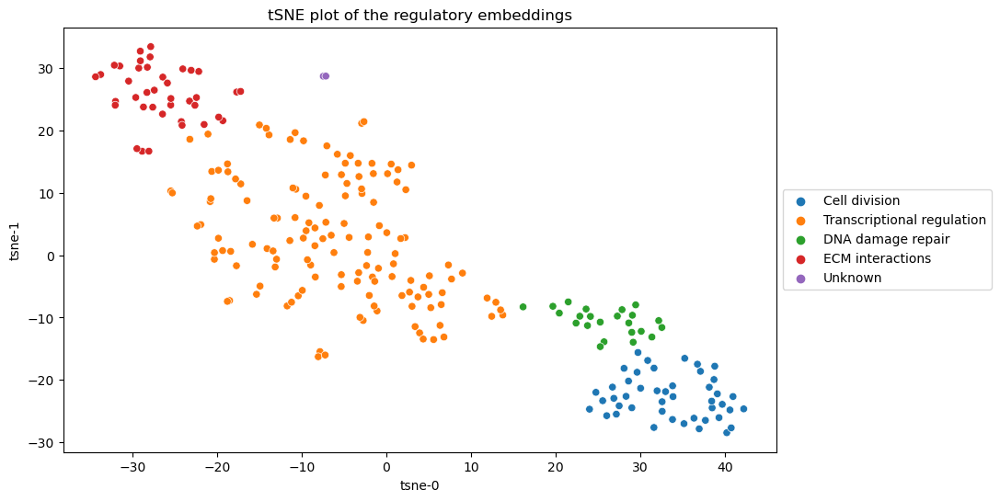

<IPython.core.display.Javascript object>

In [95]:
plt.style.use("default")
fig, ax = plt.subplots(figsize=[10, 6])
ax = sns.scatterplot(data=embs, x="tsne-0", y="tsne-1", cmap="viridis", hue="cluster")
ax.legend(loc="center left", bbox_to_anchor=(1, 0.5))
ax.set_title("tSNE plot of the regulatory embeddings")
plt.show()

We see that the two major clusters are gene involved in cell-cycle regulation and transcriptional and apoptotic regulation.

---

### 3.4. Data export

We will now save the inferred node embeddings for later analyses.

In [96]:
latents.to_csv("../../../data/ppi/embedding/node_embeddings_cv_wo_hallmark.csv")

<IPython.core.display.Javascript object>

---

## 4. Translational analyses

We will now look at the co-clustering of those embeddings with the ones we obtain for the imaging space.

### 4.1. Read in data

First, we read in the previously computed network embedding serving as a proxy for the regulatory space in U2OS cells as well as the respective image embeddings which we use to model the structural space of those cells. Since, we have many images corresponding to a single over-expression condition we will use their mean embeddings as a description of the structural profile in U2OS cells associated with the respective single-gene OE condition.

In [97]:
node_embs = pd.read_csv(
    "../../../data/ppi/embedding/node_embeddings_cv_wo_hallmark.csv", index_col=0
)

<IPython.core.display.Javascript object>

In [99]:
val_latents = pd.read_hdf(
    "../../../data/experiments/image_embeddings/specific_target_embs/resnet_ensemble_centercrops_newtargets_w_ctrl/val_latents.h5",
    index_col=0,
)
test_latents = pd.read_hdf(
    "../../../data/experiments/image_embeddings/specific_target_embs/resnet_ensemble_centercrops_newtargets_w_ctrl/test_latents.h5",
    index_col=0,
)
label_dict = {
    "AKT1S1": 0,
    "ATF2": 1,
    "ATF4": 2,
    "BAX": 3,
    "BCL2L11": 4,
    "BRAF": 5,
    "CASP8": 6,
    "CDC42": 7,
    "CDKN1A": 8,
    "CEBPA": 9,
    "CREB1": 10,
    "CXXC4": 11,
    "DIABLO": 12,
    "E2F1": 13,
    "EIF4EBP1": 14,
    "ELK1": 15,
    "EMPTY": 16,
    "ERG": 17,
    "HRAS": 18,
    "IKBKB": 19,
    "IRAK4": 20,
    "JUN": 21,
    "MAP2K3": 22,
    "MAP3K2": 23,
    "MAP3K5": 24,
    "MAP3K9": 25,
    "MAPK7": 26,
    "MKNK1": 27,
    "MYD88": 28,
    "PKIA": 29,
    "PRKACA": 30,
    "PRKCE": 31,
    "RAF1": 32,
    "RELB": 33,
    "RHOA": 34,
    "SDHA": 35,
    "SMAD4": 36,
    "SRC": 37,
    "SREBF1": 38,
    "STK3": 39,
    "TSC2": 40,
    "WWTR1": 41,
}
label_dict = {v: k for k, v in label_dict.items()}
img_embs = val_latents.append(test_latents)
img_embs.iloc[:, -1] = img_embs.iloc[:, -1].map(label_dict)
img_embs = img_embs.groupby(by="labels").mean()

<IPython.core.display.Javascript object>

---

### 4.2. Analyses of the structural space

To investigate the structural space we will run a similar analyses as in 3.3. First, we will visualize the embeddings using a tSNE plot. Second, we will run an clustering analysis to investigate the local structure of the space.

#### Visualization of the structural space

To visualize the structural space, we will plot the tSNE plot choosing a perplexitiy of 6 which is motivated by the power law for kNN, which is $perplexity \propto \sqrt(N)$.

In [100]:
struct_embs = TSNE(random_state=1234, perplexity=6).fit_transform(img_embs)
struct_embs = pd.DataFrame(
    struct_embs, columns=["tsne-0", "tsne-1"], index=img_embs.index
)

<IPython.core.display.Javascript object>

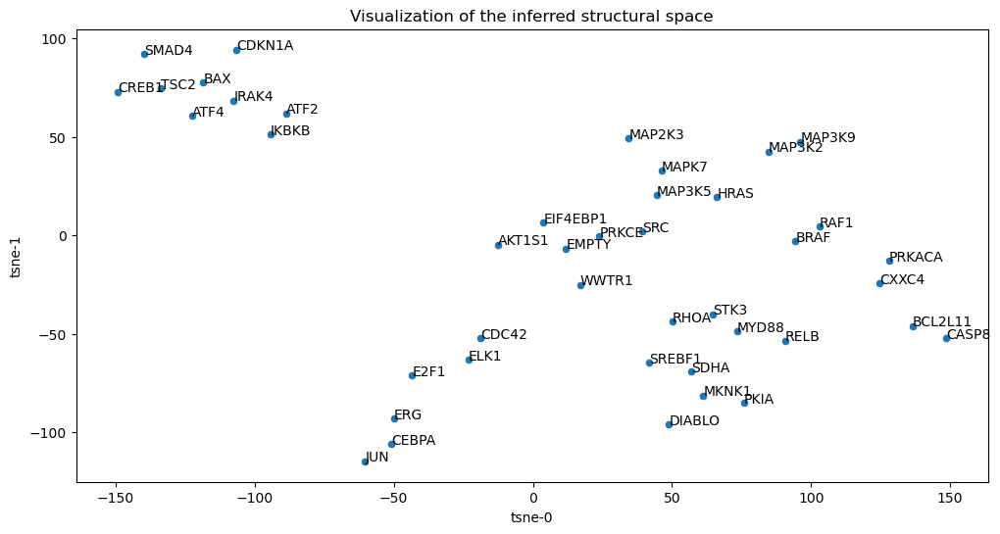

<IPython.core.display.Javascript object>

In [101]:
fig, ax = plt.subplots(figsize=[12, 6])
ax = sns.scatterplot(data=struct_embs, x="tsne-0", y="tsne-1", cmap="viridis")
label_point(
    np.array(struct_embs.loc[:, "tsne-0"]),
    np.array(struct_embs.loc[:, "tsne-1"]),
    np.array(struct_embs.index).astype("str"),
    ax=ax,
)
ax.set_title("Visualization of the inferred structural space")
plt.show()

---

#### Clustering of the structural space

To better understand the clustering of the latent space, we will again run a agglomerative clustering analysis. To select the optimal number of clusters we look at a number of scores that have been proposed in the literature for a varying number of clusters. We set the range of clusters to 2-15 as in the previous study.

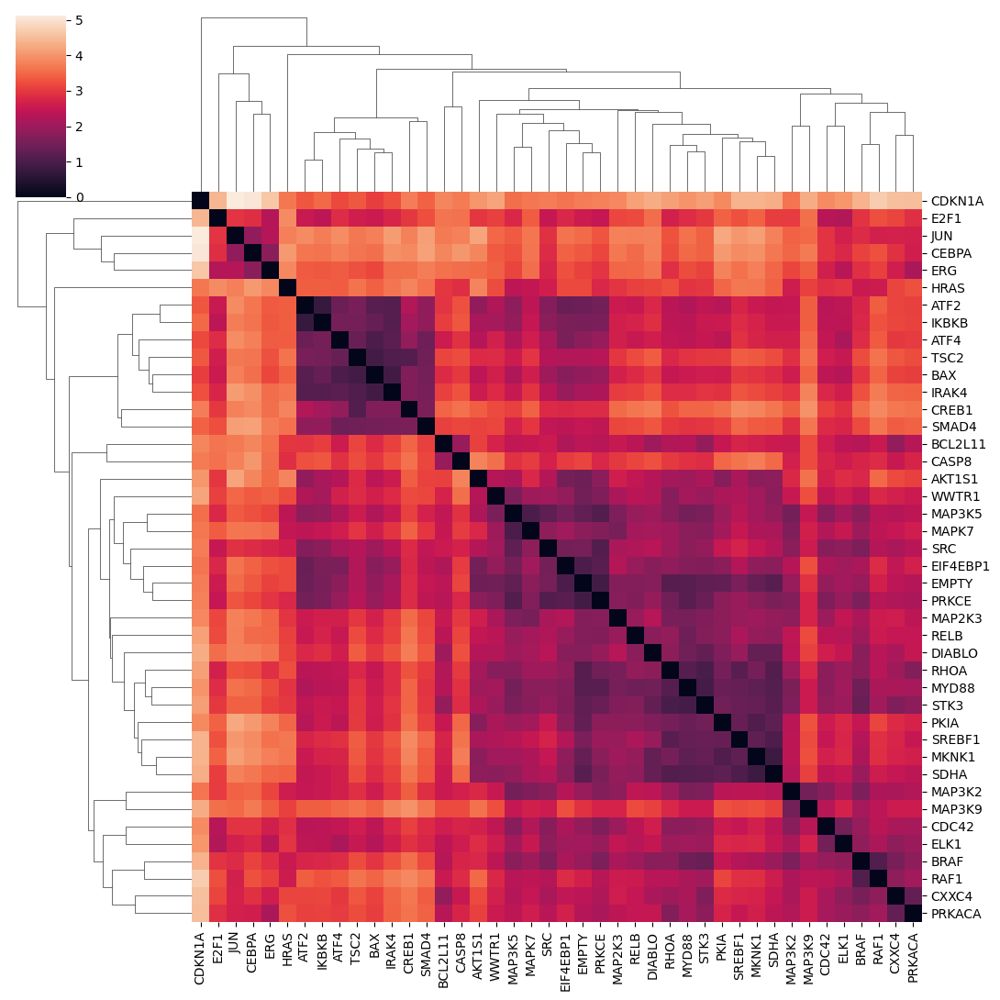

<IPython.core.display.Javascript object>

In [102]:
img_dist = pd.DataFrame(
    squareform(pdist(img_embs, metric="euclidean")),
    columns=list(img_embs.index),
    index=list(img_embs.index),
)
linkage = hc.linkage(sp.distance.squareform(img_dist), method="average")
ax = sns.clustermap(
    img_dist, row_linkage=linkage, col_linkage=linkage, figsize=[11, 11]
)

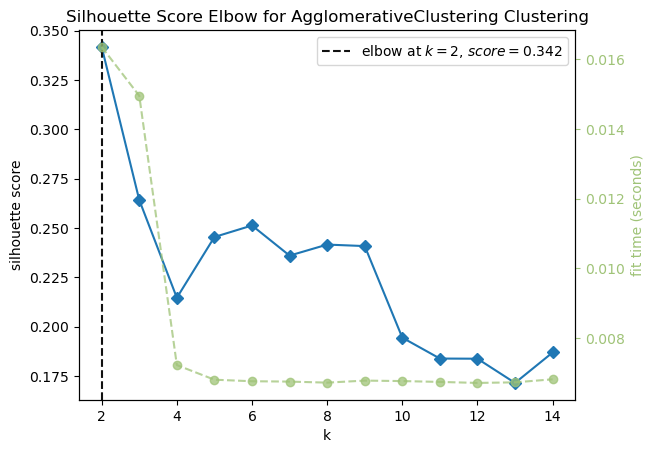

<IPython.core.display.Javascript object>

In [103]:
model = AgglomerativeClustering(linkage="average")
visualizer = KElbowVisualizer(
    model, k=(2, 15), metric="silhouette", timings=True, locate_elbow=True
)

visualizer.fit(img_embs)
ax = visualizer.show()

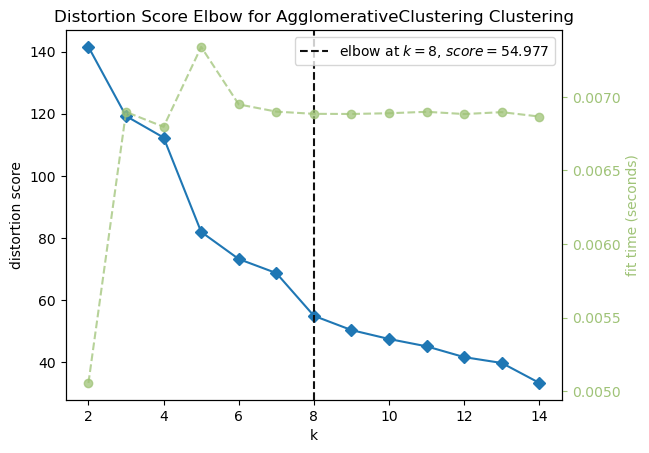

<IPython.core.display.Javascript object>

In [104]:
visualizer = KElbowVisualizer(
    model, k=(2, 15), metric="distortion", timings=True, locate_elbow=True
)

visualizer.fit(img_embs)
ax = visualizer.show()

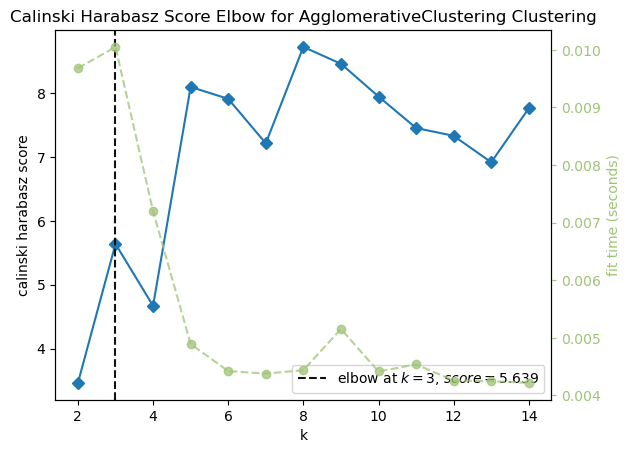

<IPython.core.display.Javascript object>

In [105]:
visualizer = KElbowVisualizer(
    model, k=(2, 15), metric="calinski_harabasz", timings=True, locate_elbow=True
)

visualizer.fit(img_embs)
ax = visualizer.show()

We see that depending on which score we look at the optimal number of clusters seem to be 2,3 or 8. We will choose 8 clusters although this is likely to overcluster the data.

In [106]:
model = AgglomerativeClustering(n_clusters=8, linkage="average")
cluster_labels = model.fit_predict(img_embs)
cluster_dict = {}
for cluster_label in np.unique(cluster_labels):
    cluster_dict[cluster_label] = list(
        np.array(list(img_embs.index))[cluster_labels == cluster_label]
    )
for k, v in cluster_dict.items():
    print("Cluster {}: {}".format(k, sorted(v)))
    print("")

Cluster 0: ['BRAF', 'CDC42', 'CXXC4', 'ELK1', 'MAP3K2', 'MAP3K9', 'PRKACA', 'RAF1']

Cluster 1: ['AKT1S1', 'DIABLO', 'EIF4EBP1', 'EMPTY', 'MAP2K3', 'MAP3K5', 'MAPK7', 'MKNK1', 'MYD88', 'PKIA', 'PRKCE', 'RELB', 'RHOA', 'SDHA', 'SRC', 'SREBF1', 'STK3', 'WWTR1']

Cluster 2: ['CEBPA', 'ERG', 'JUN']

Cluster 3: ['ATF2', 'ATF4', 'BAX', 'CREB1', 'IKBKB', 'IRAK4', 'SMAD4', 'TSC2']

Cluster 4: ['HRAS']

Cluster 5: ['BCL2L11', 'CASP8']

Cluster 6: ['E2F1']

Cluster 7: ['CDKN1A']



<IPython.core.display.Javascript object>

We see that the clustering includes three singeltons given by HRAS, CDKN1A and E2F1 a doublet of BCL2L11 and CASP8 (both yielding highly toxic effects) and a tripplet of the three transcription factors CEBPA, ERG and JUN.
However, we also find 3 bigger clusters, which we analyze using a GO analysis to functionally annotate those. Similar to our approach in 3.3. we will report the top-3 terms of the GO analysis for those clusters that reach an FDR < 0.05.

0. MAPK signaling & stress response (not significant)
    * BRAF, CDC42, CXXC4, ELK1, MAP3K2, MAP3K5, MAP3K9, PRKACA, RAF1


1. Intracellular signal transduction (not significant)
    * AKT1S1, DIABLO, EIF4EBP1, MAP2K3, MAP3K5, MAPK7, MKNK1, MYD88, PKIA, PRKCE, RELB, RHOA, SDHA, SRC, SREBF1, STK3, WWTR1


2. Regulation of cell death/response to organic substance (not significant)
    * ATF2, ATF4, BAX, CREB1, IKBKB, IRAK4, SMAD4, TSC2

---

### 4.3. Translation analysis

Next, we will assess the co-clustering of our inferred estimates of the structural and the regulatory space using a similar approach as described earlier to assess the structural similarity of the different network embeddings.

In [107]:
shared_nodes = set(img_embs.index).intersection(node_embs.index)

<IPython.core.display.Javascript object>

In [108]:
ami_img_node = compute_ami_matrix(
    img_embs.loc[shared_nodes],
    node_embs.loc[shared_nodes],
    affinity=["euclidean", "euclidean"],
    linkage="average",
)

<IPython.core.display.Javascript object>

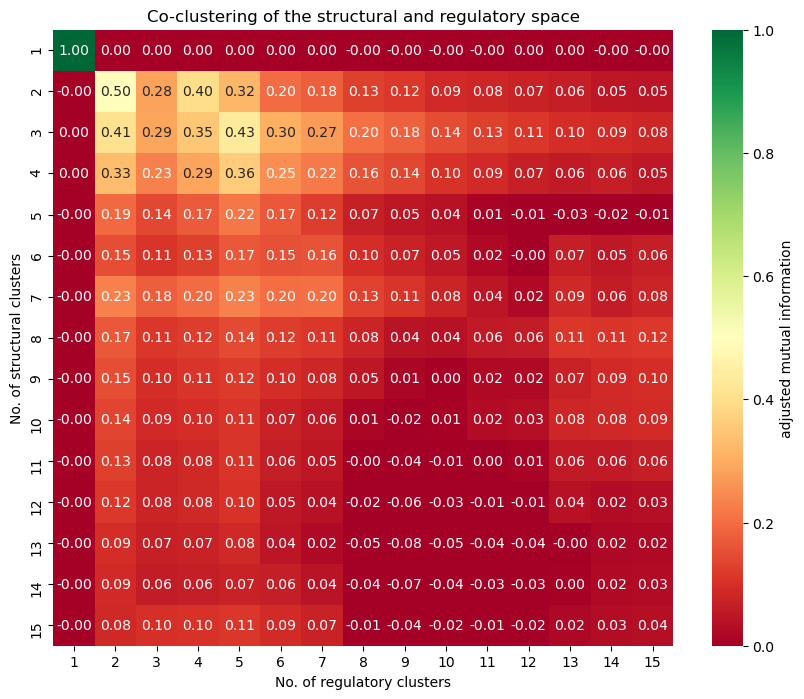

<IPython.core.display.Javascript object>

In [109]:
fig, ax = plt.subplots(figsize=[10, 8])
sns.heatmap(
    ami_img_node,
    cmap="RdYlGn",
    annot=True,
    fmt=".2f",
    ax=ax,
    vmin=0,
    vmax=1,
    cbar_kws={"label": "adjusted mutual information"},
)
ax.set_xticklabels([i + 1 for i in range(15)])
ax.set_yticklabels([i + 1 for i in range(15)])
ax.set_xlabel("No. of regulatory clusters")
ax.set_ylabel("No. of structural clusters")
ax.set_title("Co-clustering of the structural and regulatory space")
plt.show()

In [110]:
cmap_data = pd.read_csv(
    "/home/paysan_d/PycharmProjects/image2reg/data/gex/cmap/filtered_l5_data_u2os.csv",
    index_col=0,
)
cmap_data.head()
cmap_data = cmap_data.groupby("target").median()
cmap_data

,CAMSAP2,PPP2R5A,CISD1,AKAP8,TMEM109,CHAC1,FOS,ORC1,AARS,MLLT11,...,ABCF1,SERPINE1,HLA-DMA,STK10,BLCAP,ASCC3,KDELR2,HIST2H2BE,MELK,SMARCA4
target,,,,,,,,,,,,,,,,,,,,,
ACVR1B,-0.514450,-0.186800,0.089300,0.440700,0.544350,-0.197550,0.518350,-0.199150,-0.213800,0.193600,...,0.341800,0.620850,0.496700,-0.314250,0.189700,0.337900,0.194550,-0.508900,-0.109050,0.018700
ADAM17,0.254800,0.040200,-0.251950,-0.434400,0.077000,-0.014950,-0.036950,-1.055250,0.300150,0.283800,...,0.217550,-0.172350,-0.335450,-0.569100,-0.741500,0.278500,-0.040350,0.719400,-0.134250,0.859750
AKT1,-0.175300,-1.082100,-0.043300,-0.250000,0.034150,-0.339200,-0.249350,-0.014450,-0.505900,1.199350,...,-0.139850,0.502750,1.064050,-0.771200,0.342700,0.267700,-0.058550,-0.307500,-0.515300,0.360950
AKT1S1,-0.279350,-1.578925,-0.231600,0.484600,-0.066150,-0.453650,-0.468950,0.062200,-1.380075,-0.571250,...,-0.044450,1.642675,-0.222175,2.352925,-0.783325,0.478025,-0.321900,-0.508475,0.145675,1.385150
AKT2,-1.120450,0.011550,0.044450,1.121250,0.783850,-0.329950,-0.623600,-0.507700,-0.070500,1.409200,...,0.031650,1.131150,0.135300,1.086600,-0.540200,-0.258800,1.202250,-0.479050,0.251100,0.092850
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
VHL,-0.502725,-0.113050,-0.291275,-0.217225,0.385100,0.217425,1.646875,-0.902000,0.434925,-0.120350,...,0.002075,0.539775,0.200750,-0.185000,0.727400,0.230875,0.156575,-0.303300,0.091225,-0.333700
WWTR1,-1.703150,0.548250,-0.748500,0.202400,-0.669150,-0.449450,-0.785300,-0.334300,-0.990450,0.369600,...,-0.371200,-0.655400,0.337250,-0.421750,0.015400,0.365000,0.486250,-0.554250,0.632500,1.310250
XBP1,0.375625,-0.952575,0.676050,0.653825,-0.211475,-0.128275,0.201275,0.601525,0.375450,0.826475,...,-0.196100,-0.027050,-0.292575,0.332575,-0.223800,-0.703625,0.691350,0.388600,0.238750,-0.030825


<IPython.core.display.Javascript object>

In [111]:
ami_img_cmap = compute_ami_matrix(
    img_embs.loc[shared_nodes.intersection(cmap_data.index)],
    cmap_data.loc[shared_nodes.intersection(cmap_data.index)],
    linkage="average",
    affinity="euclidean",
)

<IPython.core.display.Javascript object>

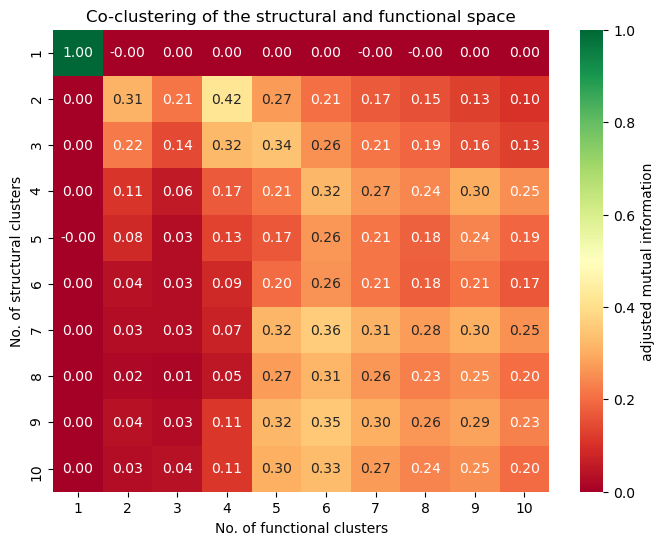

<IPython.core.display.Javascript object>

In [112]:
fig, ax = plt.subplots(figsize=[8, 6])
sns.heatmap(
    ami_img_cmap[:10, :10],
    cmap="RdYlGn",
    annot=True,
    fmt=".2f",
    ax=ax,
    vmin=0,
    vmax=1,
    cbar_kws={"label": "adjusted mutual information"},
)
ax.set_xticklabels([i + 1 for i in range(10)])
ax.set_yticklabels([i + 1 for i in range(10)])
ax.set_xlabel("No. of functional clusters")
ax.set_ylabel("No. of structural clusters")
ax.set_title("Co-clustering of the structural and functional space")
plt.show()

---

In [113]:
ami_node_cmap = compute_ami_matrix(
    node_embs.loc[shared_nodes.intersection(cmap_data.index)],
    cmap_data.loc[shared_nodes.intersection(cmap_data.index)],
)

<IPython.core.display.Javascript object>

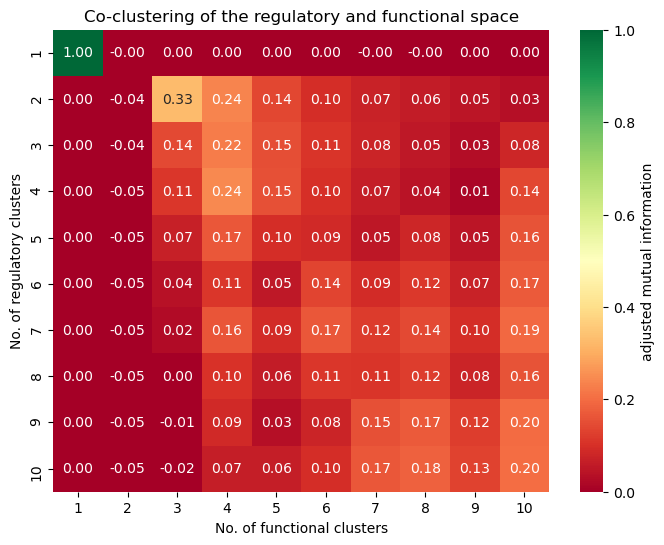

<IPython.core.display.Javascript object>

In [114]:
fig, ax = plt.subplots(figsize=[8, 6])
sns.heatmap(
    ami_node_cmap[:10, :10],
    cmap="RdYlGn",
    annot=True,
    fmt=".2f",
    ax=ax,
    vmin=0,
    vmax=1,
    cbar_kws={"label": "adjusted mutual information"},
)
ax.set_xticklabels([i + 1 for i in range(10)])
ax.set_yticklabels([i + 1 for i in range(10)])
ax.set_xlabel("No. of functional clusters")
ax.set_ylabel("No. of regulatory clusters")
ax.set_title("Co-clustering of the regulatory and functional space")
plt.show()